<a href="https://colab.research.google.com/github/GuilhermeN391/Solar_Modules_Fault_Detection_Week01/blob/main/Solar_Modules_Fault_Detection_Week01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Projeto de Detecção de falha em Módulos Fotovoltaicos com PyTorch.**

# **1ª parte do Projeto Final para a disciplina PPGEEC2318 - APRENDIZADO DE MÁQUINA.**

# **Discentes: Guilherme Nascimento da Silva; Israel da Silva Félix de Lima.**



---


# **Importação das bibliotecas**

In [1]:
import kagglehub
from PIL import Image
import os
import cv2
import shutil
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix
import matplotlib.image as mpimg

# Import PyTorch core and utilities for deep learning
import torch
import torch.optim as optim  # Optimization algorithms
import torch.nn as nn  # Neural network modules
import torch.nn.functional as F  # Functional API for non-parametric operations

# Import PyTorch utilities for data loading and transformations
from torch.utils.data import DataLoader, Dataset, random_split, WeightedRandomSampler
from torchvision.transforms.v2 import Compose, ToImage, Normalize, ToPILImage, Resize, ToDtype

# Import dataset handling and learning rate schedulers
from torchvision.datasets import ImageFolder
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau, MultiStepLR, CyclicLR, LambdaLR

# **Importação do Dataset**

In [23]:
# Install dependencies as needed:
! pip install kagglehub[pandas-datasets]
from kagglehub import KaggleDatasetAdapter

In [24]:
# Download the dataset and get the path to the files
path = kagglehub.dataset_download("marcosgabriel/infrared-solar-modules")

# Construct the full path to the JSON file
file_path = os.path.join(path, "2020-02-14_InfraredSolarModules", "InfraredSolarModules", "module_metadata.json")

# Load the JSON file into a pandas DataFrame
df = pd.read_json(path_or_buf=file_path, orient='index').sort_index()

df = df.assign(image_filepath=df.image_filepath.apply(lambda x:os.path.join('/kaggle/input/infrared-solar-modules/2020-02-14_InfraredSolarModules/InfraredSolarModules',x)))

classification_type = 'anomaly_class';df


#print("First 5 records:", df.head())

,image_filepath,anomaly_class
0,/kaggle/input/infrared-solar-modules/2020-02-1...,Offline-Module
1,/kaggle/input/infrared-solar-modules/2020-02-1...,Offline-Module
2,/kaggle/input/infrared-solar-modules/2020-02-1...,Offline-Module
3,/kaggle/input/infrared-solar-modules/2020-02-1...,Offline-Module
4,/kaggle/input/infrared-solar-modules/2020-02-1...,Offline-Module
...,...,...
19995,/kaggle/input/infrared-solar-modules/2020-02-1...,No-Anomaly
19996,/kaggle/input/infrared-solar-modules/2020-02-1...,No-Anomaly
19997,/kaggle/input/infrared-solar-modules/2020-02-1...,No-Anomaly
19998,/kaggle/input/infrared-solar-modules/2020-02-1...,No-Anomaly


In [25]:
df.anomaly_class.value_counts()

,count
anomaly_class,
No-Anomaly,10000
Cell,1877
Vegetation,1639
Diode,1499
Cell-Multi,1288
Shadowing,1056
Cracking,940
Offline-Module,827
Hot-Spot,249


In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20000 entries, 0 to 19999
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   image_filepath  20000 non-null  object
 1   anomaly_class   20000 non-null  object
dtypes: object(2)
memory usage: 468.8+ KB


In [27]:
df.to_csv("Infrared_Solar_Modules_data.csv",index=False)

# **Análise Exploratória de Dados (EDA)**

Análise dados copiada de https://www.kaggle.com/code/aliakbaryaghoubi/solar-modules-fault-detection-with-cnn-pytorch

In [28]:
def plot(anomaly_type='all', plot_type='jet'):

    if anomaly_type == 'all':
        sample = df.groupby('anomaly_class').sample()
    else:
        sample = df[df['anomaly_class']==anomaly_type].sample(12)

    plt.figure(figsize=(18,18))
    for i, (image_path, class_name) in enumerate(sample.values, start=1):
        image = cv2.imread(image_path, 0)

        plt.subplot(2, 6, i)
        plt.imshow(image, cmap=plot_type)
        plt.subplots_adjust(top=0.52, hspace=0.2)
        plt.title(class_name,fontsize=20)
        plt.axis('off')
    plt.show()

# **Architecture class**

In [11]:
class Architecture(object):
    def __init__(self, model, loss_fn, optimizer):
        # Here we define the attributes of our class

        # We start by storing the arguments as attributes
        # to use them later
        self.model = model
        self.loss_fn = loss_fn
        self.optimizer = optimizer
        self.device = 'cuda' if torch.cuda.is_available() else 'cpu'
        # Let's send the model to the specified device right away
        self.model.to(self.device)

        # These attributes are defined here, but since they are
        # not informed at the moment of creation, we keep them None
        self.train_loader = None
        self.val_loader = None

        # These attributes are going to be computed internally
        self.losses = []
        self.val_losses = []
        self.total_epochs = 0

        # Creates the train_step function for our model,
        # loss function and optimizer
        # Note: there are NO ARGS there! It makes use of the class
        # attributes directly
        self.train_step_fn = self._make_train_step_fn()
        # Creates the val_step function for our model and loss
        self.val_step_fn = self._make_val_step_fn()

        # for hook purposes
        self.handles = {}
        self.visualization = {}

    def to(self, device):
        # This method allows the user to specify a different device
        # It sets the corresponding attribute (to be used later in
        # the mini-batches) and sends the model to the device
        try:
            self.device = device
            self.model.to(self.device)
        except RuntimeError:
            self.device = 'cuda' if torch.cuda.is_available() else 'cpu'
            print(f"Couldn't send it to {device}, sending it to {self.device} instead.")
            self.model.to(self.device)

    def set_loaders(self, train_loader, val_loader=None):
        # This method allows the user to define which train_loader (and val_loader, optionally) to use
        # Both loaders are then assigned to attributes of the class
        # So they can be referred to later
        self.train_loader = train_loader
        self.val_loader = val_loader

    def _make_train_step_fn(self):
        # This method does not need ARGS... it can refer to
        # the attributes: self.model, self.loss_fn and self.optimizer

        # Builds function that performs a step in the train loop
        def perform_train_step_fn(x, y):
            # Sets model to TRAIN mode
            self.model.train()

            # Step 1 - Computes our model's predicted output - forward pass
            yhat = self.model(x)
            # Step 2 - Computes the loss
            loss = self.loss_fn(yhat, y)
            # Step 3 - Computes gradients for both "a" and "b" parameters
            loss.backward()
            # Step 4 - Updates parameters using gradients and the learning rate
            self.optimizer.step()
            self.optimizer.zero_grad()

            # Returns the loss
            return loss.item()

        # Returns the function that will be called inside the train loop
        return perform_train_step_fn

    def _make_val_step_fn(self):
        # Builds function that performs a step in the validation loop
        def perform_val_step_fn(x, y):
            # Sets model to EVAL mode
            self.model.eval()

            # Step 1 - Computes our model's predicted output - forward pass
            yhat = self.model(x)
            # Step 2 - Computes the loss
            loss = self.loss_fn(yhat, y)
            # There is no need to compute Steps 3 and 4, since we don't update parameters during evaluation
            return loss.item()

        return perform_val_step_fn

    def _mini_batch(self, validation=False):
        # The mini-batch can be used with both loaders
        # The argument `validation`defines which loader and
        # corresponding step function is going to be used
        if validation:
            data_loader = self.val_loader
            step_fn = self.val_step_fn
        else:
            data_loader = self.train_loader
            step_fn = self.train_step_fn

        if data_loader is None:
            return None

        # Once the data loader and step function, this is the same
        # mini-batch loop we had before
        mini_batch_losses = []
        for x_batch, y_batch in data_loader:
            x_batch = x_batch.to(self.device)
            y_batch = y_batch.to(self.device)

            mini_batch_loss = step_fn(x_batch, y_batch)
            mini_batch_losses.append(mini_batch_loss)

        loss = np.mean(mini_batch_losses)
        return loss

    # this function was updated in this class
    def set_seed(self, seed=42):
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False
        torch.manual_seed(seed)
        np.random.seed(seed)
        random.seed(seed)
        try:
            self.train_loader.sampler.generator.manual_seed(seed)
        except AttributeError:
            pass

    def train(self, n_epochs, seed=42):
        # To ensure reproducibility of the training process
        self.set_seed(seed)

        for epoch in range(n_epochs):
            # Keeps track of the numbers of epochs
            # by updating the corresponding attribute
            self.total_epochs += 1

            # inner loop
            # Performs training using mini-batches
            loss = self._mini_batch(validation=False)
            self.losses.append(loss)

            # VALIDATION
            # no gradients in validation!
            with torch.no_grad():
                # Performs evaluation using mini-batches
                val_loss = self._mini_batch(validation=True)
                self.val_losses.append(val_loss)

    def save_checkpoint(self, filename):
        # Builds dictionary with all elements for resuming training
        checkpoint = {'epoch': self.total_epochs,
                      'model_state_dict': self.model.state_dict(),
                      'optimizer_state_dict': self.optimizer.state_dict(),
                      'loss': self.losses,
                      'val_loss': self.val_losses}

        torch.save(checkpoint, filename)

    def load_checkpoint(self, filename):
        # Loads dictionary
        checkpoint = torch.load(filename)

        # Restore state for model and optimizer
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

        self.total_epochs = checkpoint['epoch']
        self.losses = checkpoint['loss']
        self.val_losses = checkpoint['val_loss']

        self.model.train() # always use TRAIN for resuming training

    def predict(self, x):
        # Set is to evaluation mode for predictions
        self.model.eval()
        # Takes aNumpy input and make it a float tensor
        x_tensor = torch.as_tensor(x).float()
        # Send input to device and uses model for prediction
        y_hat_tensor = self.model(x_tensor.to(self.device))
        # Set it back to train mode
        self.model.train()
        # Detaches it, brings it to CPU and back to Numpy
        return y_hat_tensor.detach().cpu().numpy()

    def count_parameters(self):
      return sum(p.numel() for p in self.model.parameters() if p.requires_grad)

    def plot_losses(self):
        fig = plt.figure(figsize=(10, 4))
        plt.plot(self.losses, label='Training Loss', c='b')
        plt.plot(self.val_losses, label='Validation Loss', c='r')
        plt.yscale('log')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.tight_layout()
        return fig

    @staticmethod
    def _visualize_tensors(axs, x, y=None, yhat=None, layer_name='', title=None):
        # The number of images is the number of subplots in a row
        n_images = len(axs)
        # Gets max and min values for scaling the grayscale
        minv, maxv = np.min(x[:n_images]), np.max(x[:n_images])
        # For each image
        for j, image in enumerate(x[:n_images]):
            ax = axs[j]
            # Sets title, labels, and removes ticks
            if title is not None:
                ax.set_title(f'{title} #{j}', fontsize=12)
            shp = np.atleast_2d(image).shape
            ax.set_ylabel(
                f'{layer_name}\n{shp[0]}x{shp[1]}',
                rotation=0, labelpad=40
            )
            xlabel1 = '' if y is None else f'\nLabel: {y[j]}'
            xlabel2 = '' if yhat is None else f'\nPredicted: {yhat[j]}'
            xlabel = f'{xlabel1}{xlabel2}'
            if len(xlabel):
                ax.set_xlabel(xlabel, fontsize=12)
            ax.set_xticks([])
            ax.set_yticks([])

            # Plots weight as an image
            ax.imshow(
                np.atleast_2d(image.squeeze()),
                cmap='gray',
                vmin=minv,
                vmax=maxv
            )
        return

    def visualize_filters(self, layer_name, **kwargs):
        try:
            # Gets the layer object from the model
            layer = self.model
            for name in layer_name.split('.'):
                layer = getattr(layer, name)
            # We are only looking at filters for 2D convolutions
            if isinstance(layer, nn.Conv2d):
                # Takes the weight information
                weights = layer.weight.data.cpu().numpy()
                # weights -> (channels_out (filter), channels_in, H, W)
                n_filters, n_channels, _, _ = weights.shape

                # Builds a figure
                size = (2 * n_channels + 2, 2 * n_filters)
                fig, axes = plt.subplots(n_filters, n_channels,
                                        figsize=size)
                axes = np.atleast_2d(axes)
                axes = axes.reshape(n_filters, n_channels)
                # For each channel_out (filter)
                for i in range(n_filters):
                    Architecture._visualize_tensors(
                        axes[i, :],
                        weights[i],
                        layer_name=f'Filter #{i}',
                        title='Channel'
                    )

                for ax in axes.flat:
                    ax.label_outer()

                fig.tight_layout()
                return fig
        except AttributeError:
            return

    def attach_hooks(self, layers_to_hook, hook_fn=None):
        # Clear any previous values
        self.visualization = {}
        # Creates the dictionary to map layer objects to their names
        modules = list(self.model.named_modules())
        layer_names = {layer: name for name, layer in modules[1:]}

        if hook_fn is None:
            # Hook function to be attached to the forward pass
            def hook_fn(layer, inputs, outputs):
                # Gets the layer name
                name = layer_names[layer]
                # Detaches outputs
                values = outputs.detach().cpu().numpy()
                # Since the hook function may be called multiple times
                # for example, if we make predictions for multiple mini-batches
                # it concatenates the results
                if self.visualization[name] is None:
                    self.visualization[name] = values
                else:
                    self.visualization[name] = np.concatenate([self.visualization[name], values])

        for name, layer in modules:
            # If the layer is in our list
            if name in layers_to_hook:
                # Initializes the corresponding key in the dictionary
                self.visualization[name] = None
                # Register the forward hook and keep the handle in another dict
                self.handles[name] = layer.register_forward_hook(hook_fn)

    def remove_hooks(self):
        # Loops through all hooks and removes them
        for handle in self.handles.values():
            handle.remove()
        # Clear the dict, as all hooks have been removed
        self.handles = {}

    def visualize_outputs(self, layers, n_images=10, y=None, yhat=None):
        layers = filter(lambda l: l in self.visualization.keys(), layers)
        layers = list(layers)
        shapes = [self.visualization[layer].shape for layer in layers]
        n_rows = [shape[1] if len(shape) == 4 else 1
                  for shape in shapes]
        total_rows = np.sum(n_rows)

        fig, axes = plt.subplots(total_rows, n_images,
                                figsize=(1.5*n_images, 1.5*total_rows))
        axes = np.atleast_2d(axes).reshape(total_rows, n_images)

        # Loops through the layers, one layer per row of subplots
        row = 0
        for i, layer in enumerate(layers):
            start_row = row
            # Takes the produced feature maps for that layer
            output = self.visualization[layer]

            is_vector = len(output.shape) == 2

            for j in range(n_rows[i]):
                Architecture._visualize_tensors(
                    axes[row, :],
                    output if is_vector else output[:, j].squeeze(),
                    y,
                    yhat,
                    layer_name=layers[i] \
                              if is_vector \
                              else f'{layers[i]}\nfil#{row-start_row}',
                    title='Image' if (row == 0) else None
                )
                row += 1

        for ax in axes.flat:
            ax.label_outer()

        plt.tight_layout()
        return fig

    def correct(self, x, y, threshold=.5):
        self.model.eval()
        yhat = self.model(x.to(self.device))
        y = y.to(self.device)
        self.model.train()

        # We get the size of the batch and the number of classes
        # (only 1, if it is binary)
        n_samples, n_dims = yhat.shape
        if n_dims > 1:
            # In a multiclass classification, the biggest logit
            # always wins, so we don't bother getting probabilities

            # This is PyTorch's version of argmax,
            # but it returns a tuple: (max value, index of max value)
            _, predicted = torch.max(yhat, 1)
        else:
            n_dims += 1
            # In binary classification, we NEED to check if the
            # last layer is a sigmoid (and then it produces probs)
            if isinstance(self.model, nn.Sequential) and \
              isinstance(self.model[-1], nn.Sigmoid):
                predicted = (yhat > threshold).long()
            # or something else (logits), which we need to convert
            # using a sigmoid
            else:
                predicted = (F.sigmoid(yhat) > threshold).long()

        # How many samples got classified correctly for each class
        result = []
        for c in range(n_dims):
            n_class = (y == c).sum().item()
            n_correct = (predicted[y == c] == c).sum().item()
            result.append((n_correct, n_class))
        return torch.tensor(result)


    @staticmethod
    def loader_apply(loader, func, reduce='sum'):
        results = [func(x, y) for i, (x, y) in enumerate(loader)]
        results = torch.stack(results, axis=0)

        if reduce == 'sum':
            results = results.sum(axis=0)
        elif reduce == 'mean':
            results = results.float().mean(axis=0)

        return results

    @staticmethod
    def statistics_per_channel(images, labels):
        # NCHW
        n_samples, n_channels, n_height, n_weight = images.size()
        # Flatten HW into a single dimension
        flatten_per_channel = images.reshape(n_samples, n_channels, -1)

        # Computes statistics of each image per channel
        # Average pixel value per channel
        # (n_samples, n_channels)
        means = flatten_per_channel.mean(axis=2)
        # Standard deviation of pixel values per channel
        # (n_samples, n_channels)
        stds = flatten_per_channel.std(axis=2)

        # Adds up statistics of all images in a mini-batch
        # (1, n_channels)
        sum_means = means.sum(axis=0)
        sum_stds = stds.sum(axis=0)
        # Makes a tensor of shape (1, n_channels)
        # with the number of samples in the mini-batch
        n_samples = torch.tensor([n_samples]*n_channels).float()

        # Stack the three tensors on top of one another
        # (3, n_channels)
        return torch.stack([n_samples, sum_means, sum_stds], axis=0)

    @staticmethod
    def make_normalizer(loader):
        total_samples, total_means, total_stds = Architecture.loader_apply(loader, Architecture.statistics_per_channel)
        norm_mean = total_means / total_samples
        norm_std = total_stds / total_samples
        return Normalize(mean=norm_mean, std=norm_std)

    def lr_range_test(self, data_loader, end_lr, num_iter=100, step_mode='exp', alpha=0.05, ax=None):
        # Since the test updates both model and optimizer we need to store
        # their initial states to restore them in the end
        previous_states = {'model': deepcopy(self.model.state_dict()),
                          'optimizer': deepcopy(self.optimizer.state_dict())}
        # Retrieves the learning rate set in the optimizer
        start_lr = self.optimizer.state_dict()['param_groups'][0]['lr']

        # Builds a custom function and corresponding scheduler
        lr_fn = make_lr_fn(start_lr, end_lr, num_iter)
        scheduler = LambdaLR(self.optimizer, lr_lambda=lr_fn)

        # Variables for tracking results and iterations
        tracking = {'loss': [], 'lr': []}
        iteration = 0

        # If there are more iterations than mini-batches in the data loader,
        # it will have to loop over it more than once
        while (iteration < num_iter):
            # That's the typical mini-batch inner loop
            for x_batch, y_batch in data_loader:
                x_batch = x_batch.to(self.device)
                y_batch = y_batch.to(self.device)
                # Step 1
                yhat = self.model(x_batch)
                # Step 2
                loss = self.loss_fn(yhat, y_batch)
                # Step 3
                loss.backward()

                # Here we keep track of the losses (smoothed)
                # and the learning rates
                tracking['lr'].append(scheduler.get_last_lr()[0])
                if iteration == 0:
                    tracking['loss'].append(loss.item())
                else:
                    prev_loss = tracking['loss'][-1]
                    smoothed_loss = alpha * loss.item() + (1-alpha) * prev_loss
                    tracking['loss'].append(smoothed_loss)

                iteration += 1
                # Number of iterations reached
                if iteration == num_iter:
                    break

                # Step 4
                self.optimizer.step()
                scheduler.step()
                self.optimizer.zero_grad()

        # Restores the original states
        self.optimizer.load_state_dict(previous_states['optimizer'])
        self.model.load_state_dict(previous_states['model'])

        if ax is None:
            fig, ax = plt.subplots(1, 1, figsize=(6, 4))
        else:
            fig = ax.get_figure()
        ax.plot(tracking['lr'], tracking['loss'])
        if step_mode == 'exp':
            ax.set_xscale('log')
        ax.set_xlabel('Learning Rate')
        ax.set_ylabel('Loss')
        fig.tight_layout()
        return tracking, fig

    def set_optimizer(self, optimizer):
        self.optimizer = optimizer

# **Ajuste dos Dados Para Teste e Treinamento**


## Alocação das as imagens em pastas

Distribuição dos dados de treino e de teste

In [29]:
df_train, df_test = train_test_split(df, test_size=0.15, random_state=42)

print(f"Tamanho do dataset de treino: {len(df_train)}")
print(f"Tamanho do dataset de teste: {len(df_test)}")

Tamanho do dataset de treino: 17000
Tamanho do dataset de teste: 3000


In [30]:
df_test.anomaly_class.value_counts()

,count
anomaly_class,
No-Anomaly,1488
Cell,297
Vegetation,243
Cell-Multi,208
Diode,206
Shadowing,171
Cracking,144
Offline-Module,113
Hot-Spot-Multi,39


In [31]:
df_test.head()

,image_filepath,anomaly_class
10650,/kaggle/input/infrared-solar-modules/2020-02-1...,No-Anomaly
2041,/kaggle/input/infrared-solar-modules/2020-02-1...,Diode
8668,/kaggle/input/infrared-solar-modules/2020-02-1...,Vegetation
1114,/kaggle/input/infrared-solar-modules/2020-02-1...,Diode
13902,/kaggle/input/infrared-solar-modules/2020-02-1...,No-Anomaly


### Função de limpeza de dataset

In [15]:
def clear_dir(dir_path):
# Check if the directory exists
  if os.path.exists(dir_path):
    # Iterate over all items in the directory
    for item in os.listdir(dir_path):
        item_path = os.path.join(dir_path, item)
        # If the item is a file, remove it
        if os.path.isfile(item_path):
            os.remove(item_path)
        # If the item is a directory, remove it and all its contents
        elif os.path.isdir(item_path):
            shutil.rmtree(item_path)
  else:
    print(f"Directory '{dir_path}' not found.")

### Criação dos diretórios de teste e treinamento

**Diretório de teste**

In [32]:
output_test = "dataset_test"
# Check if the directory exists
if os.path.exists(output_test):
    # If it exists, clear it
    clear_dir(output_test)
    # Then remove the directory itself
    os.rmdir(output_test) # Use rmdir to remove the now empty directory
# Create the directory (it will be created if it didn't exist or was just removed)
os.makedirs(output_test)


# Iterate over the rows of the DataFrame and save each image
for index_test, row_test in df_test.iterrows():
    image_path_test = row_test['image_filepath']
    anomaly_class_test = row_test['anomaly_class']

    # Check if the file exists before attempting to read
    if not os.path.exists(image_path_test):
        print(f"Warning: File not found at {image_path_test}. Skipping.")
        continue

    # Read the image
    image_test = cv2.imread(image_path_test)

    # Check if the image was loaded successfully
    if image_test is None:
        print(f"Warning: Could not read image from {image_path_test}. Skipping.")
        continue # Skip to the next image if reading failed

    # Create a subdirectory for each anomaly class
    class_test = os.path.join(output_test, anomaly_class_test.replace(' ', '_'))
    os.makedirs(class_test, exist_ok=True)

    # Define the output filename
    # Use the index as a unique identifier
    output_filename_test = f"{index_test}.jpg"
    output_filepath_test = os.path.join(class_test, output_filename_test)

    # Save the image
    cv2.imwrite(output_filepath_test, image_test)

print(f"Saved all images to the '{output_test}' directory.")

Saved all images to the 'dataset_test' directory.


**Diretório de treinamento**

In [33]:
output_train = "dataset_train"
# Check if the directory exists
if os.path.exists(output_train):
    # If it exists, clear it
    clear_dir(output_train)
    # Then remove the directory itself
    os.rmdir(output_train) # Use rmdir to remove the now empty directory
# Create the directory (it will be created if it didn't exist or was just removed)
os.makedirs(output_train, exist_ok=True)

for index_train, row_train in df_train.iterrows():
    image_path_train = row_train['image_filepath']
    anomaly_class_train = row_train['anomaly_class']

    # Check if the file exists before attempting to read
    if not os.path.exists(image_path_train):
        print(f"Warning: File not found at {image_path_train}. Skipping.")
        continue

    # Read the image
    image_train = cv2.imread(image_path_train)

    # Check if the image was loaded successfully
    if image_train is None:
        print(f"Warning: Could not read image from {image_path_train}. Skipping.")
        continue # Skip to the next image if reading failed


    # Create a subdirectory for each anomaly class
    class_train = os.path.join(output_train, anomaly_class_train.replace(' ', '_'))
    os.makedirs(class_train, exist_ok=True)

    # Define the output filename
    # Use the index as a unique identifier
    output_filename_train = f"{index_train}.jpg"
    output_filepath_train = os.path.join(class_train, output_filename_train)

    # Save the image
    cv2.imwrite(output_filepath_train, image_train)

print(f"Saved all images to the '{output_train}' directory.")

Saved all images to the 'dataset_train' directory.


**Plotagem exemplo dos dados**

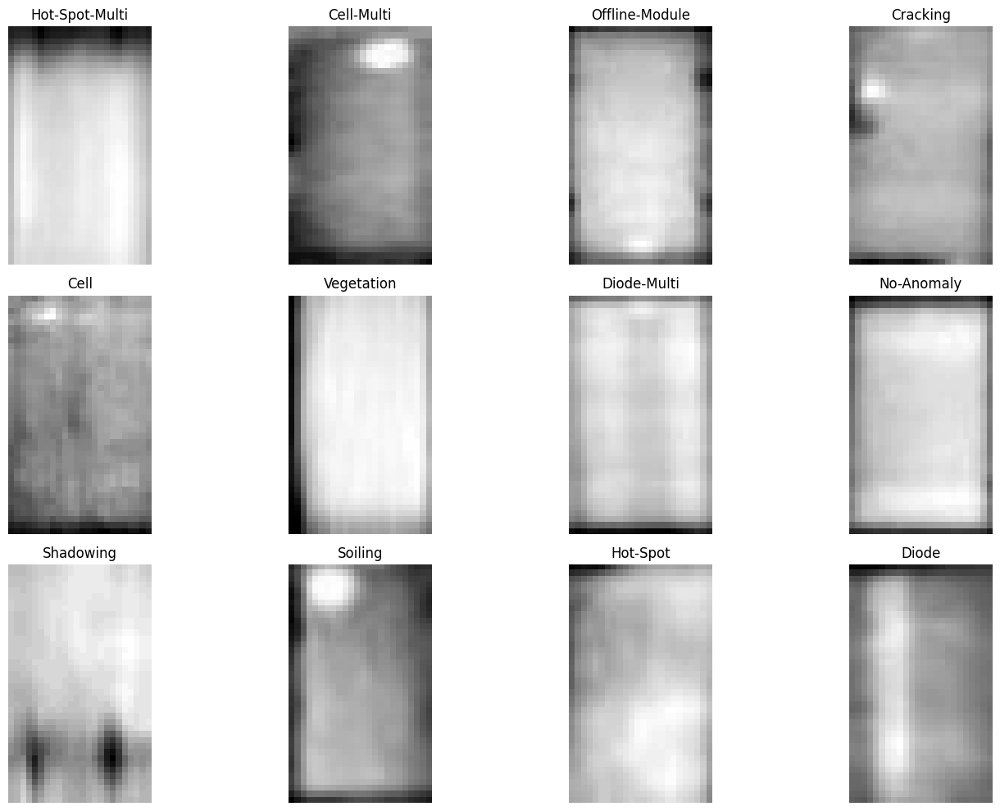

In [34]:
# List the subdirectories (anomaly classes) in the test directory
test_subdirectories = [os.path.join("dataset_train", d) for d in os.listdir("dataset_train") if os.path.isdir(os.path.join("dataset_train", d))]

plt.figure(figsize=(15, 10))
for i, subdir in enumerate(test_subdirectories):
    # Get a list of all image files in the subdirectory
    image_files = [f for f in os.listdir(subdir) if os.path.isfile(os.path.join(subdir, f))]

    # Check if there are any images in the subdirectory
    if image_files:
        # Choose the first image file
        image_path = os.path.join(subdir, image_files[0])

        # Read the image
        image = cv2.imread(image_path, 0)

        # Get the anomaly class name from the directory name
        anomaly_class = os.path.basename(subdir).replace('_', ' ')

        plt.subplot(3, 4, i + 1)  # Adjust subplot grid size as needed
        plt.imshow(image, cmap='gray')
        plt.title(anomaly_class, fontsize=12)
        plt.axis('off')

plt.tight_layout()
plt.show()

## **Preparação dos dados**

### ImageFolder

In [35]:
# Compose a sequence of preprocessing transforms
# 1) Resize images to 46×46 pixels
# 2) Ensure output is a PIL/torchvision Image (dropping any alpha channel)
# 3) Convert pixel values to float32 and scale from [0–255] to [0.0–1.0]
temp_transform = Compose([
    Resize((46,46)),                        # Resize each image to 46x46
    ToImage(),                         # Convert tensor back to PIL Image (enforces RGB)
    ToDtype(torch.float32, scale=True) # Cast to float32 and normalize pixel range
])

# Create an ImageFolder dataset from the 'rps' directory
# Images are grouped by subfolder name as class labels, and each image is transformed
temp_dataset = ImageFolder(
    root='dataset_train',
    transform=temp_transform          # Apply the preprocessing pipeline to every image
)

In [36]:
# Get total number of samples in the dataset
dataset_size = len(temp_dataset)
print(f"Dataset size: {dataset_size} images")

# Get number of classes
num_classes = len(temp_dataset.classes)
print(f"Number of classes: {num_classes}")

Dataset size: 17000 images
Number of classes: 12


## Standardization

In [37]:
temp_loader = DataLoader(temp_dataset, batch_size=16)

In [38]:
# Each column represents a channel
# first row is the number of data points
# second row is the the sum of mean values
# third row is the sum of standard deviations
first_images, first_labels = next(iter(temp_loader))
Architecture.statistics_per_channel(first_images, first_labels)

tensor([[16.0000, 16.0000, 16.0000],
        [10.0997, 10.0997, 10.0997],
        [ 1.1843,  1.1843,  1.1843]])

In [39]:
# We can leverage the loader_apply() method to get the sums for the whole dataset:
results = Architecture.loader_apply(temp_loader, Architecture.statistics_per_channel)
results

tensor([[17000.0000, 17000.0000, 17000.0000],
        [10518.5723, 10518.5723, 10518.5723],
        [ 1247.9636,  1247.9636,  1247.9636]])

In [40]:
# we can compute the average mean value and the average standard deviation, per channel.
# Better yet, let’s make it a method that takes a data loader and
# returns an instance of the Normalize() transform
normalizer = Architecture.make_normalizer(temp_loader)
normalizer

Normalize(mean=[tensor(0.6187), tensor(0.6187), tensor(0.6187)], std=[tensor(0.0734), tensor(0.0734), tensor(0.0734)], inplace=False)

## Aplicação das métricas de normalização nos datasets

In [41]:
# Define a pipeline of image transformations:
# 1) Redefine cada imagem para 46×46 pixels
# 2) Ensure the output is a PIL/torchvision image (dropping any alpha channel)
# 3) Cast pixels to float32 and scale from [0–255] to [0.0–1.0]
# 4) Apply the user-defined normalization (e.g., mean/std normalization)
composer = Compose([
    Resize((46,46)),                         # Resize to 46×46
    ToImage(),                          # Convert to PIL Image in RGB
    ToDtype(torch.float32, scale=True), # Cast to float32 and normalize to [0,1]
    normalizer                          # Apply custom normalization transform
])

# Instantiate training and validation datasets from folders:
# - 'dataset_train' contains subfolders per class for training
# - 'dataset_test' likewise for validation
train_data = ImageFolder(root='dataset_train', transform=composer)
val_data   = ImageFolder(root='dataset_test', transform=composer)

# Wrap datasets in DataLoaders for batching and shuffling:
# - batch_size=16 yields mini-batches of 16 images
# - shuffle=True randomizes training order each epoch
train_loader = DataLoader(train_data, batch_size=16, shuffle=True)
val_loader   = DataLoader(val_data,   batch_size=16)  # no shuffle for validation

In [42]:
def figure2(first_images, first_labels):
    fig, axs = plt.subplots(1, 9, figsize=(14, 4))
    titles = ['Offline-Module', 'Diode-Multi', 'Diode', 'Shadowing', 'Cell-Multi', 'Cell',
 'Hot-Spot', 'Cracking', 'Hot-Spot-Multi', 'Soiling', 'Vegetation',
 'No-Anomaly']
    for i in range(9):
        image, label = ToPILImage()(first_images[i]), first_labels[i]
        axs[i].imshow(image)
        axs[i].set_xticks([])
        axs[i].set_yticks([])
        axs[i].set_title(titles[label], fontsize=12)
    fig.tight_layout()
    return fig

In [43]:
torch.manual_seed(88)
first_images, first_labels = next(iter(train_loader))

#fig = figure2(first_images, first_labels)

### Two-Dimensional Dropout

In [ ]:
def figure9(first_images, seed=17, p=.33):
    torch.manual_seed(seed)
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(ToPILImage()(first_images[0]))
    axs[0].set_title('Original Image')
    axs[0].grid(False)
    axs[0].set_xticks([])
    axs[0].set_yticks([])
    axs[1].imshow(ToPILImage()(F.dropout(first_images[:1], p=p)[0]))
    axs[1].set_title('Regular Dropout')
    axs[1].grid(False)
    axs[1].set_xticks([])
    axs[1].set_yticks([])
    axs[2].imshow(ToPILImage()(F.dropout2d(first_images[:1], p=p)[0]))
    axs[2].set_title('Two-Dimensional Dropout')
    axs[2].grid(False)
    axs[2].set_xticks([])
    axs[2].set_yticks([])
    fig.tight_layout()
    return fig

In [8]:
#fig = figure9(first_images)

Original Dataset Image

In [7]:
#plot()

# **Modelo de ML**

### Definindo o tipo de rede CNN2

In [ ]:
class CNN2(nn.Module):
    def __init__(self, n_feature, p=0.0):
        super(CNN2, self).__init__()
        self.n_feature = n_feature
        self.p = p
        # Creates the convolution layers
        self.conv1 = nn.Conv2d(in_channels=3,
                               out_channels=n_feature,
                               kernel_size=3)
        self.conv2 = nn.Conv2d(in_channels=n_feature,
                               out_channels=n_feature,
                               kernel_size=3)
        # Creates the linear layers
        # The input size of the first fully connected layer is calculated based on the output size of the last convolutional layer.
        # For a 46x46 input image:
        # After conv1 (kernel_size=3): (46 - 3 + 1) = 44
        # After max_pool2d (kernel_size=2): 44 / 2 = 22
        # After conv2 (kernel_size=3): (22 - 3 + 1) = 20
        # After max_pool2d (kernel_size=2): 20 / 2 = 10
        # So the output size is n_feature * 10 * 10
        self.fc1 = nn.Linear(n_feature * 10 * 10, 50)
        # The output layer should have 12 units, one for each anomaly class
        self.fc2 = nn.Linear(50, 12)
        # Creates dropout layers
        self.drop = nn.Dropout(self.p)

    def featurizer(self, x):
        # Featurizer
        # First convolutional block
        # 3@46x46 -> n_feature@44x44 -> n_feature@22x22
        x = self.conv1(x)
        x = F.relu(x)
        x = F.max_pool2d(x, kernel_size=2)
        # Second convolutional block
        # n_feature@22x22 -> n_feature@20x20 -> n_feature@10x10
        x = self.conv2(x)
        x = F.relu(x)
        x = F.max_pool2d(x, kernel_size=2)
        # Input dimension (n_feature@10x10)
        # Output dimension (n_feature * 10 * 10)
        x = nn.Flatten()(x)
        return x

    def classifier(self, x):
        # Classifier
        # Hidden Layer
        # Input dimension (n_feature * 10 * 10)
        # Output dimension (50)
        if self.p > 0:
            x = self.drop(x)
        x = self.fc1(x)
        x = F.relu(x)
        # Output Layer
        # Input dimension (50)
        # Output dimension (12)
        if self.p > 0:
            x = self.drop(x)
        x = self.fc2(x)
        return x

    def forward(self, x):
        x = self.featurizer(x)
        x = self.classifier(x)
        return x

### **Model Configuration**

In [ ]:
torch.manual_seed(42)

# Model/Architecture
model_cnn2 = CNN2(n_feature=5, p=0.3)

# Loss function
multi_loss_fn = nn.CrossEntropyLoss(reduction='mean')

# Optimizer
optimizer_cnn2 = optim.Adam(model_cnn2.parameters(), lr=3e-4)

In [ ]:
optimizer_cnn2.state_dict()

{'state': {},
 'param_groups': [{'lr': 0.0003,
   'betas': (0.9, 0.999),
   'eps': 1e-08,
   'weight_decay': 0,
   'amsgrad': False,
   'maximize': False,
   'foreach': None,
   'capturable': False,
   'differentiable': False,
   'fused': None,
   'params': [0, 1, 2, 3, 4, 5, 6, 7]}]}

In [ ]:
arch_cnn2 = Architecture(model_cnn2,
                        multi_loss_fn,
                        optimizer_cnn2)
arch_cnn2.set_loaders(train_loader, val_loader)
arch_cnn2.train(10)

In [ ]:
arch_cnn2.count_parameters()

26032

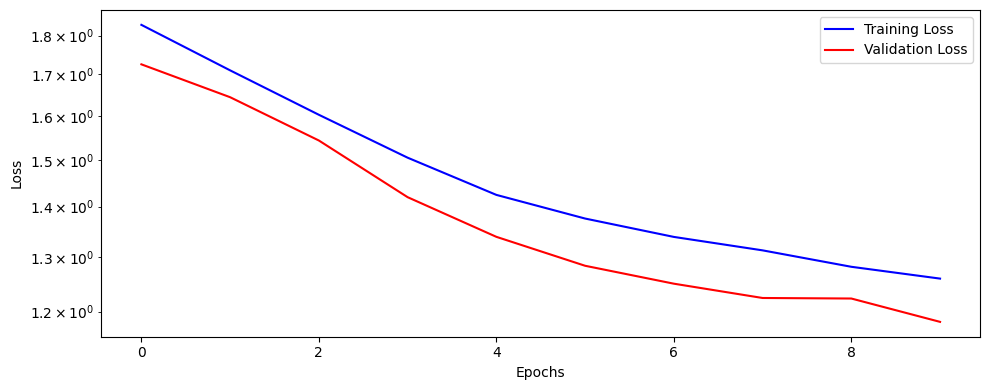

In [ ]:
fig = arch_cnn2.plot_losses()

### **Analyzing Model with Hooks**

Layers to be visualized: ['conv1', 'conv2', 'fc1', 'fc2']
------------------------------
Hooks attached successfully.
Data propagated through the model.
Generating visualization of feature maps...


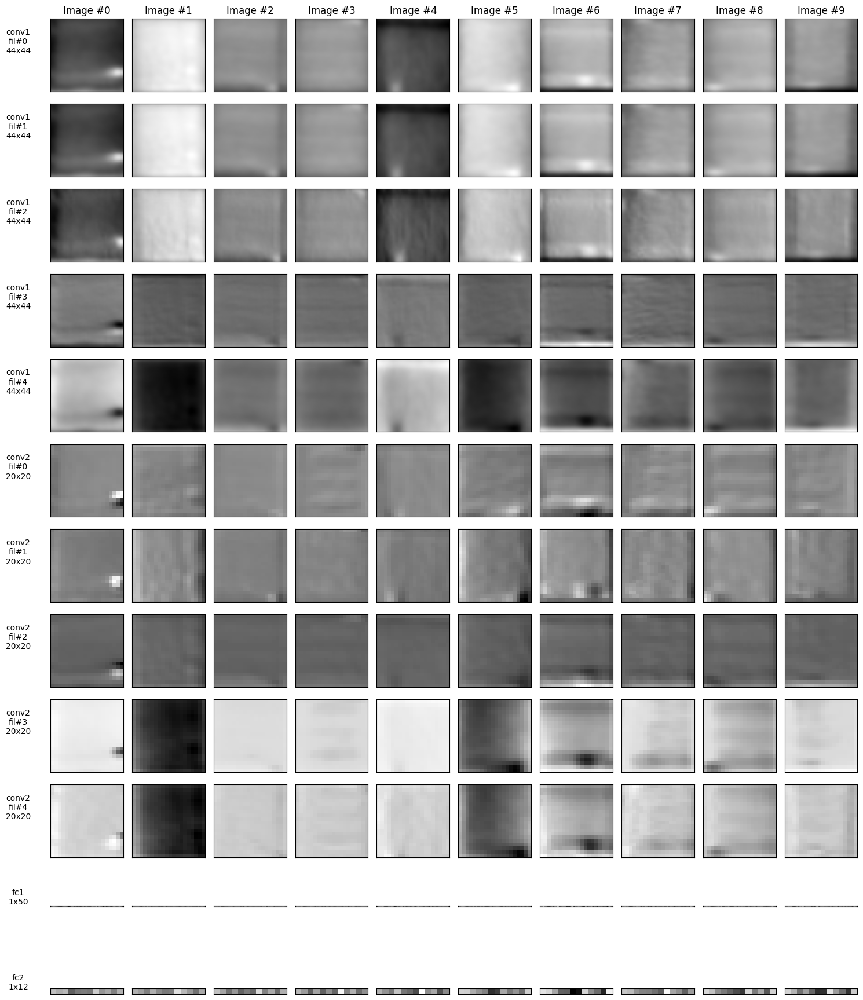

Visualization generated.
Hooks removed successfully.


In [ ]:
#Extract the names of all layers, except the dropout layer.
todas_as_camadas = [name for name, layer in model_cnn2.named_modules() if name]
camadas_para_visualizar = [name for name in todas_as_camadas if 'drop' not in name]

print(f"Layers to be visualized: {camadas_para_visualizar}")
print("-" * 30)

try:
    #Set the model to evaluation mode
    arch_cnn2.model.eval()

    #Attach hooks using the filtered list
    arch_cnn2.attach_hooks(layers_to_hook=camadas_para_visualizar)
    print("Hooks attached successfully.")

    #Get a batch of images
    torch.manual_seed(42)
    images, labels = next(iter(val_loader))
    images = images.to(arch_cnn2.device)

    #Pass the images through the model
    output = arch_cnn2.model(images)
    print("Data propagated through the model.")

    #Visualize the outputs
    print("Generating visualization of feature maps...")
    fig = arch_cnn2.visualize_outputs(layers=camadas_para_visualizar)
    plt.show()
    print("Visualization generated.")

    #Remove the hooks
    arch_cnn2.remove_hooks()
    print("Hooks removed successfully.")

except Exception as e:
    print(f"\nAn unexpected error occurred: {e}")

### **Results metrics functions**

**Acurácia**

In [ ]:
(lambda x: x[0].item() / x[1].item())(Architecture.loader_apply(val_loader,
                                                                arch_cnn2.correct).sum(axis=0))

0.6236666666666667

**Funções das métricas**

In [ ]:
# Matriz de confusão
def plot_confusion_matrix(arch_cnn): # Function name is confusion_matrix
    # Get predictions and true labels for the validation set
    all_preds = []
    all_labels = []

    arch_cnn.model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs = inputs.to(arch_cnn.device)
            labels = labels.to(arch_cnn.device)

            outputs = arch_cnn.model(inputs)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Calculate the confusion matrix using the imported function
    # This line is problematic as it calls the imported function with the same name
    cm = confusion_matrix(all_labels, all_preds) # This will cause recursion or use the imported function

    # Get class names from the validation dataset
    class_names = val_data.classes

    # Plot the confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()
    return cm

# Precisão por classe
def class_precision(confusion_matrix):
    num_classes = confusion_matrix.shape[0]
    precision = []
    for i in range(num_classes):
        tp = confusion_matrix[i, i]
        # False Positives for class i is the sum of the i-th column excluding the diagonal element
        fp = np.sum(confusion_matrix[:, i]) - tp
        # Handle division by zero if no predictions were made for this class
        if tp + fp == 0:
            precision.append(0.0) # Or np.nan, depending on preference
        else:
            precision.append(tp / (tp + fp))
    return precision

# Precisão total ponderada pela dimensão das classes
def weighted_precision(confusion_matrix, class_counts):
    precision_per_class = get_precision_per_class(confusion_matrix)
    total_samples = sum(class_counts)
    weighted_precision_sum = 0

    for i, precision in enumerate(precision_per_class):
        weight = class_counts[i] / total_samples
        weighted_precision_sum += precision * weight

    return weighted_precision_sum

### **Results metrics**

In [ ]:
acc_train_cnn2 = (lambda x: x[0].item() / x[1].item())(Architecture.loader_apply(train_loader, arch_cnn2.correct).sum(axis=0))
acc_val_cnn2 = (lambda x: x[0].item() / x[1].item())(Architecture.loader_apply(val_loader, arch_cnn2.correct).sum(axis=0))

print(f"Acurácia de treinamento do modelo:{acc_train_cnn2: .5f}")
print(f"Acurácia de validação do modelo:{acc_val_cnn2: .5f}")

Acurácia de treinamento do modelo: 0.64818
Acurácia de validação do modelo: 0.62367


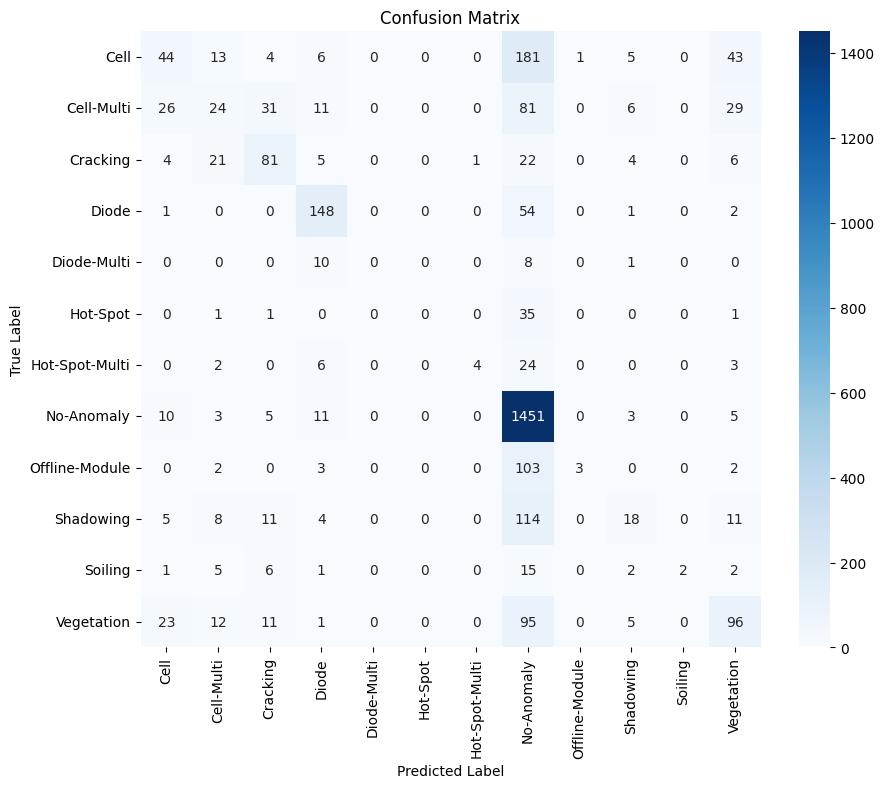

In [ ]:
cm_arch_cnn2 = plot_confusion_matrix(arch_cnn2)

In [ ]:
precision_per_class_cnn2 = class_precision(cm_arch_cnn2)
print("\nPrecisão por Classe (derivada da matriz de confusão):")
class_names = val_data.classes # Assuming val_data.classes holds the class names
for i, precision in enumerate(precision_per_class_cnn2):
    print(f"  Classe '{class_names[i]}': {precision:.4f}")


Precisão por Classe (derivada da matriz de confusão):
  Classe 'Cell': 0.3860
  Classe 'Cell-Multi': 0.2637
  Classe 'Cracking': 0.5400
  Classe 'Diode': 0.7184
  Classe 'Diode-Multi': 0.0000
  Classe 'Hot-Spot': 0.0000
  Classe 'Hot-Spot-Multi': 0.8000
  Classe 'No-Anomaly': 0.6647
  Classe 'Offline-Module': 0.7500
  Classe 'Shadowing': 0.4000
  Classe 'Soiling': 1.0000
  Classe 'Vegetation': 0.4800


In [ ]:
class_counts_val = np.bincount(val_data.targets)
weighted_avg_precision_cnn2 = weighted_precision(cm_arch_cnn2, class_counts_val)
print(f"\nMédia ponderada da precisão (ponderada pela quantidade de amostras): {weighted_avg_precision_cnn2:.4f}")


Média ponderada da precisão (ponderada pela quantidade de amostras): 0.5731


### **Regularizing Effect**

In [ ]:
torch.manual_seed(42)
# Model Configuration
model_cnn2_nodrop = CNN2(n_feature=5, p=0.0)
multi_loss_fn = nn.CrossEntropyLoss(reduction='mean')
optimizer_cnn2_nodrop = optim.Adam(model_cnn2_nodrop.parameters(), lr=3e-4)
# Model Training
arch_cnn2_nodrop = Architecture(model_cnn2_nodrop, multi_loss_fn, optimizer_cnn2_nodrop)
arch_cnn2_nodrop.set_loaders(train_loader, val_loader)
arch_cnn2_nodrop.train(10)

In [ ]:
def figure11(losses, val_losses, losses_nodrop, val_losses_nodrop):
    fig, axs = plt.subplots(1, 1, figsize=(10, 5))
    axs.plot(losses, 'b', label='Training Losses - Dropout')
    axs.plot(val_losses, 'r', label='Validation Losses - Dropout')
    axs.plot(losses_nodrop, 'b--', label='Training Losses - No Dropout')
    axs.plot(val_losses_nodrop, 'r--', label='Validation Losses - No Dropout')
    plt.yscale('log')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Regularizing Effect')
    fig.legend(loc='lower left')
    fig.tight_layout()
    return fig

In [ ]:
print(
    Architecture.loader_apply(train_loader, arch_cnn2_nodrop.correct).sum(axis=0),
    Architecture.loader_apply(val_loader, arch_cnn2_nodrop.correct).sum(axis=0)
)

tensor([11550, 17000]) tensor([1934, 3000])


In [ ]:
print(
    (lambda x: x[0].item() / x[1].item())(Architecture.loader_apply(train_loader, arch_cnn2_nodrop.correct).sum(axis=0)),
    (lambda x: x[0].item() / x[1].item())(Architecture.loader_apply(val_loader, arch_cnn2_nodrop.correct).sum(axis=0))
)

0.6794117647058824 0.6446666666666667


In [ ]:
print(
    Architecture.loader_apply(train_loader, arch_cnn2.correct).sum(axis=0),
    Architecture.loader_apply(val_loader, arch_cnn2.correct).sum(axis=0)
)

tensor([11019, 17000]) tensor([1871, 3000])


In [ ]:
print(
    (lambda x: x[0].item() / x[1].item())(Architecture.loader_apply(train_loader, arch_cnn2.correct).sum(axis=0)),
    (lambda x: x[0].item() / x[1].item())(Architecture.loader_apply(val_loader, arch_cnn2.correct).sum(axis=0))
)

0.6481764705882352 0.6236666666666667


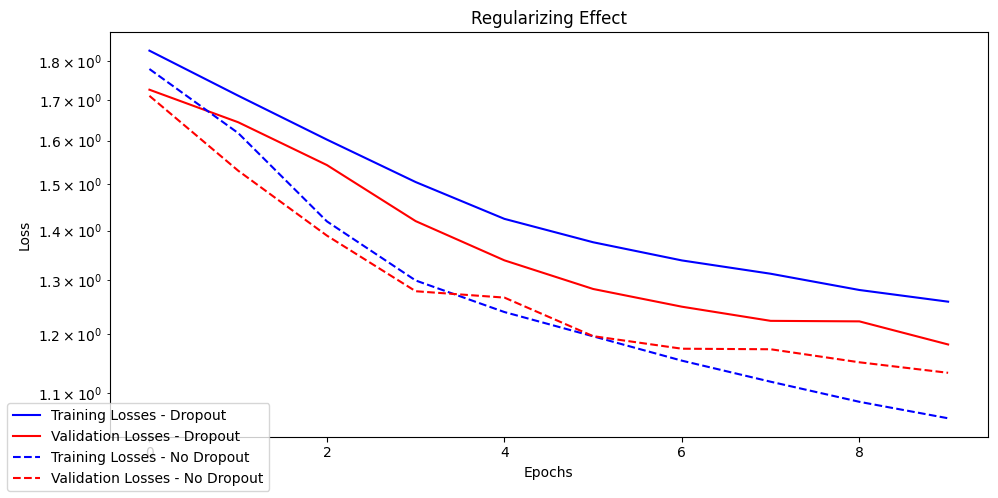

In [ ]:
fig = figure11(arch_cnn2.losses, arch_cnn2.val_losses, arch_cnn2_nodrop.losses, arch_cnn2_nodrop.val_losses)

### **Visualizing Filters**

In [ ]:
model_cnn2.conv1.weight.shape

torch.Size([5, 3, 3, 3])

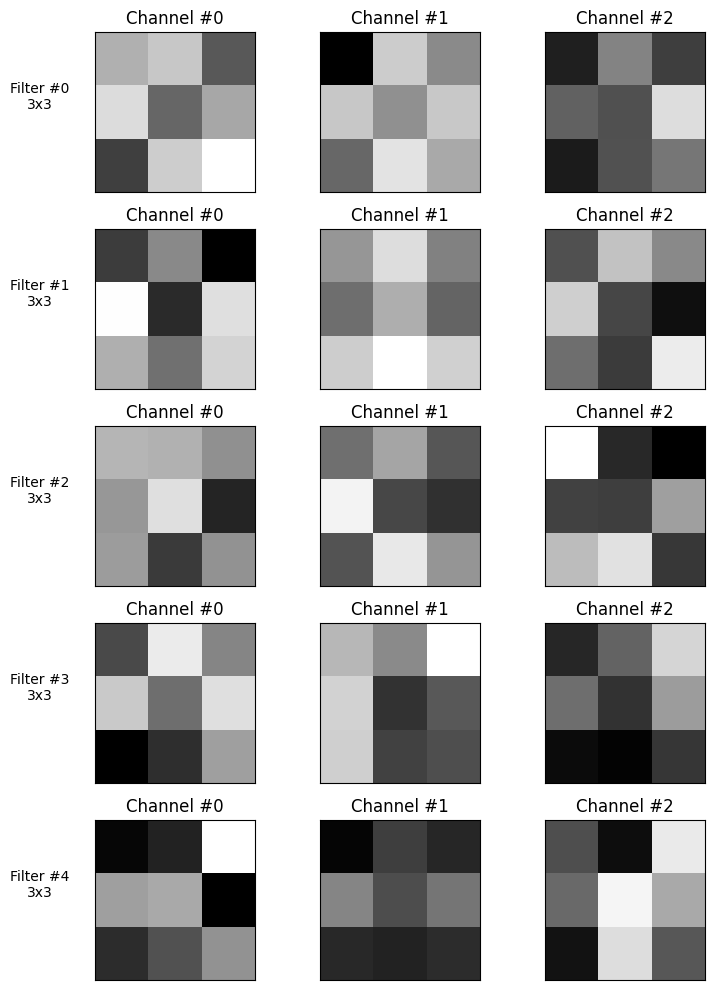

In [ ]:
fig = arch_cnn2.visualize_filters('conv1')

In [ ]:
model_cnn2.conv2.weight.shape

torch.Size([5, 5, 3, 3])

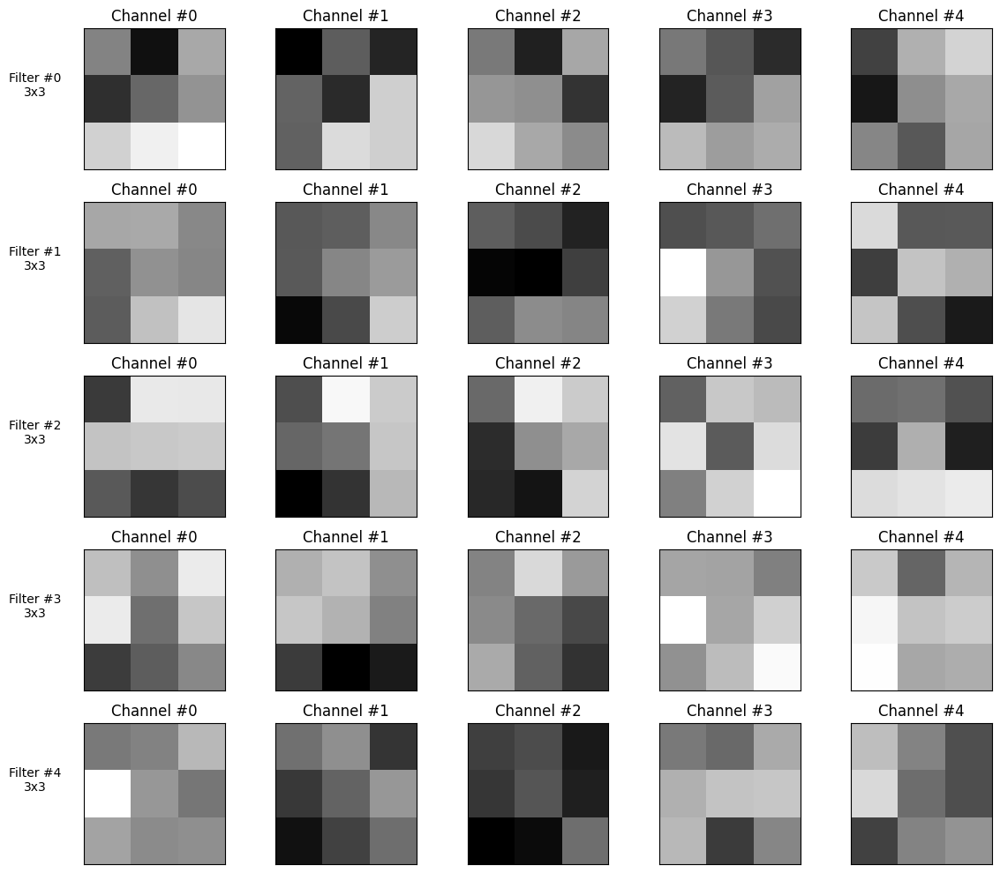

In [ ]:
fig = arch_cnn2.visualize_filters('conv2')

**Confusion Matrix**

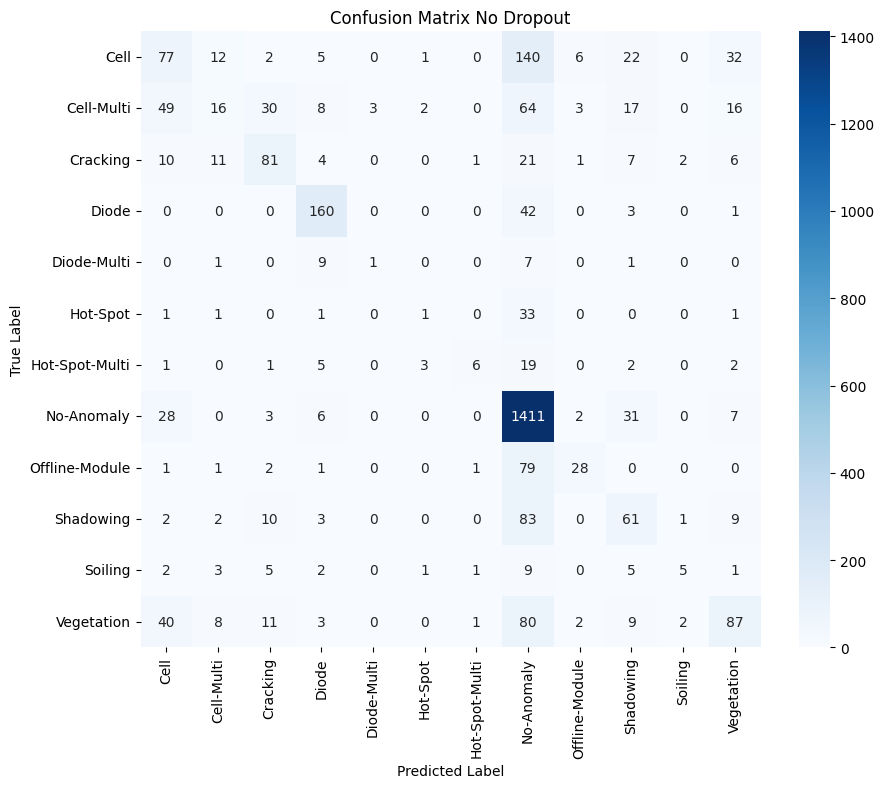

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Get predictions and true labels for the validation set
all_preds = []
all_labels = []

arch_cnn2_nodrop.model.eval()  # Set the model to evaluation mode
with torch.no_grad():
    for inputs, labels in val_loader:
        inputs = inputs.to(arch_cnn2_nodrop.device)
        labels = labels.to(arch_cnn2_nodrop.device)

        outputs = arch_cnn2_nodrop.model(inputs)
        _, preds = torch.max(outputs, 1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Calculate the confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# Get class names from the validation dataset
class_names = val_data.classes

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix No Dropout')
plt.show()

#**Testando diferentes modelos com variação dos hiperparâmetros**

## Definição dos novos hiperparâmetros

In [ ]:
!pip install optuna mlflow scikit-learn pyngrok -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 395.9/395.9 kB 26.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.7/24.7 MB 68.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 67.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 246.9/246.9 kB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 kB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.9/114.9 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 741.4/741.4 kB 46.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.4/203.4 kB 15.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.8/65.8 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.5/118.5 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.2/196.2 kB 17.3 MB/s eta 0:00:00


In [ ]:
# Otimization
import optuna
import mlflow

In [ ]:


# Helper function to get predictions
def get_predictions(architecture, data_loader):
    all_preds = []
    all_labels = []
    architecture.model.eval()
    with torch.no_grad():
        for images, labels in data_loader:
            images = images.to(architecture.device)
            outputs = architecture.model(images)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    return all_preds, all_labels

# Setting the name for experiment in MLflow
mlflow.set_experiment("Otimização do Modelo de Painéis Solares")

def objective(trial):
    with mlflow.start_run():
        params = {
            'n_feature': trial.suggest_int('n_feature', 4, 16),
            'dropout_rate': trial.suggest_float('dropout_rate', 0.1, 0.5),
            'lr': trial.suggest_float('lr', 1e-5, 1e-3, log=True)
        }
        mlflow.log_params(params)

        model = CNN2(n_feature=params['n_feature'], p=params['dropout_rate'])
        optimizer = optim.Adam(model.parameters(), lr=params['lr'])
        arch = Architecture(model, multi_loss_fn, optimizer)
        arch.set_loaders(train_loader, val_loader)

        n_epochs = 15
        arch.train(n_epochs)

        for epoch in range(n_epochs):
            mlflow.log_metric('train_loss', arch.losses[epoch], step=epoch)
            mlflow.log_metric('val_loss', arch.val_losses[epoch], step=epoch)

        all_preds, all_labels = get_predictions(arch, val_loader)
        class_names = val_data.classes
        cm = confusion_matrix(all_labels, all_preds)
        plt.figure(figsize=(12, 10))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
        plt.title('Matriz de Confusão', fontsize=16)
        plt.ylabel('Verdadeiro')
        plt.xlabel('Previsto')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.savefig("confusion_matrix.png")
        mlflow.log_artifact("confusion_matrix.png", "plots")
        plt.close()

        final_val_loss = arch.val_losses[-1]
        mlflow.log_metric('final_val_loss', final_val_loss)

        return final_val_loss

In [ ]:
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=20) # 20 models test, for exemple

print("\nEstudo de otimização finalizado!")

[I 2025-07-06 21:48:23,804] A new study created in memory with name: no-name-5981fdb2-1aba-415c-b14e-d0e920e07792
[I 2025-07-06 21:56:42,411] Trial 0 finished with value: 1.6867249969472276 and parameters: {'n_feature': 7, 'dropout_rate': 0.16989998387525254, 'lr': 1.1177285796090666e-05}. Best is trial 0 with value: 1.6867249969472276.
[I 2025-07-06 22:05:15,549] Trial 1 finished with value: 0.989867064309247 and parameters: {'n_feature': 8, 'dropout_rate': 0.28365028413191185, 'lr': 0.0004435327396568911}. Best is trial 1 with value: 0.989867064309247.
[I 2025-07-06 22:13:06,763] Trial 2 finished with value: 1.3875741332452347 and parameters: {'n_feature': 5, 'dropout_rate': 0.10187959573942883, 'lr': 4.102070668045529e-05}. Best is trial 1 with value: 0.989867064309247.
[I 2025-07-06 22:20:57,328] Trial 3 finished with value: 1.3200028415055984 and parameters: {'n_feature': 5, 'dropout_rate': 0.3424898657595308, 'lr': 0.0001052863640327261}. Best is trial 1 with value: 0.98986706430


Estudo de otimização finalizado!


In [ ]:
# Célula para iniciar a Interface do MLflow
from pyngrok import ngrok
import getpass

# Cole seu token do ngrok aqui. Ele ficará apenas nesta sessão do Colab.
AUTHTOKEN = ""
ngrok.set_auth_token(AUTHTOKEN)

#Iniciar o servidor MLflow em background (como antes)
get_ipython().system_raw("mlflow ui --port 5000 &")

#Criar o túnel com o ngrok
ngrok_tunnel = ngrok.connect(5000)

print("-------------------------------------------------")
print("Interface do MLflow pronta!")
print("Abra este link no seu navegador para ver os resultados:")
print(ngrok_tunnel.public_url)
print("-------------------------------------------------")

In [ ]:
# Define o nome do experimento do qual queremos os dados
experiment_name = "Otimização do Modelo de Painéis Solares"

# Experimento pelo nome
try:
    experiment = mlflow.get_experiment_by_name(experiment_name)
    experiment_id = experiment.experiment_id

    # Busca TODOS os runs (ensaios) do experimento
    runs_df = mlflow.search_runs(experiment_ids=[experiment_id])

    # Remover colunas que começam com 'params.' e 'tags.' para simplificar
    cols_to_drop = [col for col in runs_df.columns if col.startswith('params.') or col.startswith('tags.')]
    #runs_df_cleaned = runs_df.drop(columns=cols_to_drop)

    print(f"Encontrados {len(runs_df)} resultados no experimento.")

    # Salva o DataFrame completo em um arquivo CSV
    csv_filename = "resultados_completos_otimizacao.csv"
    runs_df.to_csv(csv_filename, index=False)

    print(f"\nResultados exportados com sucesso para o arquivo: '{csv_filename}'")

    # Exibe as primeiras linhas da tabela de resultados
    print("\nAmostra dos resultados:")
    display(runs_df.head())

except Exception as e:
    print(f"Ocorreu um erro: {e}")
    print("Verifique se o nome do experimento está correto e se o estudo já foi executado.")


Ocorreu um erro: 'NoneType' object has no attribute 'experiment_id'
Verifique se o nome do experimento está correto e se o estudo já foi executado.


✅ Arquivo CSV carregado com sucesso!

--- 🏆 Detalhes do Melhor Modelo (a partir do CSV) ---
Loss de Validação Final: 0.88912
Loss de Treinamento: 0.93424

Parâmetros do Melhor Modelo:
   - lr: 0.0004788645100667
   - dropout_rate: 0.3371287734951104
   - n_feature: 14


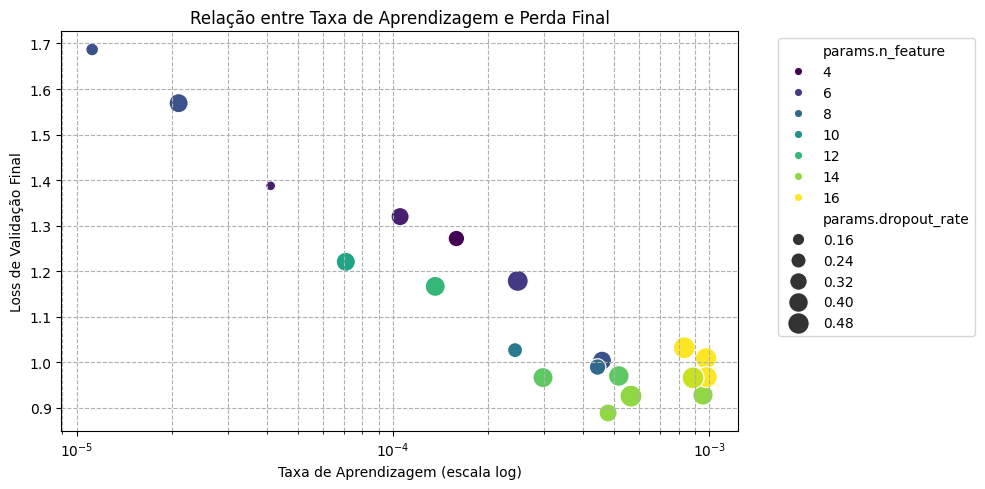

In [ ]:
#Carregar os Dados do Arquivo CSV

try:
    # Certifique-se de que o arquivo CSV está no mesmo ambiente
    df_results = pd.read_csv("resultados_completos_otimizacao.csv")
    print("✅ Arquivo CSV carregado com sucesso!")
except FileNotFoundError:
    print("❌ Erro: Arquivo 'resultados_completos_otimizacao.csv' não encontrado.")
    # Se der este erro, faça o upload do arquivo para o Colab.
    df_results = None

if df_results is not None:
    #Encontrar e Imprimir os Detalhes do Melhor Run ---

    # Ordena o DataFrame pela menor perda de validação final
    best_run_from_csv_val = df_results.sort_values(by="metrics.final_val_loss").iloc[0]
    best_run_from_csv_train = df_results.sort_values(by="metrics.train_loss").iloc[0]

    print("\n--- 🏆 Detalhes do Melhor Modelo (a partir do CSV) ---")
    print(f"Loss de Validação Final: {best_run_from_csv_val['metrics.final_val_loss']:.5f}")
    print(f"Loss de Treinamento: {best_run_from_csv_train['metrics.train_loss']:.5f}")

    print("\nParâmetros do Melhor Modelo:")
    # Filtra as colunas para pegar apenas as que começam com 'params.'
    param_cols = [col for col in df_results.columns if col.startswith('params.')]
    for param in param_cols:
        param_name = param.replace('params.', '')
        param_value = best_run_from_csv_val[param]
        print(f"   - {param_name}: {param_value}")

    #Exemplo de Análise Visual Possível com o CSV

    # Criar um gráfico de dispersão para ver a relação entre a taxa de aprendizado e a perda final
    plt.figure(figsize=(10, 5))
    sns.scatterplot(
        data=df_results,
        x="params.lr",
        y="metrics.final_val_loss",
        hue="params.n_feature", # Cor para o número de features
        size="params.dropout_rate", # Tamanho para a taxa de dropout
        sizes=(50, 250),
        palette='viridis'
    )
    plt.title("Relação entre Taxa de Aprendizagem e Perda Final")
    plt.xlabel("Taxa de Aprendizagem (escala log)")
    plt.ylabel("Loss de Validação Final")
    plt.xscale('log')
    plt.grid(True, which='both', linestyle='--')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


In [ ]:
#Carregar os Dados do Arquivo CSV

try:
    # Certifique-se de que o arquivo CSV está no mesmo ambiente
    df_results = pd.read_csv("resultados_completos_otimizacao.csv")
    print("✅ Arquivo CSV carregado com sucesso!")
except FileNotFoundError:
    print("❌ Erro: Arquivo 'resultados_completos_otimizacao.csv' não encontrado.")
    # Se der este erro, faça o upload do arquivo para o Colab.
    df_results = None

# Exibe as primeiras linhas da tabela de resultados
print("\nAmostra dos resultados:")
display(df_results)

✅ Arquivo CSV carregado com sucesso!

Amostra dos resultados:


,run_id,experiment_id,status,artifact_uri,start_time,end_time,metrics.val_loss,metrics.train_loss,metrics.final_val_loss,params.lr,params.dropout_rate,params.n_feature,tags.mlflow.runName,tags.mlflow.source.type,tags.mlflow.user,tags.mlflow.source.name
0,7ce379465a6144b1a14efd097a7d3da5,893298317418703024,FINISHED,file:///content/mlruns/893298317418703024/7ce3...,2025-07-07 00:43:47.916000+00:00,2025-07-07 00:54:00.684000+00:00,0.889122,0.934238,0.889122,0.000479,0.337129,14,capable-auk-759,LOCAL,root,/usr/local/lib/python3.11/dist-packages/colab_...
1,0c9a0510fe82430ba1c128848f665823,893298317418703024,FINISHED,file:///content/mlruns/893298317418703024/0c9a...,2025-07-07 00:33:55.020000+00:00,2025-07-07 00:43:47.910000+00:00,1.166890,1.218433,1.166890,0.000136,0.414774,12,capable-auk-759,LOCAL,root,/usr/local/lib/python3.11/dist-packages/colab_...
2,c5d5c6e14f254c949f63bf21385c795e,893298317418703024,FINISHED,file:///content/mlruns/893298317418703024/c5d5...,2025-07-07 00:23:48.426000+00:00,2025-07-07 00:33:55.015000+00:00,0.926047,1.039723,0.926047,0.000566,0.499119,14,capable-auk-759,LOCAL,root,/usr/local/lib/python3.11/dist-packages/colab_...
3,76a8d8c24fdd47e39612c149bb7565f0,893298317418703024,FINISHED,file:///content/mlruns/893298317418703024/76a8...,2025-07-07 00:13:37.468000+00:00,2025-07-07 00:23:48.419000+00:00,0.966723,1.064516,0.966723,0.000298,0.419216,13,capable-auk-759,LOCAL,root,/usr/local/lib/python3.11/dist-packages/colab_...
4,bdb6e2403e1f4a92becbd847a1d526d0,893298317418703024,FINISHED,file:///content/mlruns/893298317418703024/bdb6...,2025-07-07 00:03:19.557000+00:00,2025-07-07 00:13:37.462000+00:00,0.928583,1.002185,0.928583,0.000956,0.428248,14,capable-auk-759,LOCAL,root,/usr/local/lib/python3.11/dist-packages/colab_...
5,106fc20db31141abaad809efed48597e,893298317418703024,FINISHED,file:///content/mlruns/893298317418703024/106f...,2025-07-06 23:53:13.869000+00:00,2025-07-07 00:03:19.550000+00:00,0.970311,1.070809,0.970311,0.000518,0.441392,13,capable-auk-759,LOCAL,root,/usr/local/lib/python3.11/dist-packages/colab_...
6,463cf883dbb64a41a1b2a3f683d031b6,893298317418703024,FINISHED,file:///content/mlruns/893298317418703024/463c...,2025-07-06 23:42:49.885000+00:00,2025-07-06 23:53:13.862000+00:00,1.032213,1.103421,1.032213,0.000834,0.494018,16,capable-auk-759,LOCAL,root,/usr/local/lib/python3.11/dist-packages/colab_...
7,d5446148350a4ffa9abfd8d4a216c251,893298317418703024,FINISHED,file:///content/mlruns/893298317418703024/d544...,2025-07-06 23:32:28.020000+00:00,2025-07-06 23:42:49.879000+00:00,1.009024,1.053405,1.009024,0.000978,0.473594,16,capable-auk-759,LOCAL,root,/usr/local/lib/python3.11/dist-packages/colab_...
8,1280f0a12fc644058545eac74463e2a2,893298317418703024,FINISHED,file:///content/mlruns/893298317418703024/1280...,2025-07-06 23:22:00.972000+00:00,2025-07-06 23:32:28.011000+00:00,0.967867,1.081031,0.967867,0.000983,0.457003,16,capable-auk-759,LOCAL,root,/usr/local/lib/python3.11/dist-packages/colab_...
9,0d17a1e4925e4be7a6b91bb60ffb0e66,893298317418703024,FINISHED,file:///content/mlruns/893298317418703024/0d17...,2025-07-06 23:11:43.418000+00:00,2025-07-06 23:22:00.967000+00:00,0.966155,1.068941,0.966155,0.000889,0.494771,15,capable-auk-759,LOCAL,root,/usr/local/lib/python3.11/dist-packages/colab_...


In [ ]:
try:
    # Certifique-se de que o arquivo CSV está no mesmo ambiente
    df_results = pd.read_csv("resultados_completos_otimizacao.csv")
    print("✅ Arquivo CSV carregado com sucesso!")
except FileNotFoundError:
    print("❌ Erro: Arquivo 'resultados_completos_otimizacao.csv' não encontrado.")
    # Se der este erro, faça o upload do arquivo para o Colab.
    df_results = None

# Se o arquivo foi carregado, continue com a análise
if df_results is not None:
    # --- 2. Encontrar e Imprimir os Detalhes do Melhor Run ---

    # Ordena o DataFrame pela menor perda de validação final e pega a primeira linha (que é a melhor)
    best_run_from_csv = df_results.sort_values(by="metrics.final_val_loss").iloc[0]

    print("\n--- 🏆 Detalhes do Melhor Modelo (a partir do CSV) ---")
    print(f"Loss de Validação Final: {best_run_from_csv['metrics.final_val_loss']:.5f}")

    print("\nParâmetros do Melhor Modelo:")
    # Filtra as colunas da tabela para pegar apenas as que começam com 'params.'
    param_cols = [col for col in df_results.columns if col.startswith('params.')]
    for param in param_cols:
        # Pega o nome do parâmetro (removendo o prefixo 'params.')
        param_name = param.replace('params.', '')
        # Pega o valor do parâmetro da linha do melhor run
        param_value = best_run_from_csv[param]

        # Imprime de forma organizada
        if isinstance(param_value, float):
            print(f"   - {param_name}: {param_value:.6f}")
        else:
            print(f"   - {param_name}: {param_value}")

✅ Arquivo CSV carregado com sucesso!

--- 🏆 Detalhes do Melhor Modelo (a partir do CSV) ---
Loss de Validação Final: 0.88912

Parâmetros do Melhor Modelo:
   - lr: 0.000479
   - dropout_rate: 0.337129
   - n_feature: 14


🏆 Melhor Run Encontrado! ID: 7ce379465a6144b1a14efd097a7d3da5
   - Loss de Validação Final: 0.88912

Parâmetros do Melhor Modelo (para recriá-lo):
   - lr: 0.00047886451006673013
   - dropout_rate: 0.3371287734951104
   - n_feature: 14


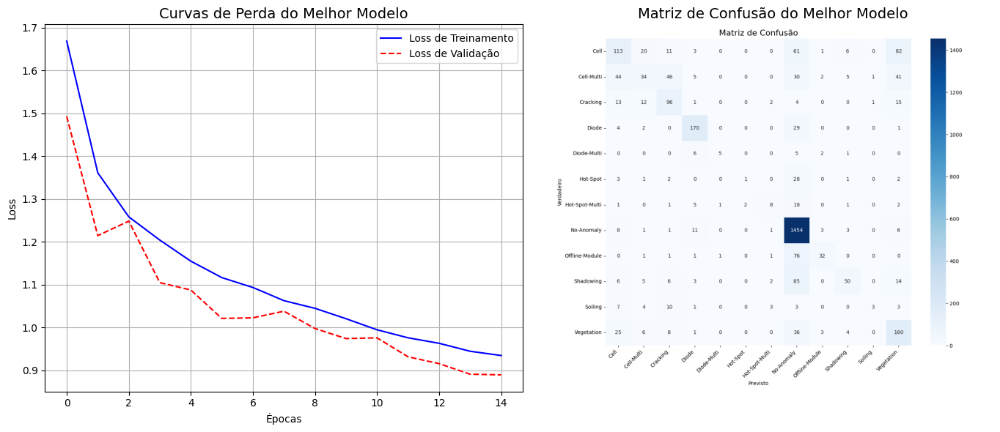

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Encontrar o Melhor Run (Ensaio)

# Busca todos os runs do nosso experimento, ordenando pelo menor 'final_val_loss'
best_run = mlflow.search_runs(
    experiment_names=["Otimização do Modelo de Painéis Solares"],
    order_by=["metrics.final_val_loss ASC"],
    max_results=1
)

if best_run.empty:
    print("Nenhum run encontrado. Execute a otimização primeiro.")
else:
    # Pega o ID do melhor run
    best_run_id = best_run.loc[0, 'run_id']
    print(f"🏆 Melhor Run Encontrado! ID: {best_run_id}")
    print(f"   - Loss de Validação Final: {best_run.loc[0, 'metrics.final_val_loss']:.5f}")

    # Imprimir os Hiperparâmetros do Melhor Modelo
    print("\nParâmetros do Melhor Modelo (para recriá-lo):")
    # Filtra as colunas para pegar apenas as que começam com 'params.'
    best_params = {col.replace('params.', ''): best_run.loc[0, col] for col in best_run.columns if col.startswith('params.')}
    for param_name, param_value in best_params.items():
        # Formata o valor para ser mais legível
        if isinstance(param_value, float):
            print(f"   - {param_name}: {param_value:.6f}")
        else:
            print(f"   - {param_name}: {param_value}")


    # Plotar as Curvas de Perda

    # Para buscar as métricas de cada época, precisamos do cliente do MLflow
    client = mlflow.tracking.MlflowClient()

    # Busca o histórico de métricas para o nosso melhor run
    train_loss_history = client.get_metric_history(best_run_id, "train_loss")
    val_loss_history = client.get_metric_history(best_run_id, "val_loss")

    # Extrai os valores para plotagem
    train_losses = [m.value for m in train_loss_history]
    val_losses = [m.value for m in val_loss_history]

    plt.figure(figsize=(14, 6)) # Aumentei um pouco a figura para caber tudo
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Loss de Treinamento', color='blue')
    plt.plot(val_losses, label='Loss de Validação', color='red', linestyle='--')
    plt.title('Curvas de Perda do Melhor Modelo', fontsize=14)
    plt.xlabel('Épocas')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Exibir a Matriz de Confusão

    # Baixa o artefato (a imagem da matriz de confusão) do melhor run
    try:
        # Define o caminho local para onde o artefato será baixado
        local_path = client.download_artifacts(run_id=best_run_id, path="plots/confusion_matrix.png")

        # Carrega e exibe a imagem
        img = mpimg.imread(local_path)

        plt.subplot(1, 2, 2)
        plt.imshow(img)
        plt.title('Matriz de Confusão do Melhor Modelo', fontsize=14)
        plt.axis('off') # Remove os eixos x e y da imagem

    except Exception as e:
        print(f"\nNão foi possível carregar a matriz de confusão: {e}")

    plt.tight_layout()
    plt.show()

--- Iniciando a Geração do Relatório Completo para Todos os Runs ---

Encontrados 20 runs. Gerando relatório para cada um...

🔬 ANALISANDO RUN #1 / 20
ID do Run: 7ce379465a6144b1a14efd097a7d3da5
Loss de Validação Final: 0.88912

Parâmetros:
   - lr: 0.00047886451006673013
   - dropout_rate: 0.3371287734951104
   - n_feature: 14


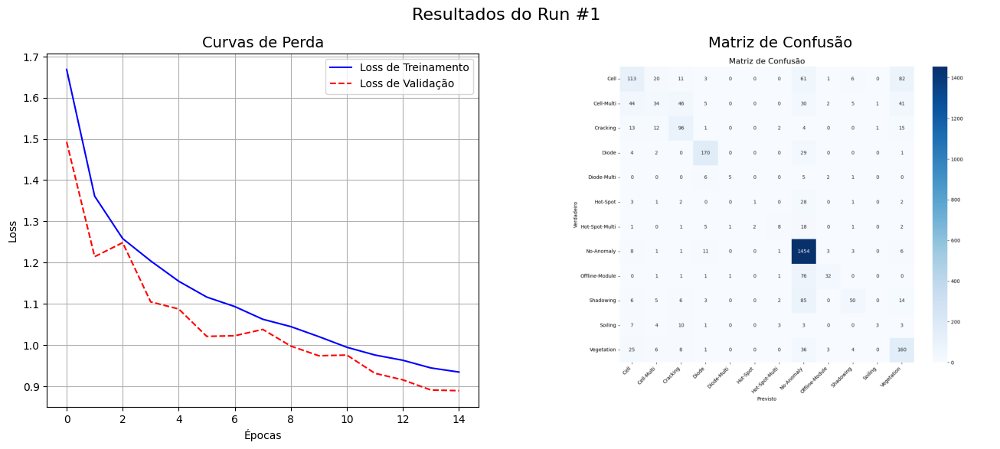


🔬 ANALISANDO RUN #2 / 20
ID do Run: c5d5c6e14f254c949f63bf21385c795e
Loss de Validação Final: 0.92605

Parâmetros:
   - lr: 0.0005659641838443741
   - dropout_rate: 0.49911891667559455
   - n_feature: 14


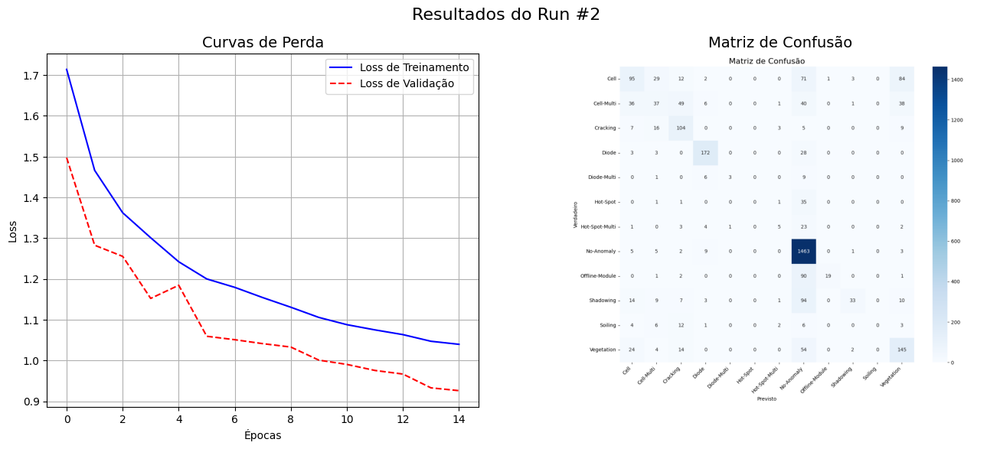


🔬 ANALISANDO RUN #3 / 20
ID do Run: bdb6e2403e1f4a92becbd847a1d526d0
Loss de Validação Final: 0.92858

Parâmetros:
   - lr: 0.0009560059228078452
   - dropout_rate: 0.42824797097280914
   - n_feature: 14


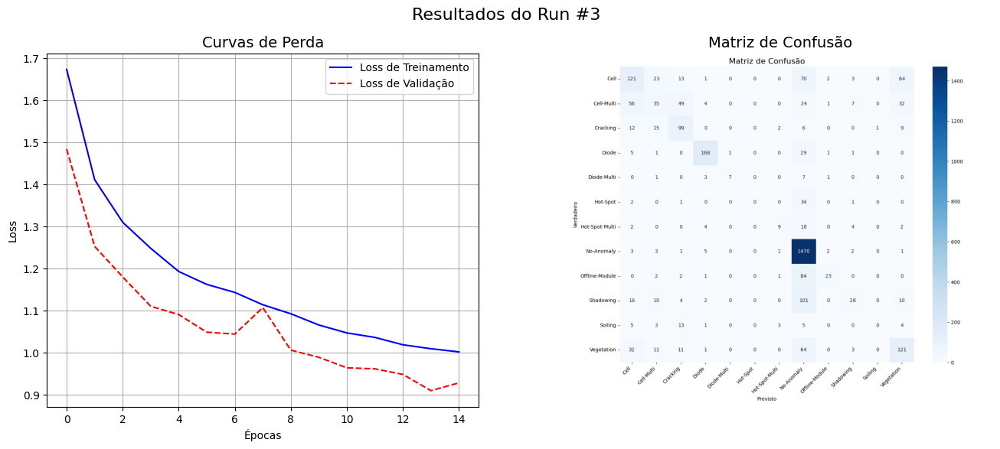


🔬 ANALISANDO RUN #4 / 20
ID do Run: 0d17a1e4925e4be7a6b91bb60ffb0e66
Loss de Validação Final: 0.96616

Parâmetros:
   - lr: 0.0008893570067392511
   - dropout_rate: 0.494771269228879
   - n_feature: 15


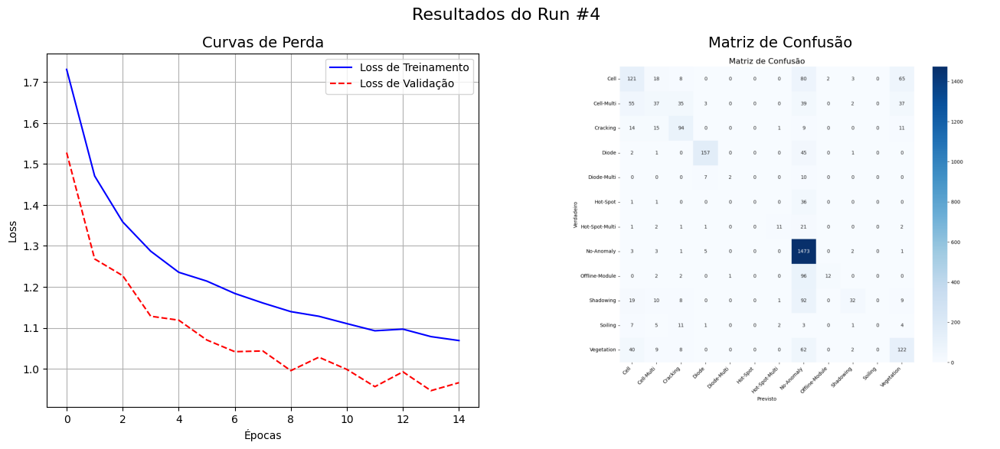


🔬 ANALISANDO RUN #5 / 20
ID do Run: 76a8d8c24fdd47e39612c149bb7565f0
Loss de Validação Final: 0.96672

Parâmetros:
   - lr: 0.0002981888093655215
   - dropout_rate: 0.4192161848024607
   - n_feature: 13


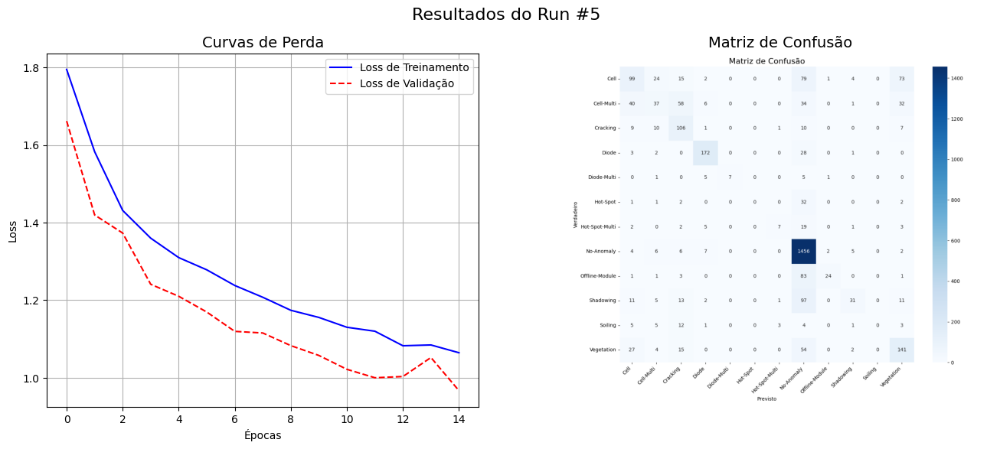


🔬 ANALISANDO RUN #6 / 20
ID do Run: 1280f0a12fc644058545eac74463e2a2
Loss de Validação Final: 0.96787

Parâmetros:
   - lr: 0.0009830175263413061
   - dropout_rate: 0.4570030231706655
   - n_feature: 16


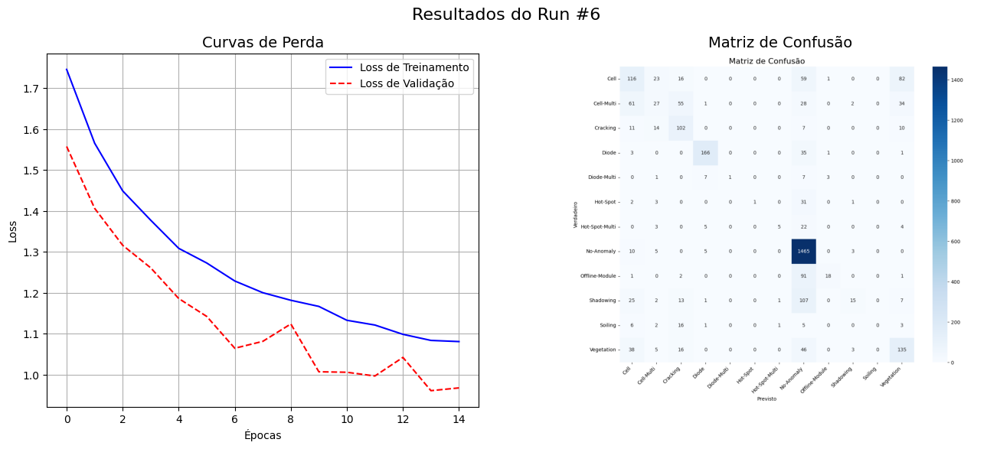


🔬 ANALISANDO RUN #7 / 20
ID do Run: 106fc20db31141abaad809efed48597e
Loss de Validação Final: 0.97031

Parâmetros:
   - lr: 0.0005178437215550134
   - dropout_rate: 0.44139206692138394
   - n_feature: 13


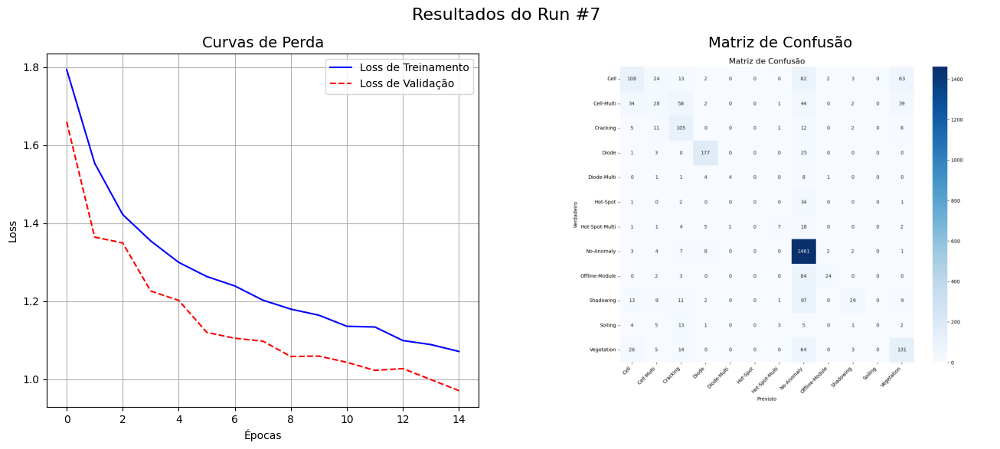


🔬 ANALISANDO RUN #8 / 20
ID do Run: 881fd02b6d0244ffbb32076eefd10795
Loss de Validação Final: 0.98987

Parâmetros:
   - lr: 0.0004435327396568911
   - dropout_rate: 0.28365028413191185
   - n_feature: 8


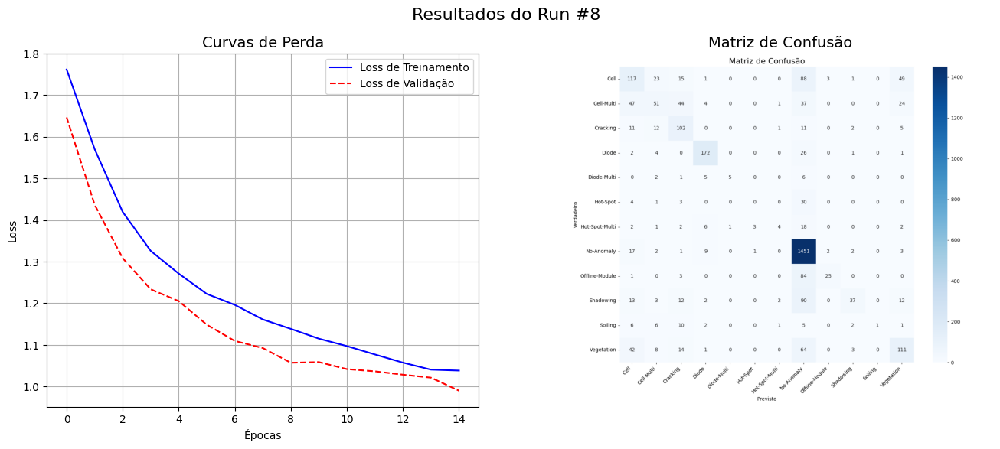


🔬 ANALISANDO RUN #9 / 20
ID do Run: 95733da7c9b842549f1d1902e911400d
Loss de Validação Final: 1.00397

Parâmetros:
   - lr: 0.0004584419071211875
   - dropout_rate: 0.37420053111721596
   - n_feature: 7


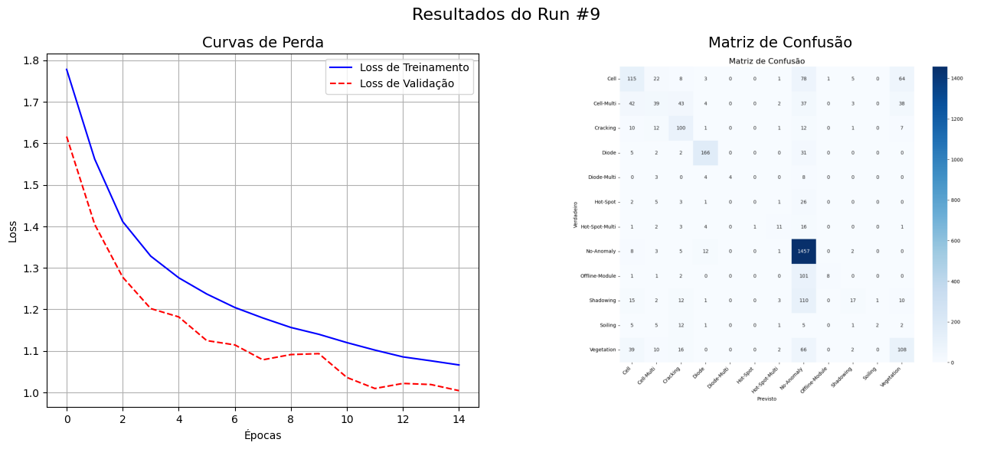


🔬 ANALISANDO RUN #10 / 20
ID do Run: d5446148350a4ffa9abfd8d4a216c251
Loss de Validação Final: 1.00902

Parâmetros:
   - lr: 0.0009776281491578342
   - dropout_rate: 0.4735942343384408
   - n_feature: 16


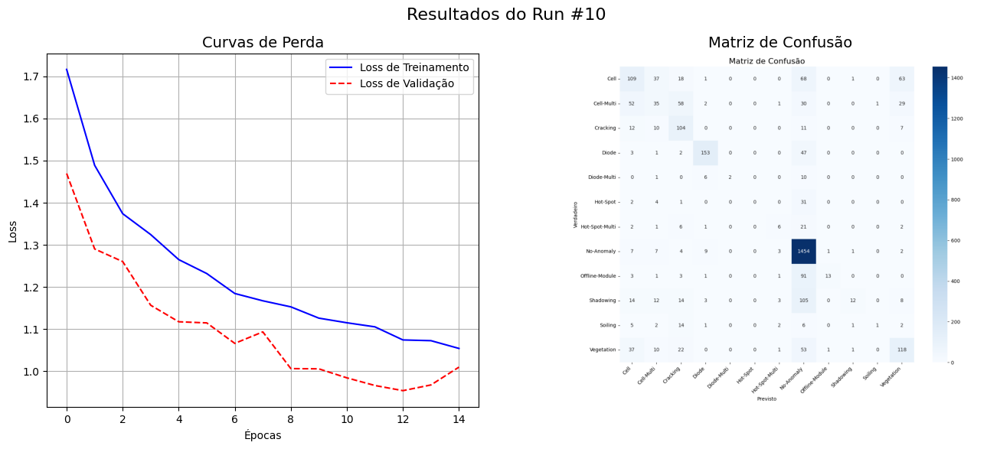


🔬 ANALISANDO RUN #11 / 20
ID do Run: 4c32990dd1b1427fb361593eae4f912c
Loss de Validação Final: 1.02700

Parâmetros:
   - lr: 0.0002432400716842307
   - dropout_rate: 0.23448094067692607
   - n_feature: 9


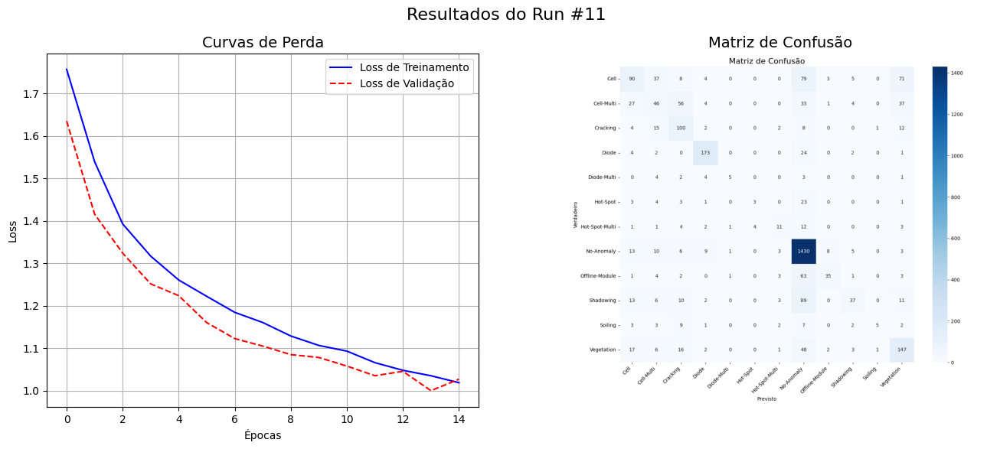


🔬 ANALISANDO RUN #12 / 20
ID do Run: 463cf883dbb64a41a1b2a3f683d031b6
Loss de Validação Final: 1.03221

Parâmetros:
   - lr: 0.0008343190339022007
   - dropout_rate: 0.4940183698244794
   - n_feature: 16


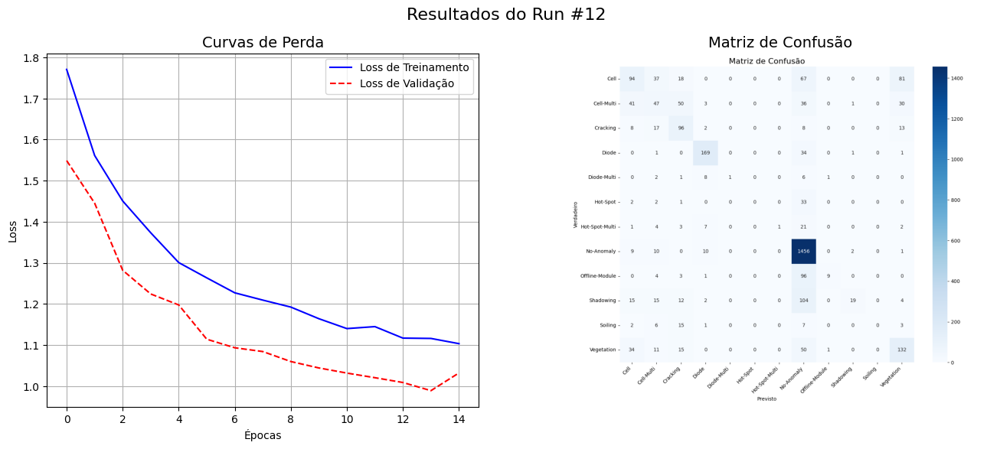


🔬 ANALISANDO RUN #13 / 20
ID do Run: 0c9a0510fe82430ba1c128848f665823
Loss de Validação Final: 1.16689

Parâmetros:
   - lr: 0.00013600333114777974
   - dropout_rate: 0.4147736431683601
   - n_feature: 12


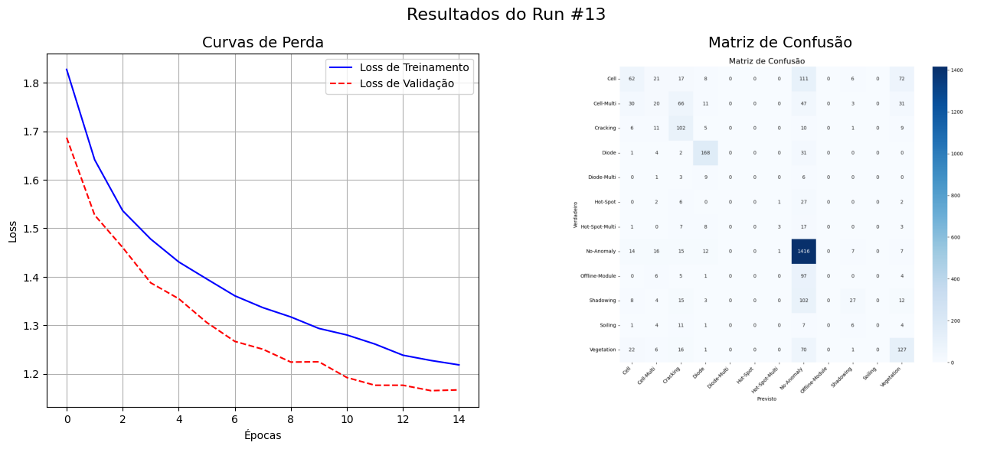


🔬 ANALISANDO RUN #14 / 20
ID do Run: 1e7e554b2af24527970edcefbd0f0fa2
Loss de Validação Final: 1.17887

Parâmetros:
   - lr: 0.0002480318287915911
   - dropout_rate: 0.456812612682163
   - n_feature: 6


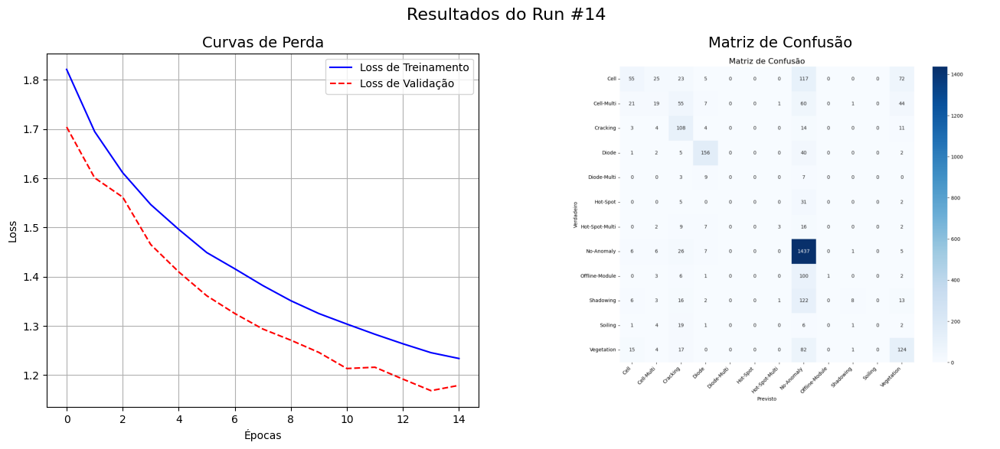


🔬 ANALISANDO RUN #15 / 20
ID do Run: 26adb641115a417b9babcd74eff6dded
Loss de Validação Final: 1.22086

Parâmetros:
   - lr: 7.089770147367083e-05
   - dropout_rate: 0.3796657127177262
   - n_feature: 11


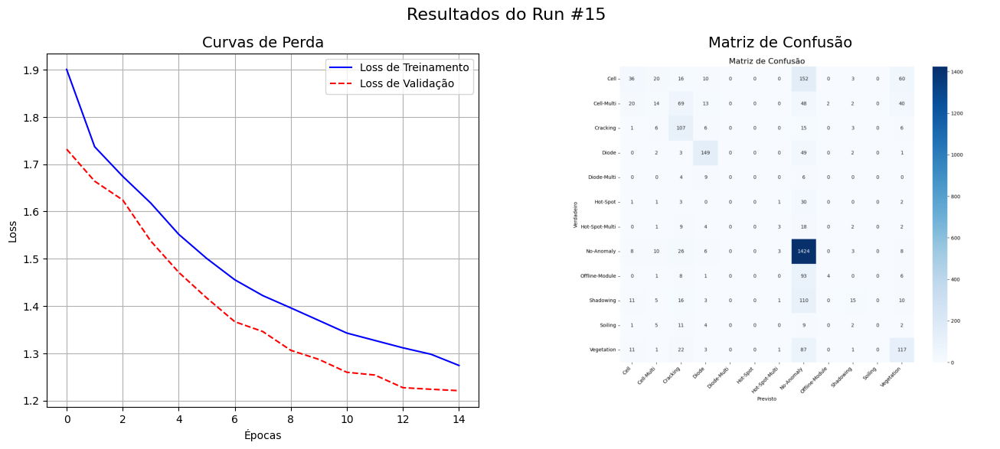


🔬 ANALISANDO RUN #16 / 20
ID do Run: 1e66885640ae4841a45e4ff3b19ee027
Loss de Validação Final: 1.27195

Parâmetros:
   - lr: 0.00015865208232788787
   - dropout_rate: 0.28238038153830614
   - n_feature: 4


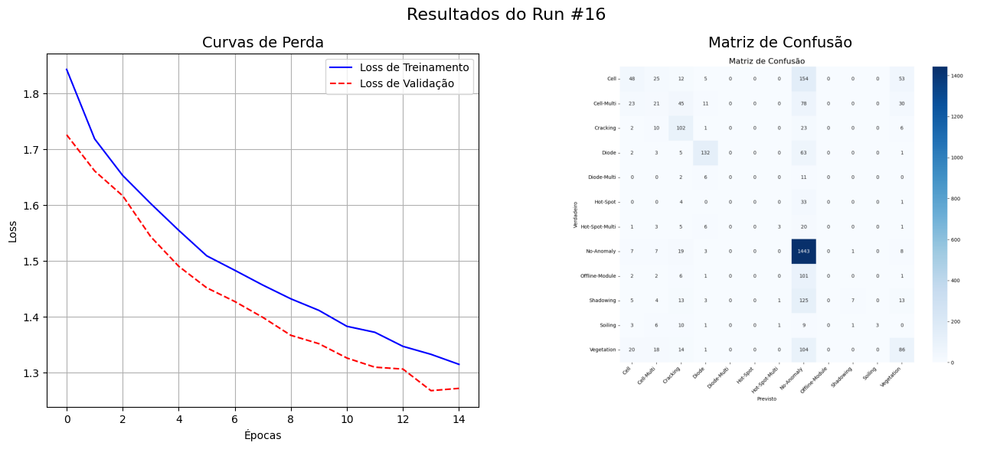


🔬 ANALISANDO RUN #17 / 20
ID do Run: a8de8d76d1e9435cb3cfc557ff8bd817
Loss de Validação Final: 1.32000

Parâmetros:
   - lr: 0.0001052863640327261
   - dropout_rate: 0.3424898657595308
   - n_feature: 5


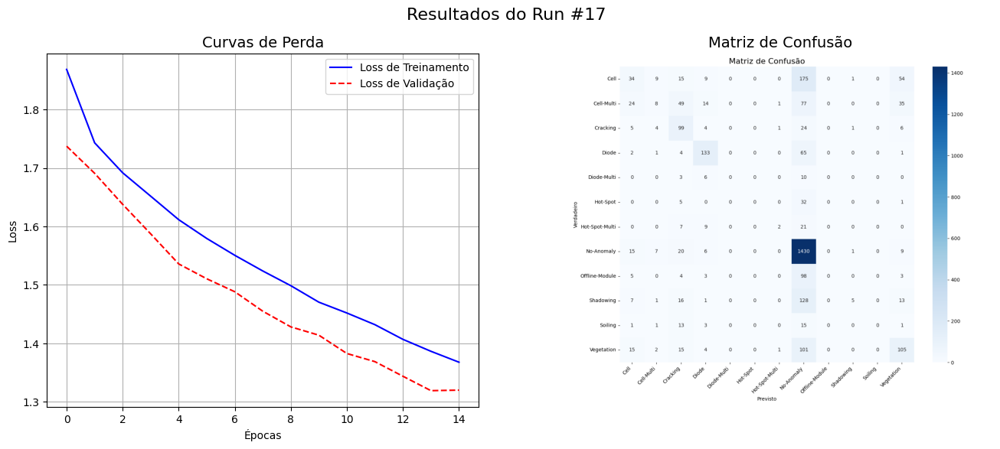


🔬 ANALISANDO RUN #18 / 20
ID do Run: 7df9111812b949989df2a6d2e41d08f5
Loss de Validação Final: 1.38757

Parâmetros:
   - lr: 4.102070668045529e-05
   - dropout_rate: 0.10187959573942883
   - n_feature: 5


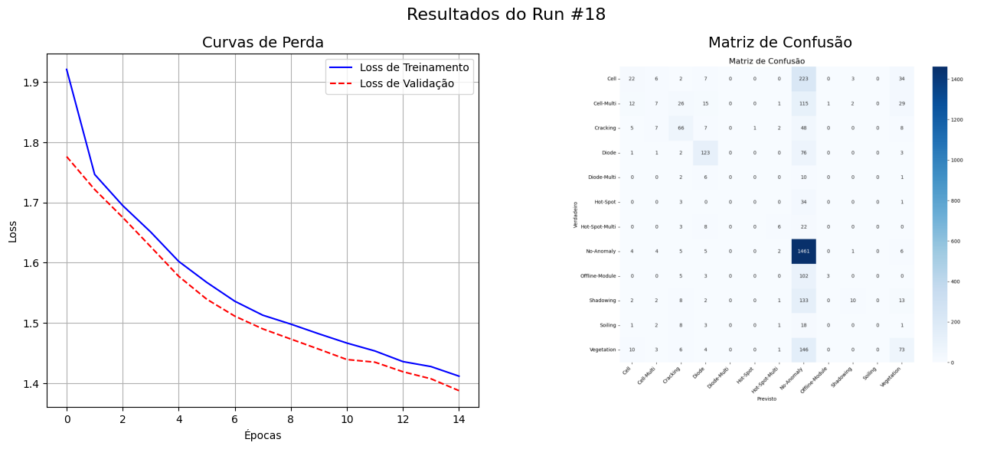


🔬 ANALISANDO RUN #19 / 20
ID do Run: c6b51141424f469e9b9f01f792e999f8
Loss de Validação Final: 1.56895

Parâmetros:
   - lr: 2.098088282695299e-05
   - dropout_rate: 0.38134458534086124
   - n_feature: 7


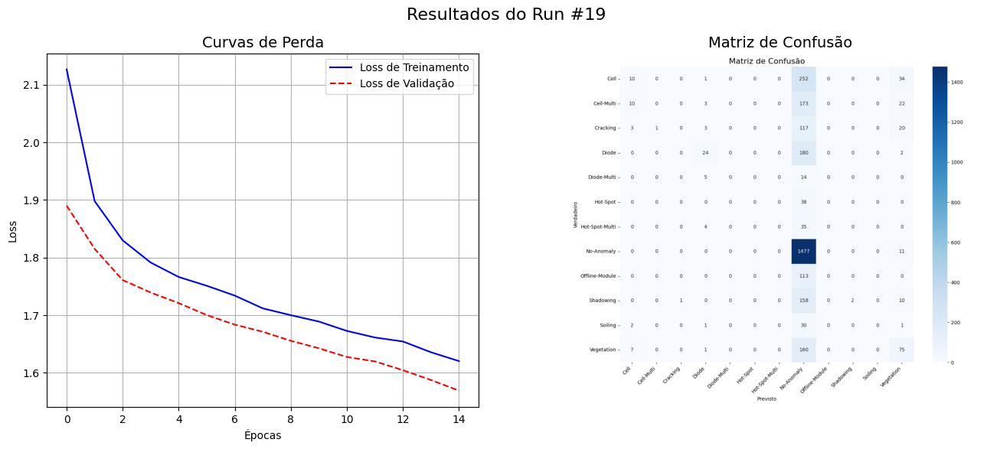


🔬 ANALISANDO RUN #20 / 20
ID do Run: 13a251cf94e24bab936c20a4f2d612a9
Loss de Validação Final: 1.68672

Parâmetros:
   - lr: 1.1177285796090666e-05
   - dropout_rate: 0.16989998387525254
   - n_feature: 7


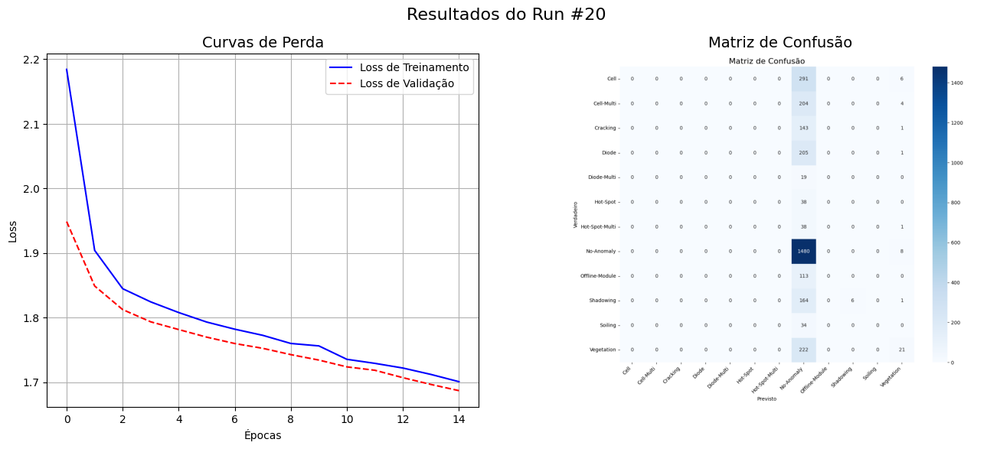


✅ Relatório completo gerado com sucesso!


In [ ]:
import mlflow
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

print("--- Iniciando a Geração do Relatório Completo para Todos os Runs ---")

# Buscar os Dados de Todos os Runs ---

try:
    # Busca TODOS os runs do experimento
    all_runs_df = mlflow.search_runs(
        experiment_names=["Otimização do Modelo de Painéis Solares"],
        # Ordena para que os melhores apareçam primeiro no relatório
        order_by=["metrics.final_val_loss ASC"]
    )

    if all_runs_df.empty:
        print("\nNenhum run encontrado. Execute a otimização primeiro.")
    else:
        print(f"\nEncontrados {len(all_runs_df)} runs. Gerando relatório para cada um...")
        # Cria o cliente do MLflow para usar no loop
        client = mlflow.tracking.MlflowClient()

        # Loop para Imprimir e Plotar Cada Run

        for index, run in all_runs_df.iterrows():
            # Pega as informações básicas do run atual
            run_id = run['run_id']
            final_loss = run['metrics.final_val_loss']

            # Imprime um cabeçalho para separar os runs
            print("\n" + "="*80)
            print(f"🔬 ANALISANDO RUN #{index + 1} / {len(all_runs_df)}")
            print(f"ID do Run: {run_id}")
            print(f"Loss de Validação Final: {final_loss:.5f}")

            # Imprime os parâmetros
            print("\nParâmetros:")
            param_cols = [col for col in run.index if col.startswith('params.')]
            for param in param_cols:
                param_name = param.replace('params.', '')
                param_value = run[param]
                print(f"   - {param_name}: {param_value}")

            #Plotagem dos Gráficos

            # Busca o histórico de métricas para o run atual
            train_loss_history = client.get_metric_history(run_id, "train_loss")
            val_loss_history = client.get_metric_history(run_id, "val_loss")

            train_losses = [m.value for m in train_loss_history]
            val_losses = [m.value for m in val_loss_history]

            # Cria a figura para os gráficos
            fig, axes = plt.subplots(1, 2, figsize=(16, 6))
            fig.suptitle(f'Resultados do Run #{index + 1}', fontsize=16)

            # Gráfico das Curvas de Perda
            axes[0].plot(train_losses, label='Loss de Treinamento', color='blue')
            axes[0].plot(val_losses, label='Loss de Validação', color='red', linestyle='--')
            axes[0].set_title('Curvas de Perda', fontsize=14)
            axes[0].set_xlabel('Épocas')
            axes[0].set_ylabel('Loss')
            axes[0].legend()
            axes[0].grid(True)

            # Gráfico da Matriz de Confusão
            try:
                local_path = client.download_artifacts(run_id=run_id, path="plots/confusion_matrix.png")
                img = mpimg.imread(local_path)
                axes[1].imshow(img)
                axes[1].set_title('Matriz de Confusão', fontsize=14)
                axes[1].axis('off')
            except Exception as e:
                axes[1].text(0.5, 0.5, 'Matriz de Confusão\nNão Encontrada', horizontalalignment='center', verticalalignment='center')
                axes[1].set_title('Matriz de Confusão', fontsize=14)
                axes[1].axis('off')

            # Mostra os gráficos para o run atual antes de ir para o próximo
            plt.show()

        print("\n" + "="*80)
        print("✅ Relatório completo gerado com sucesso!")

except Exception as e:
    print(f"\nOcorreu um erro ao gerar o relatório: {e}")

--- Starting Generation of the Full Report for All Runs ---

Found 20 runs. Generating a report for each one...

🔬 ANALYZING RUN #1 / 20
Run ID: 7ce379465a6144b1a14efd097a7d3da5
Final Validation Loss: 0.88912

Parameters:
   - lr: 0.00047886451006673013
   - dropout_rate: 0.3371287734951104
   - n_feature: 14


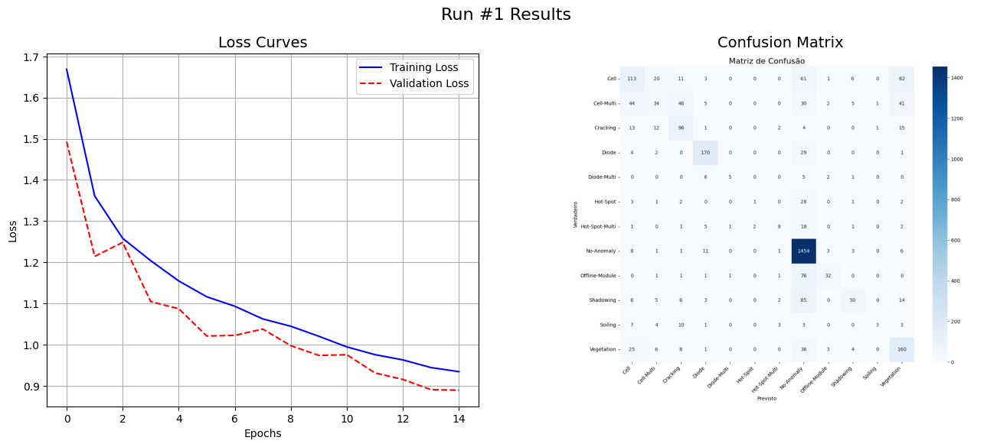


🔬 ANALYZING RUN #2 / 20
Run ID: c5d5c6e14f254c949f63bf21385c795e
Final Validation Loss: 0.92605

Parameters:
   - lr: 0.0005659641838443741
   - dropout_rate: 0.49911891667559455
   - n_feature: 14


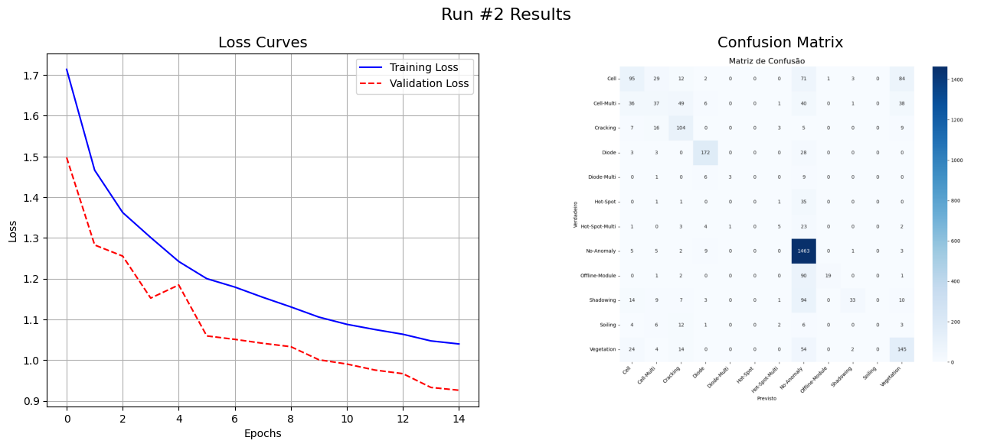


🔬 ANALYZING RUN #3 / 20
Run ID: bdb6e2403e1f4a92becbd847a1d526d0
Final Validation Loss: 0.92858

Parameters:
   - lr: 0.0009560059228078452
   - dropout_rate: 0.42824797097280914
   - n_feature: 14


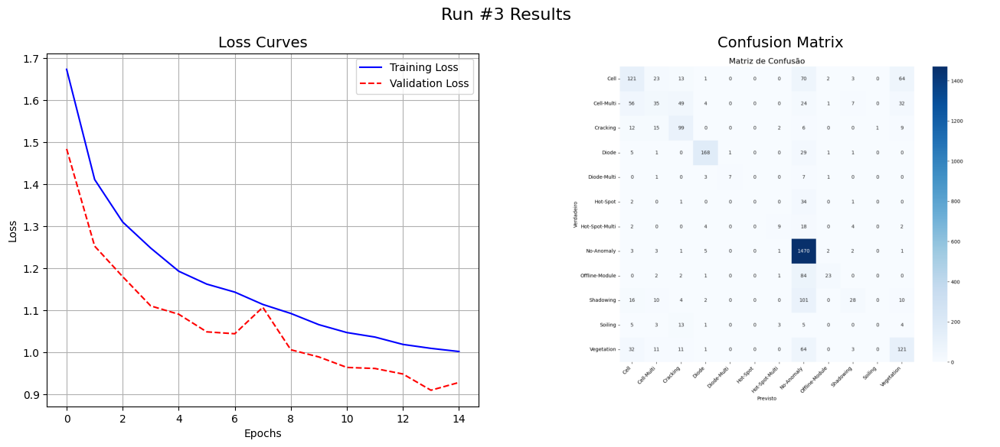


🔬 ANALYZING RUN #4 / 20
Run ID: 0d17a1e4925e4be7a6b91bb60ffb0e66
Final Validation Loss: 0.96616

Parameters:
   - lr: 0.0008893570067392511
   - dropout_rate: 0.494771269228879
   - n_feature: 15


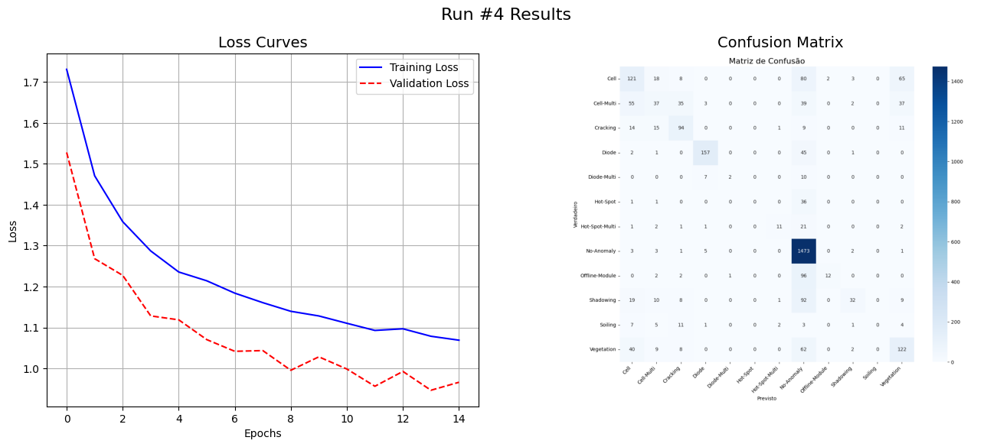


🔬 ANALYZING RUN #5 / 20
Run ID: 76a8d8c24fdd47e39612c149bb7565f0
Final Validation Loss: 0.96672

Parameters:
   - lr: 0.0002981888093655215
   - dropout_rate: 0.4192161848024607
   - n_feature: 13


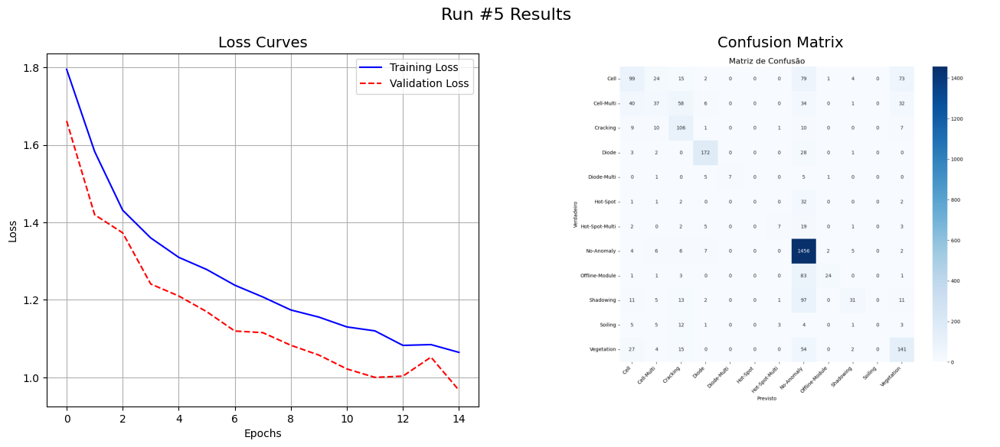


🔬 ANALYZING RUN #6 / 20
Run ID: 1280f0a12fc644058545eac74463e2a2
Final Validation Loss: 0.96787

Parameters:
   - lr: 0.0009830175263413061
   - dropout_rate: 0.4570030231706655
   - n_feature: 16


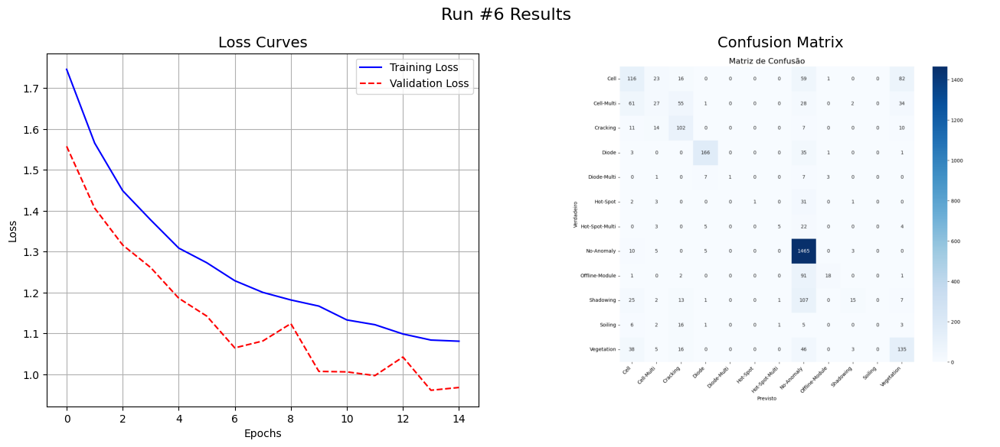


🔬 ANALYZING RUN #7 / 20
Run ID: 106fc20db31141abaad809efed48597e
Final Validation Loss: 0.97031

Parameters:
   - lr: 0.0005178437215550134
   - dropout_rate: 0.44139206692138394
   - n_feature: 13


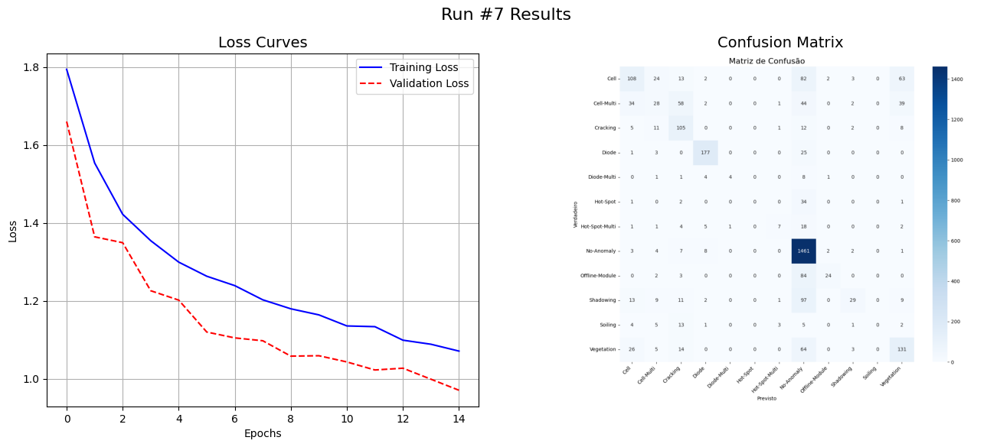


🔬 ANALYZING RUN #8 / 20
Run ID: 881fd02b6d0244ffbb32076eefd10795
Final Validation Loss: 0.98987

Parameters:
   - lr: 0.0004435327396568911
   - dropout_rate: 0.28365028413191185
   - n_feature: 8


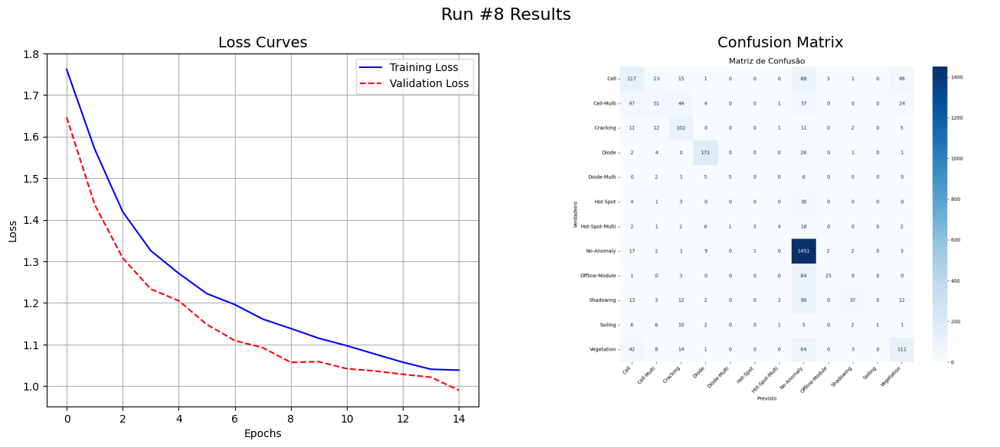


🔬 ANALYZING RUN #9 / 20
Run ID: 95733da7c9b842549f1d1902e911400d
Final Validation Loss: 1.00397

Parameters:
   - lr: 0.0004584419071211875
   - dropout_rate: 0.37420053111721596
   - n_feature: 7


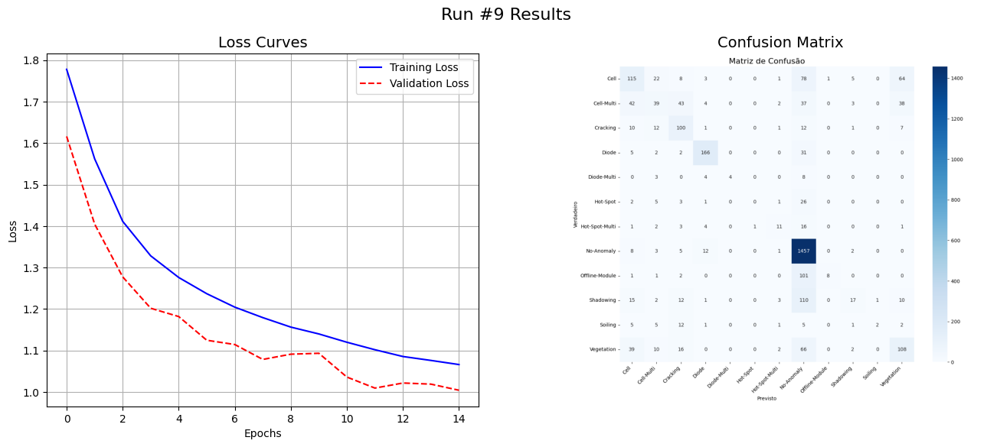


🔬 ANALYZING RUN #10 / 20
Run ID: d5446148350a4ffa9abfd8d4a216c251
Final Validation Loss: 1.00902

Parameters:
   - lr: 0.0009776281491578342
   - dropout_rate: 0.4735942343384408
   - n_feature: 16


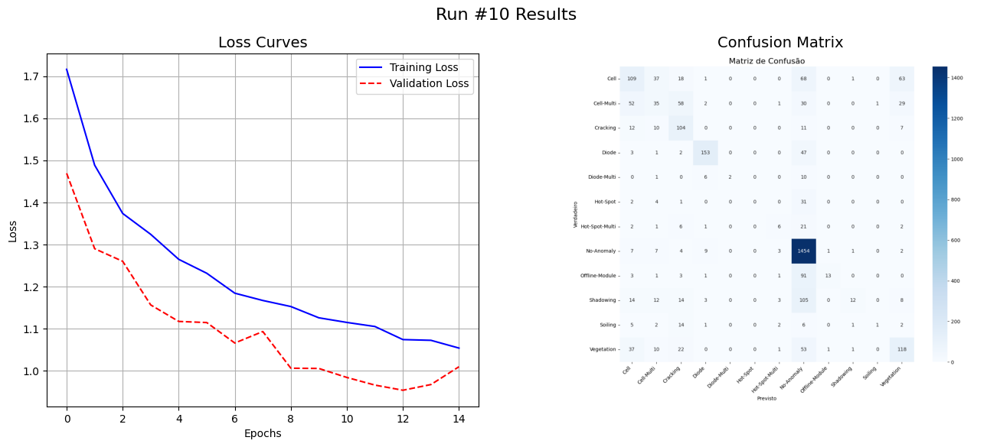


🔬 ANALYZING RUN #11 / 20
Run ID: 4c32990dd1b1427fb361593eae4f912c
Final Validation Loss: 1.02700

Parameters:
   - lr: 0.0002432400716842307
   - dropout_rate: 0.23448094067692607
   - n_feature: 9


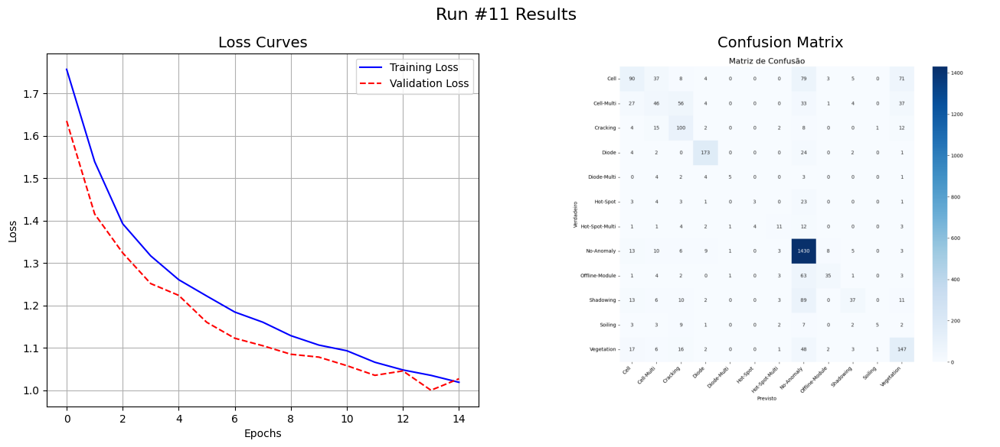


🔬 ANALYZING RUN #12 / 20
Run ID: 463cf883dbb64a41a1b2a3f683d031b6
Final Validation Loss: 1.03221

Parameters:
   - lr: 0.0008343190339022007
   - dropout_rate: 0.4940183698244794
   - n_feature: 16


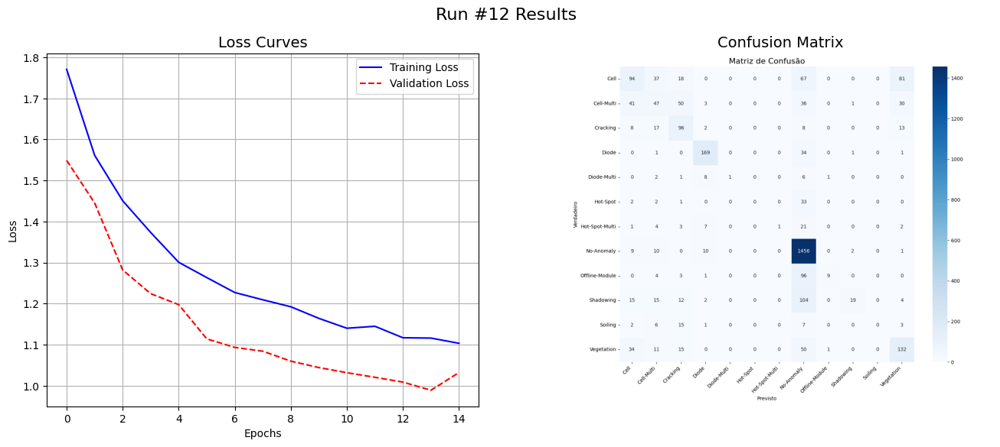


🔬 ANALYZING RUN #13 / 20
Run ID: 0c9a0510fe82430ba1c128848f665823
Final Validation Loss: 1.16689

Parameters:
   - lr: 0.00013600333114777974
   - dropout_rate: 0.4147736431683601
   - n_feature: 12


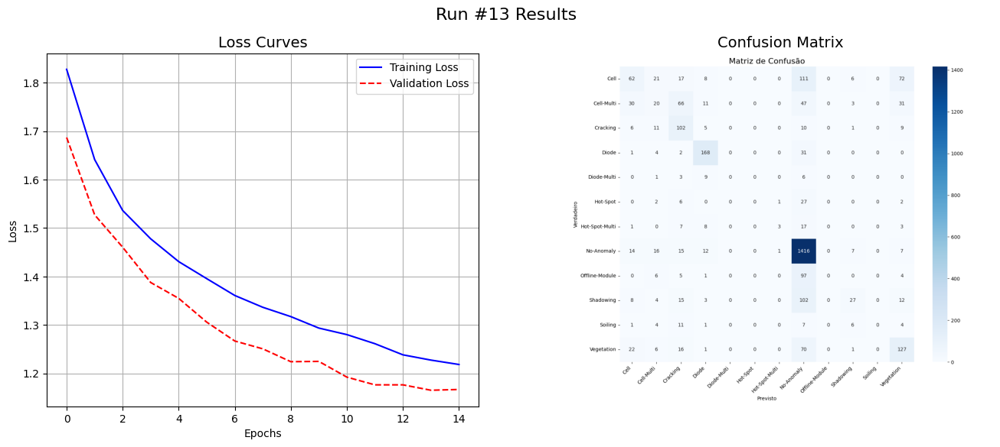


🔬 ANALYZING RUN #14 / 20
Run ID: 1e7e554b2af24527970edcefbd0f0fa2
Final Validation Loss: 1.17887

Parameters:
   - lr: 0.0002480318287915911
   - dropout_rate: 0.456812612682163
   - n_feature: 6


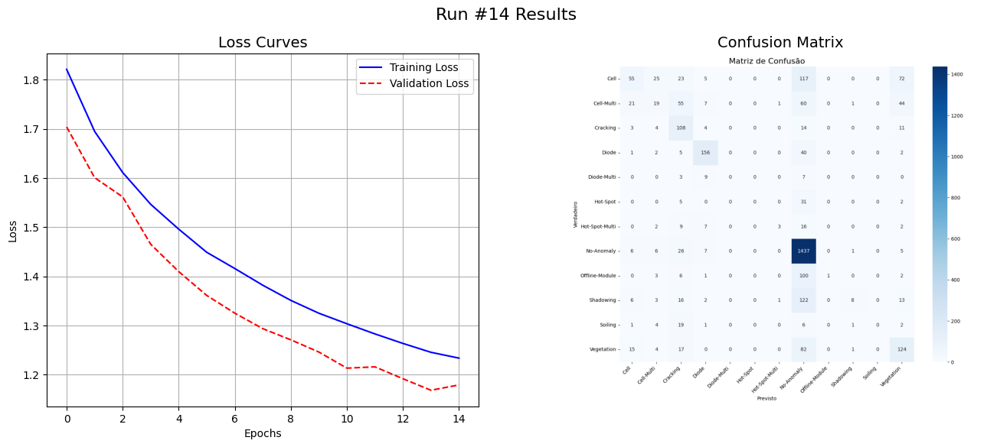


🔬 ANALYZING RUN #15 / 20
Run ID: 26adb641115a417b9babcd74eff6dded
Final Validation Loss: 1.22086

Parameters:
   - lr: 7.089770147367083e-05
   - dropout_rate: 0.3796657127177262
   - n_feature: 11


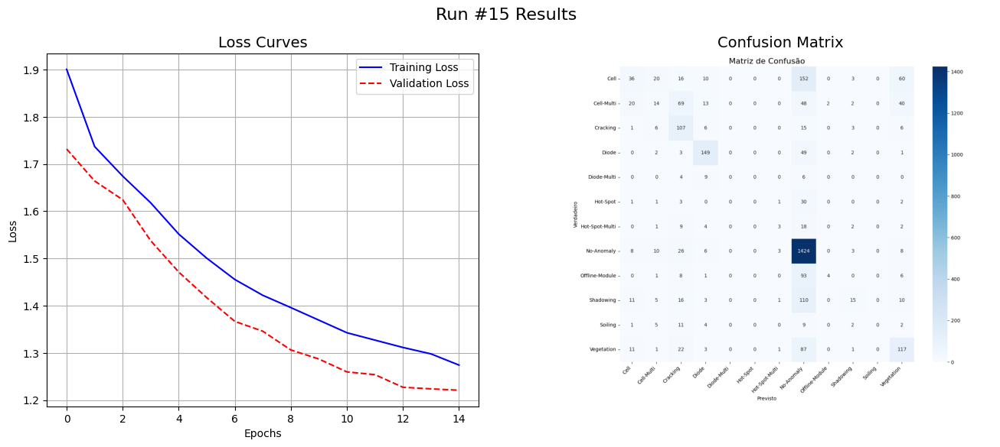


🔬 ANALYZING RUN #16 / 20
Run ID: 1e66885640ae4841a45e4ff3b19ee027
Final Validation Loss: 1.27195

Parameters:
   - lr: 0.00015865208232788787
   - dropout_rate: 0.28238038153830614
   - n_feature: 4


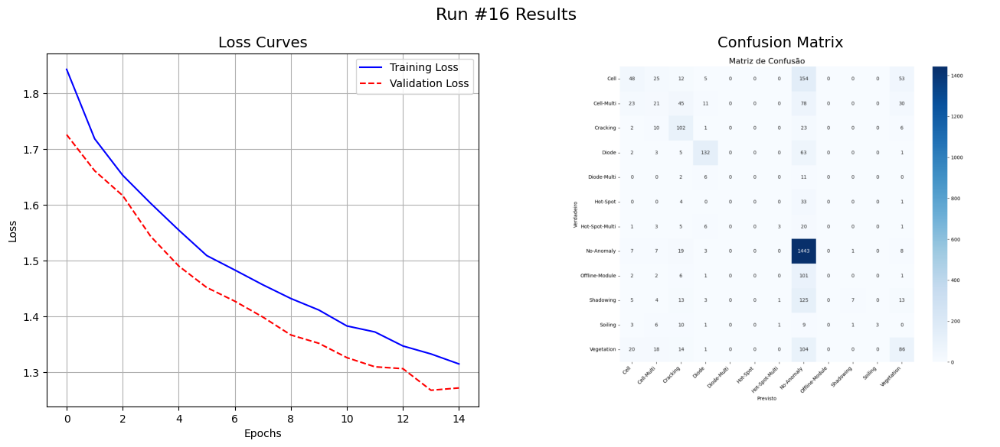


🔬 ANALYZING RUN #17 / 20
Run ID: a8de8d76d1e9435cb3cfc557ff8bd817
Final Validation Loss: 1.32000

Parameters:
   - lr: 0.0001052863640327261
   - dropout_rate: 0.3424898657595308
   - n_feature: 5


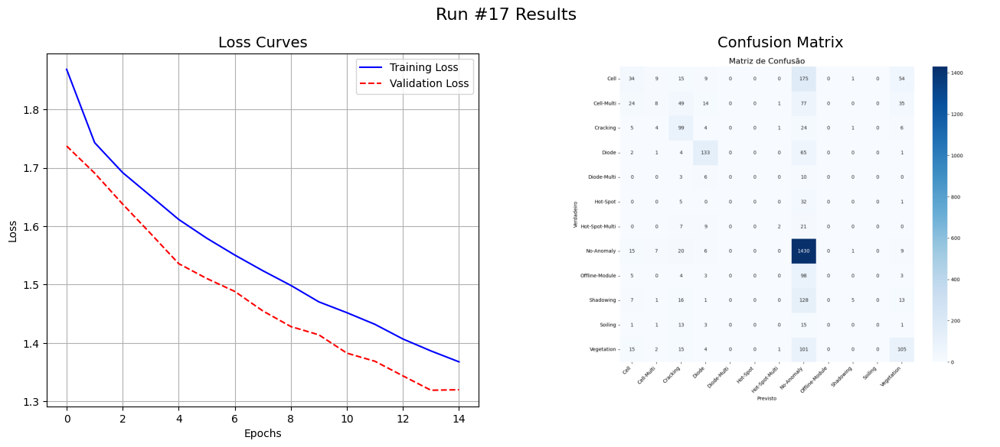


🔬 ANALYZING RUN #18 / 20
Run ID: 7df9111812b949989df2a6d2e41d08f5
Final Validation Loss: 1.38757

Parameters:
   - lr: 4.102070668045529e-05
   - dropout_rate: 0.10187959573942883
   - n_feature: 5


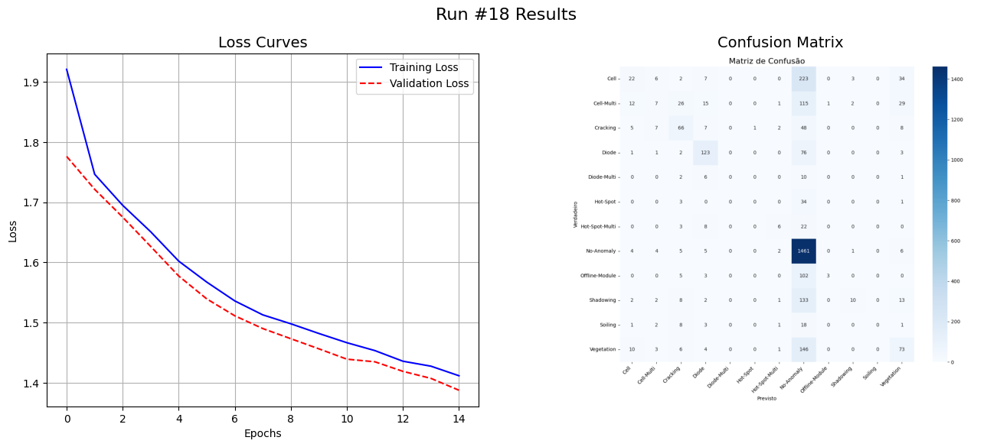


🔬 ANALYZING RUN #19 / 20
Run ID: c6b51141424f469e9b9f01f792e999f8
Final Validation Loss: 1.56895

Parameters:
   - lr: 2.098088282695299e-05
   - dropout_rate: 0.38134458534086124
   - n_feature: 7


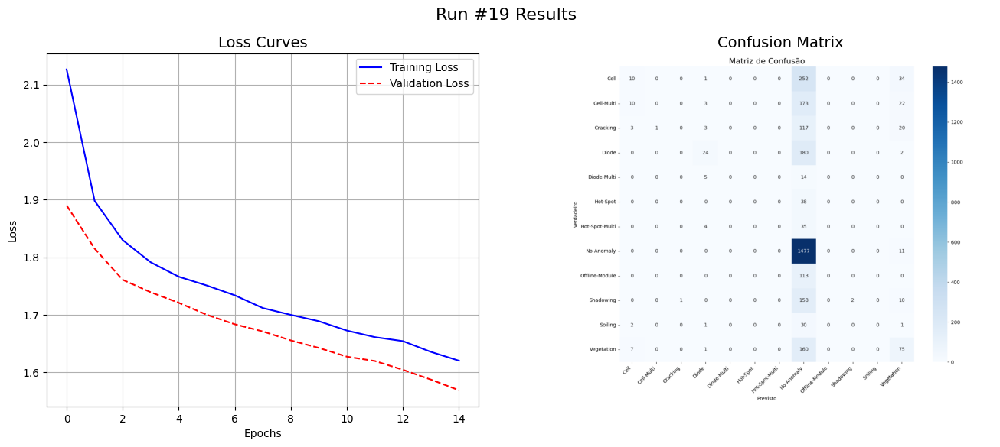


🔬 ANALYZING RUN #20 / 20
Run ID: 13a251cf94e24bab936c20a4f2d612a9
Final Validation Loss: 1.68672

Parameters:
   - lr: 1.1177285796090666e-05
   - dropout_rate: 0.16989998387525254
   - n_feature: 7


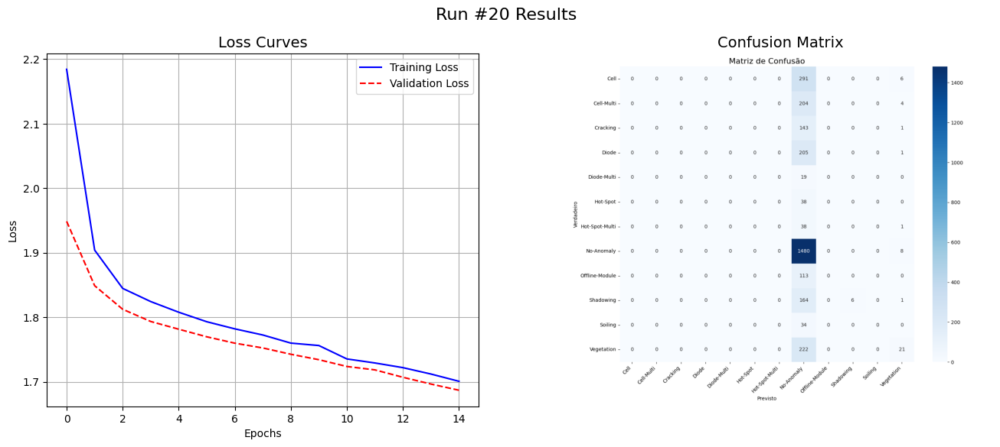


✅ Full report generated successfully!


In [ ]:
import mlflow
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

print("--- Starting Generation of the Full Report for All Runs ---")

# --- 1. Fetch Data for All Runs ---

try:
    # Fetch ALL runs from the experiment
    all_runs_df = mlflow.search_runs(
        experiment_names=["Otimização do Modelo de Painéis Solares"],
        # Sort so the best models appear first in the report
        order_by=["metrics.final_val_loss ASC"]
    )

    if all_runs_df.empty:
        print("\nNo runs found. Please run the optimization first.")
    else:
        print(f"\nFound {len(all_runs_df)} runs. Generating a report for each one...")
        # Create the MLflow client to be used inside the loop
        client = mlflow.tracking.MlflowClient()

        # --- 2. Loop to Print and Plot Each Run ---

        for index, run in all_runs_df.iterrows():
            # Get basic info for the current run
            run_id = run['run_id']
            final_loss = run['metrics.final_val_loss']

            # Print a header to separate the runs
            print("\n" + "="*80)
            print(f"🔬 ANALYZING RUN #{index + 1} / {len(all_runs_df)}")
            print(f"Run ID: {run_id}")
            print(f"Final Validation Loss: {final_loss:.5f}")

            # Print the parameters
            print("\nParameters:")
            param_cols = [col for col in run.index if col.startswith('params.')]
            for param in param_cols:
                param_name = param.replace('params.', '')
                param_value = run[param]
                print(f"   - {param_name}: {param_value}")

            # --- Plotting the Graphs ---

            # Fetch the metric history for the current run
            train_loss_history = client.get_metric_history(run_id, "train_loss")
            val_loss_history = client.get_metric_history(run_id, "val_loss")

            train_losses = [m.value for m in train_loss_history]
            val_losses = [m.value for m in val_loss_history]

            # Create the figure for the plots
            fig, axes = plt.subplots(1, 2, figsize=(16, 6))
            fig.suptitle(f'Run #{index + 1} Results', fontsize=16)

            # Loss Curves Plot
            axes[0].plot(train_losses, label='Training Loss', color='blue')
            axes[0].plot(val_losses, label='Validation Loss', color='red', linestyle='--')
            axes[0].set_title('Loss Curves', fontsize=14)
            axes[0].set_xlabel('Epochs')
            axes[0].set_ylabel('Loss')
            axes[0].legend()
            axes[0].grid(True)

            # Confusion Matrix Plot
            try:
                local_path = client.download_artifacts(run_id=run_id, path="plots/confusion_matrix.png")
                img = mpimg.imread(local_path)
                axes[1].imshow(img)
                axes[1].set_title('Confusion Matrix', fontsize=14)
                axes[1].axis('off')
            except Exception as e:
                axes[1].text(0.5, 0.5, 'Confusion Matrix\nNot Found', horizontalalignment='center', verticalalignment='center')
                axes[1].set_title('Confusion Matrix', fontsize=14)
                axes[1].axis('off')

            # Show the plots for the current run before moving to the next
            plt.show()

        print("\n" + "="*80)
        print("✅ Full report generated successfully!")

except Exception as e:
    print(f"\nAn error occurred while generating the report: {e}")

## **Rodando o melhor modelo**

In [ ]:
torch.manual_seed(42)

# Model/Architecture
model_cnn2_best_parameters = CNN2(n_feature=14, p=0.3371287734951104)

# Loss function
multi_loss_fn_best_parameters = nn.CrossEntropyLoss(reduction='mean')

# Optimizer
optimizer_cnn2_best_parameters = optim.Adam(model_cnn2_best_parameters.parameters(), lr=0.0004788645100667)

In [ ]:
optimizer_cnn2_best_parameters.state_dict()

{'state': {},
 'param_groups': [{'lr': 0.0004788645100667,
   'betas': (0.9, 0.999),
   'eps': 1e-08,
   'weight_decay': 0,
   'amsgrad': False,
   'maximize': False,
   'foreach': None,
   'capturable': False,
   'differentiable': False,
   'fused': None,
   'params': [0, 1, 2, 3, 4, 5, 6, 7]}]}

In [ ]:
arch_cnn2_best_parameters = Architecture(model_cnn2_best_parameters,
                        multi_loss_fn_best_parameters,
                        optimizer_cnn2_best_parameters)
arch_cnn2_best_parameters.set_loaders(train_loader, val_loader)
arch_cnn2_best_parameters.train(15)

In [ ]:
arch_cnn2_best_parameters.count_parameters()

72832

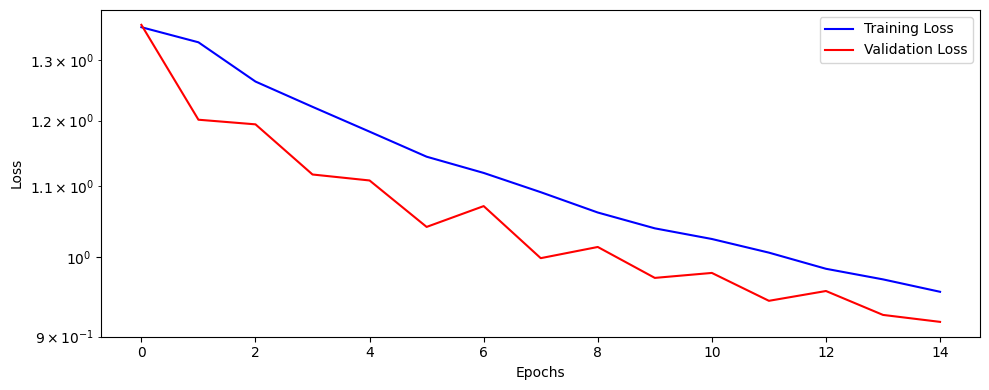

In [ ]:
fig = arch_cnn2_best_parameters.plot_losses()

In [ ]:
acc_train_cnn2bp = (lambda x: x[0].item() / x[1].item())(Architecture.loader_apply(train_loader, arch_cnn2_best_parameters.correct).sum(axis=0))
acc_val_cnn2bp = (lambda x: x[0].item() / x[1].item())(Architecture.loader_apply(val_loader, arch_cnn2_best_parameters.correct).sum(axis=0))

print(f"Acurácia de treinamento do modelo:{acc_train_cnn2bp: .5f}")
print(f"Acurácia de validação do modelo:{acc_val_cnn2bp: .5f}")

Acurácia de treinamento do modelo: 0.74441
Acurácia de validação do modelo: 0.70267


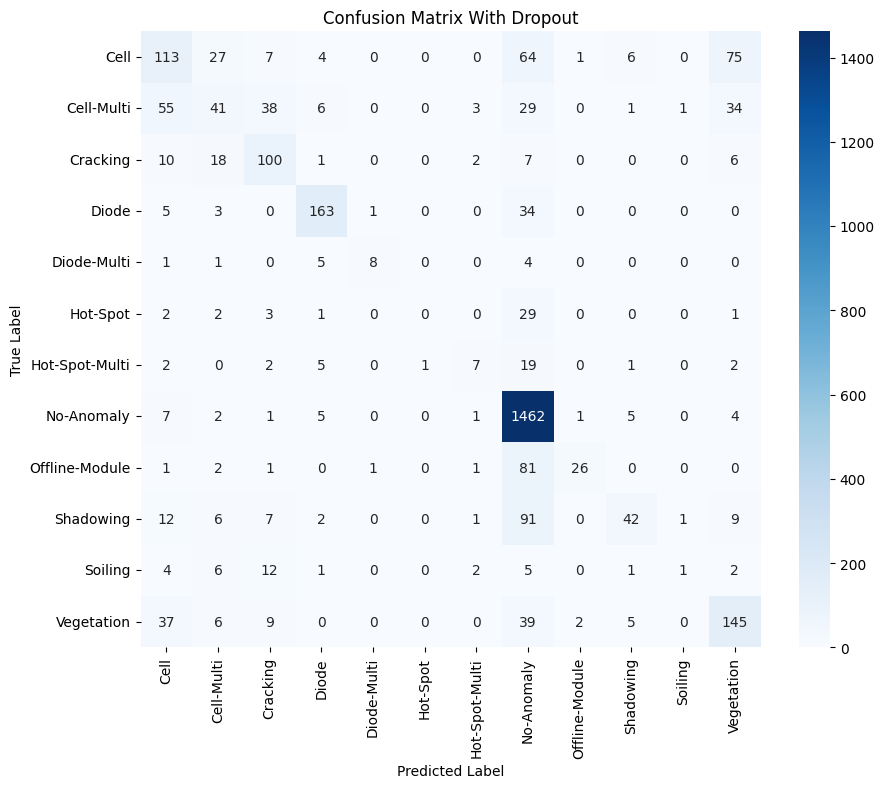

In [ ]:
cm_arch_cnn2bp = plot_confusion_matrix(arch_cnn2_best_parameters)

In [ ]:
precision_per_class_cnn2bp = class_precision(cm_arch_cnn2bp)
print("\nPrecisão por Classe (derivada da matriz de confusão):")
class_names = val_data.classes # Assuming val_data.classes holds the class names
for i, precision in enumerate(precision_per_class_cnn2bp):
    print(f"  Classe '{class_names[i]}': {precision:.4f}")


Precisão por Classe (derivada de cm_vdbp):
  Classe 'Cell': 0.4538
  Classe 'Cell-Multi': 0.3596
  Classe 'Cracking': 0.5556
  Classe 'Diode': 0.8446
  Classe 'Diode-Multi': 0.8000
  Classe 'Hot-Spot': 0.0000
  Classe 'Hot-Spot-Multi': 0.4118
  Classe 'No-Anomaly': 0.7843
  Classe 'Offline-Module': 0.8667
  Classe 'Shadowing': 0.6885
  Classe 'Soiling': 0.3333
  Classe 'Vegetation': 0.5216


In [ ]:
class_counts_val = np.bincount(val_data.targets)
weighted_avg_precision_cnn2bp = weighted_precision(cm_arch_cnn2bp, class_counts_val)
print(f"\nMédia ponderada da precisão (ponderada pela quantidade de amostras): {weighted_avg_precision_cnn2bp:.4f}")


Média ponderada da precisão (ponderada pela quantidade de amostras): 0.6719


#**Modelo CNN com mais camadas**

## Implementação da VeryDeepCNN

In [ ]:
class VeryDeepCNN(nn.Module):
    def __init__(self, n_feature, p=0.0):
        super(VeryDeepCNN, self).__init__()
        self.n_feature = n_feature
        self.p = p

        # Creates the convolution layers
        # Using padding=1 to better preserve the image size,
        # which is essential for deeper networks.
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=n_feature, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=n_feature, out_channels=n_feature * 2, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(in_channels=n_feature * 2, out_channels=n_feature * 4, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(in_channels=n_feature * 4, out_channels=n_feature * 8, kernel_size=3, padding=1)

        # Creates the linear layers
        # The input size of the first fully connected layer is calculated based on the output size of the last convolutional layer.
        # For a 46x46 input image:
        # After conv1 (k=3, p=1): (46 - 3 + 2*1) + 1 = 46. After pool (k=2): floor(46/2) = 23 -> 23x23
        # After conv2 (k=3, p=1): (23 - 3 + 2*1) + 1 = 23. After pool (k=2): floor(23/2) = 11 -> 11x11
        # After conv3 (k=3, p=1): (11 - 3 + 2*1) + 1 = 11. After pool (k=2): floor(11/2) = 5 -> 5x5
        # After conv4 (k=3, p=1): (5 - 3 + 2*1) + 1 = 5.   After pool (k=2): floor(5/2) = 2 -> 2x2
        # So the flattened output size is (n_feature * 8) * 2 * 2
        self.fc1 = nn.Linear(in_features=(n_feature * 8) * 4, out_features=50)
        self.fc2 = nn.Linear(in_features=50, out_features=12)

        # Creates dropout layer
        self.drop = nn.Dropout(self.p)

    def featurizer(self, x):
        # Featurizer
        # First convolutional block
        # 3@46x46 -> n_feature@23x23
        x = F.max_pool2d(F.relu(self.conv1(x)), kernel_size=2, stride=2)
        # Second convolutional block
        # n_feature@23x23 -> (n_feature*2)@11x11
        x = F.max_pool2d(F.relu(self.conv2(x)), kernel_size=2, stride=2)
        # Third convolutional block
        # (n_feature*2)@11x11 -> (n_feature*4)@5x5
        x = F.max_pool2d(F.relu(self.conv3(x)), kernel_size=2, stride=2)
        # Fourth convolutional block
        # (n_feature*4)@5x5 -> (n_feature*8)@2x2
        x = F.max_pool2d(F.relu(self.conv4(x)), kernel_size=2, stride=2)

        # Flatten the tensor for the classifier
        # Input dimension ((n_feature*8)@2x2)
        # Output dimension ((n_feature*8) * 4)
        x = nn.Flatten()(x)
        return x

    def classifier(self, x):
        # Classifier
        # Hidden Layer
        # Input dimension ((n_feature * 8) * 4)
        # Output dimension (50)
        if self.p > 0:
            x = self.drop(x)
        x = F.relu(self.fc1(x))

        # Output Layer
        # Input dimension (50)
        # Output dimension (12)
        if self.p > 0:
            x = self.drop(x)
        x = self.fc2(x)
        return x

    def forward(self, x):
        x = self.featurizer(x)
        x = self.classifier(x)
        return x

In [ ]:
torch.manual_seed(42)

model_very_deep = VeryDeepCNN(n_feature=5, p=0.3)
multi_loss_fn = nn.CrossEntropyLoss(reduction='mean')
optimizer_very_deep = optim.Adam(model_very_deep.parameters(), lr=3e-4)

#Training

arch_very_deep = Architecture(model_very_deep,
                              multi_loss_fn,
                              optimizer_very_deep)

arch_very_deep.set_loaders(train_loader, val_loader)

print("--- Training the Deeper Network (VeryDeepCNN) ---")
arch_very_deep.train(10) #number of epochs
print("--- Training Complete ---")

--- Training the Deeper Network (VeryDeepCNN) ---
--- Training Complete ---


In [ ]:
optimizer_very_deep.state_dict()

{'state': {0: {'step': tensor(10630.),
   'exp_avg': tensor([[[[ 0.0010,  0.0012,  0.0029],
             [-0.0038, -0.0034, -0.0017],
             [-0.0089, -0.0078, -0.0062]],
   
            [[ 0.0010,  0.0012,  0.0029],
             [-0.0038, -0.0034, -0.0017],
             [-0.0089, -0.0078, -0.0062]],
   
            [[ 0.0010,  0.0012,  0.0029],
             [-0.0038, -0.0034, -0.0017],
             [-0.0089, -0.0078, -0.0062]]],
   
   
           [[[ 0.0124,  0.0140,  0.0161],
             [ 0.0098,  0.0110,  0.0136],
             [ 0.0090,  0.0108,  0.0135]],
   
            [[ 0.0124,  0.0140,  0.0161],
             [ 0.0098,  0.0110,  0.0136],
             [ 0.0090,  0.0108,  0.0135]],
   
            [[ 0.0124,  0.0140,  0.0161],
             [ 0.0098,  0.0110,  0.0136],
             [ 0.0090,  0.0108,  0.0135]]],
   
   
           [[[ 0.0354,  0.0498,  0.0497],
             [ 0.0333,  0.0484,  0.0487],
             [ 0.0305,  0.0459,  0.0466]],
   
            [[ 0.0354, 

In [ ]:
arch_very_deep.count_parameters()

18322

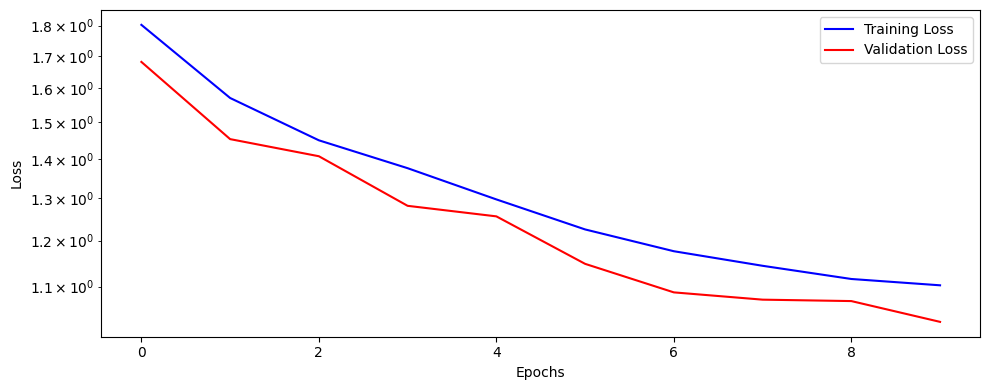

In [ ]:
fig = arch_very_deep.plot_losses()

In [ ]:
acc_train_vdd = (lambda x: x[0].item() / x[1].item())(Architecture.loader_apply(train_loader, arch_very_deep.correct).sum(axis=0))
acc_val_vdd = (lambda x: x[0].item() / x[1].item())(Architecture.loader_apply(val_loader, arch_very_deep.correct).sum(axis=0))

print(f"Acurácia de treinamento do modelo:{acc_train_vdd: .5f}")
print(f"Acurácia de validação do modelo:{acc_val_vdd: .3f}")

Acurácia de treinamento do modelo: 0.68976
Acurácia de validação do modelo: 0.668


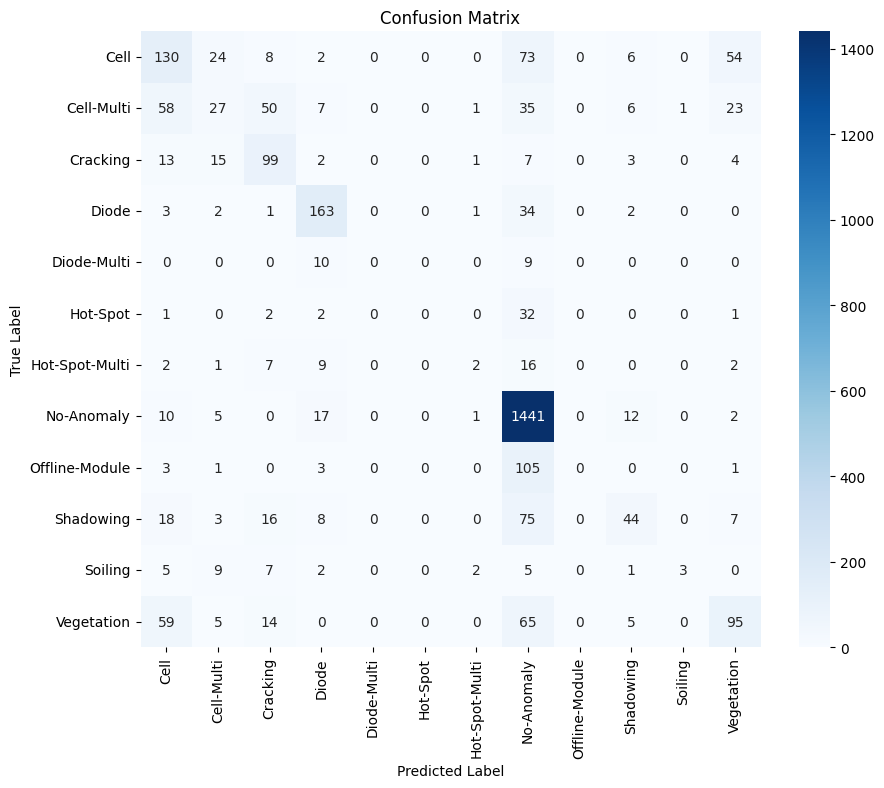

In [ ]:
cm_arch_vdd = plot_confusion_matrix(arch_very_deep)

In [ ]:
precision_per_class_vdd = class_precision(cm_arch_vdd)
print("\nPrecisão por Classe (derivada da matriz de confusão):")
class_names = val_data.classes # Assuming val_data.classes holds the class names
for i, precision in enumerate(precision_per_class_vdd):
    print(f"  Classe '{class_names[i]}': {precision:.4f}")


Precisão por Classe (derivada da matriz de confusão):
  Classe 'Cell': 0.4305
  Classe 'Cell-Multi': 0.2935
  Classe 'Cracking': 0.4853
  Classe 'Diode': 0.7244
  Classe 'Diode-Multi': 0.0000
  Classe 'Hot-Spot': 0.0000
  Classe 'Hot-Spot-Multi': 0.2500
  Classe 'No-Anomaly': 0.7596
  Classe 'Offline-Module': 0.0000
  Classe 'Shadowing': 0.5570
  Classe 'Soiling': 0.7500
  Classe 'Vegetation': 0.5026


In [ ]:
class_counts_val = np.bincount(val_data.targets)
weighted_avg_precision_vdd = weighted_precision(cm_arch_vdd, class_counts_val)
print(f"\nMédia ponderada da precisão (ponderada pela quantidade de amostras): {weighted_avg_precision_vdd:.4f}")


Média ponderada da precisão (ponderada pela quantidade de amostras): 0.5970


Layers to be visualized: ['conv1', 'conv2', 'conv3', 'conv4', 'fc1', 'fc2']
------------------------------
Hooks attached successfully.
Data propagated through the model.
Generating visualization of feature maps...


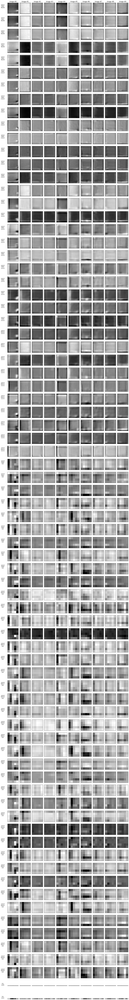

Visualization generated.
Hooks removed successfully.


In [ ]:
# Extract the names of all layers from the model.
all_layer_names = [name for name, layer in model_very_deep.named_modules() if name]

# Create a list of layers to visualize, EXCLUDING 'drop' AND 'pool'.
# This is the line that fixes the error.
layers_to_visualize = [name for name in all_layer_names if 'drop' not in name and 'pool' not in name]

print(f"Layers to be visualized: {layers_to_visualize}")
print("-" * 30)

try:
    # Set the model to evaluation mode
    arch_very_deep.model.eval()

    # Attach hooks using the corrected, filtered list
    arch_very_deep.attach_hooks(layers_to_hook=layers_to_visualize)
    print("Hooks attached successfully.")

    # Get a batch of images
    torch.manual_seed(42)
    images, labels = next(iter(val_loader))
    images = images.to(arch_very_deep.device)

    # Pass the images through the model
    output = arch_very_deep.model(images)
    print("Data propagated through the model.")

    # Visualize the outputs
    print("Generating visualization of feature maps...")
    fig = arch_very_deep.visualize_outputs(layers=layers_to_visualize)
    plt.show()
    print("Visualization generated.")

    # Remove the hooks
    arch_very_deep.remove_hooks()
    print("Hooks removed successfully.")

except Exception as e:
    print(f"\nAn unexpected error occurred: {e}")

## **Variação dos hiperparâmetros**

In [ ]:
# Set a new, descriptive name for this experiment
mlflow.set_experiment("Deeper Network Optimization (CNN vs VeryDeepCNN)")

def get_predictions(architecture, data_loader):
    all_preds = []
    all_labels = []
    architecture.model.eval()
    with torch.no_grad():
        for images, labels in data_loader:
            images = images.to(architecture.device)
            outputs = architecture.model(images)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    return all_preds, all_labels

def objective_deep(trial):
    with mlflow.start_run():
        params = {
            'n_feature': trial.suggest_int('n_feature', 4, 16),
            'dropout_rate': trial.suggest_float('dropout_rate', 0.1, 0.5),
            'lr': trial.suggest_float('lr', 1e-5, 1e-3, log=True)
        }
        mlflow.log_params(params)

        model = VeryDeepCNN(n_feature=params['n_feature'], p=params['dropout_rate'])

        optimizer = optim.Adam(model.parameters(), lr=params['lr'])
        arch = Architecture(model, multi_loss_fn, optimizer)
        arch.set_loaders(train_loader, val_loader)

        n_epochs = 15
        arch.train(n_epochs)

        # The rest of the function for logging metrics and artifacts remains exactly the same.
        for epoch in range(n_epochs):
            mlflow.log_metric('train_loss', arch.losses[epoch], step=epoch)
            mlflow.log_metric('val_loss', arch.val_losses[epoch], step=epoch)

        all_preds, all_labels = get_predictions(arch, val_loader)
        class_names = val_data.classes
        cm = confusion_matrix(all_labels, all_preds)
        plt.figure(figsize=(12, 10))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
        plt.title('Confusion Matrix', fontsize=16)
        plt.ylabel('True Label')
        plt.xlabel('Predicted Label')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.savefig("confusion_matrix.png")
        mlflow.log_artifact("confusion_matrix.png", "plots")
        plt.close()

        final_val_loss = arch.val_losses[-1]
        mlflow.log_metric('final_val_loss', final_val_loss)

        return final_val_loss

In [ ]:
study = optuna.create_study(direction='minimize')
study.optimize(objective_deep, n_trials=20) # 20 models test, for exemple

print("\nEstudo de otimização finalizado!")

[I 2025-07-08 21:03:39,793] A new study created in memory with name: no-name-1b440669-bcc9-4512-8019-be8e6653232b
[I 2025-07-08 21:13:11,481] Trial 0 finished with value: 0.8975098543661706 and parameters: {'n_feature': 6, 'dropout_rate': 0.22443251299667924, 'lr': 0.0005612529146547314}. Best is trial 0 with value: 0.8975098543661706.
[I 2025-07-08 21:27:49,506] Trial 1 finished with value: 0.7992426651985721 and parameters: {'n_feature': 15, 'dropout_rate': 0.19292365690105304, 'lr': 0.0003859161972110903}. Best is trial 1 with value: 0.7992426651985721.
[I 2025-07-08 21:35:43,493] Trial 2 finished with value: 1.7310007994479322 and parameters: {'n_feature': 4, 'dropout_rate': 0.2827840225163081, 'lr': 1.5987372874014198e-05}. Best is trial 1 with value: 0.7992426651985721.
[I 2025-07-08 21:47:11,195] Trial 3 finished with value: 1.4113318856726302 and parameters: {'n_feature': 9, 'dropout_rate': 0.37246271595770053, 'lr': 2.7808174571533148e-05}. Best is trial 1 with value: 0.799242


Estudo de otimização finalizado!


In [ ]:
experiment_name = "Deeper Network Optimization (CNN vs VeryDeepCNN)"

print(f"Buscando resultados para o experimento: '{experiment_name}'")

try:
    # Busca o experimento pelo nome
    experiment = mlflow.get_experiment_by_name(experiment_name)

    if experiment is None:
        print(f"Erro: Experimento '{experiment_name}' não encontrado.")
    else:
        experiment_id = experiment.experiment_id

        # Busca TODOS os runs (ensaios) do experimento
        runs_df = mlflow.search_runs(experiment_ids=[experiment_id])

        if runs_df.empty:
            print("Nenhum run encontrado neste experimento.")
        else:
            print(f"Encontrados {len(runs_df)} resultados no experimento.")

            # Salva o DataFrame completo em um arquivo CSV
            csv_filename = "resultados_completos_otimizacao_mais_camadas.csv"
            runs_df.to_csv(csv_filename, index=False)

            print(f"\nResultados exportados com sucesso para o arquivo: '{csv_filename}'")

            # Exibe as primeiras linhas da tabela de resultados
            print("\nAmostra dos resultados:")
            display(runs_df.head())

except Exception as e:
    print(f"\nOcorreu um erro inesperado: {e}")
    print("Verifique se o nome do experimento está correto e se o estudo já foi executado.")

Buscando resultados para o experimento: 'Deeper Network Optimization (CNN vs VeryDeepCNN)'
Encontrados 21 resultados no experimento.

Resultados exportados com sucesso para o arquivo: 'resultados_completos_otimizacao_mais_camadas.csv'

Amostra dos resultados:


,run_id,experiment_id,status,artifact_uri,start_time,end_time,metrics.train_loss,metrics.final_val_loss,metrics.val_loss,params.lr,params.dropout_rate,params.n_feature,tags.mlflow.source.name,tags.mlflow.runName,tags.mlflow.source.type,tags.mlflow.user
0,fcbf4c4aa3a946ed8414e2bfe101f2d8,185552419399938459,FINISHED,file:///content/mlruns/185552419399938459/fcbf...,2025-07-09 00:48:59.610000+00:00,2025-07-09 01:02:37.495000+00:00,1.087598,1.064750,1.064750,6.0084704965296055e-05,0.2051876672248468,14,/usr/local/lib/python3.11/dist-packages/colab_...,capable-auk-759,LOCAL,root
1,e4077de4d92645bd98f20bbee2b1a8ba,185552419399938459,FINISHED,file:///content/mlruns/185552419399938459/e407...,2025-07-09 00:37:09.194000+00:00,2025-07-09 00:48:59.604000+00:00,0.756598,0.816025,0.816025,0.0005460705737052612,0.28717276431227556,11,/usr/local/lib/python3.11/dist-packages/colab_...,capable-auk-759,LOCAL,root
2,846d4bc2fb824331940262d9de842e40,185552419399938459,FINISHED,file:///content/mlruns/185552419399938459/846d...,2025-07-09 00:23:25.742000+00:00,2025-07-09 00:37:09.189000+00:00,0.662270,0.860910,0.860910,0.0005044160361078356,0.18372800320490698,14,/usr/local/lib/python3.11/dist-packages/colab_...,capable-auk-759,LOCAL,root
3,fb164686bb324c89aa463076ba839452,185552419399938459,FINISHED,file:///content/mlruns/185552419399938459/fb16...,2025-07-09 00:09:41.380000+00:00,2025-07-09 00:23:25.736000+00:00,0.983323,0.950201,0.950201,0.00011734298964494861,0.3025758752628049,14,/usr/local/lib/python3.11/dist-packages/colab_...,capable-auk-759,LOCAL,root
4,dbbc77b8a35c416e8fe54b6dc200b040,185552419399938459,FINISHED,file:///content/mlruns/185552419399938459/dbbc...,2025-07-08 23:56:09.136000+00:00,2025-07-09 00:09:41.375000+00:00,0.982445,0.973924,0.973924,0.00010942195232712868,0.18424738120844864,13,/usr/local/lib/python3.11/dist-packages/colab_...,capable-auk-759,LOCAL,root


In [ ]:
#Carregar os Dados do Arquivo CSV

try:
    # Certifique-se de que o arquivo CSV está no mesmo ambiente
    df_results = pd.read_csv("resultados_completos_otimizacao_mais_camadas.csv")
    print("✅ Arquivo CSV carregado com sucesso!")
except FileNotFoundError:
    print("❌ Erro: Arquivo 'resultados_completos_otimizacao.csv' não encontrado.")
    # Se der este erro, faça o upload do arquivo para o Colab.
    df_results = None

# Exibe as primeiras linhas da tabela de resultados
print("\nAmostra dos resultados:")
display(df_results)

✅ Arquivo CSV carregado com sucesso!

Amostra dos resultados:


,run_id,experiment_id,status,artifact_uri,start_time,end_time,metrics.train_loss,metrics.final_val_loss,metrics.val_loss,params.lr,params.dropout_rate,params.n_feature,tags.mlflow.source.name,tags.mlflow.runName,tags.mlflow.source.type,tags.mlflow.user
0,fcbf4c4aa3a946ed8414e2bfe101f2d8,185552419399938459,FINISHED,file:///content/mlruns/185552419399938459/fcbf...,2025-07-09 00:48:59.610000+00:00,2025-07-09 01:02:37.495000+00:00,1.087598,1.064750,1.064750,0.000060,0.205188,14,/usr/local/lib/python3.11/dist-packages/colab_...,capable-auk-759,LOCAL,root
1,e4077de4d92645bd98f20bbee2b1a8ba,185552419399938459,FINISHED,file:///content/mlruns/185552419399938459/e407...,2025-07-09 00:37:09.194000+00:00,2025-07-09 00:48:59.604000+00:00,0.756598,0.816025,0.816025,0.000546,0.287173,11,/usr/local/lib/python3.11/dist-packages/colab_...,capable-auk-759,LOCAL,root
2,846d4bc2fb824331940262d9de842e40,185552419399938459,FINISHED,file:///content/mlruns/185552419399938459/846d...,2025-07-09 00:23:25.742000+00:00,2025-07-09 00:37:09.189000+00:00,0.662270,0.860910,0.860910,0.000504,0.183728,14,/usr/local/lib/python3.11/dist-packages/colab_...,capable-auk-759,LOCAL,root
3,fb164686bb324c89aa463076ba839452,185552419399938459,FINISHED,file:///content/mlruns/185552419399938459/fb16...,2025-07-09 00:09:41.380000+00:00,2025-07-09 00:23:25.736000+00:00,0.983323,0.950201,0.950201,0.000117,0.302576,14,/usr/local/lib/python3.11/dist-packages/colab_...,capable-auk-759,LOCAL,root
4,dbbc77b8a35c416e8fe54b6dc200b040,185552419399938459,FINISHED,file:///content/mlruns/185552419399938459/dbbc...,2025-07-08 23:56:09.136000+00:00,2025-07-09 00:09:41.375000+00:00,0.982445,0.973924,0.973924,0.000109,0.184247,13,/usr/local/lib/python3.11/dist-packages/colab_...,capable-auk-759,LOCAL,root
5,cb1de2fc81e94ef6878957211a3bf8b0,185552419399938459,FINISHED,file:///content/mlruns/185552419399938459/cb1d...,2025-07-08 23:42:21.133000+00:00,2025-07-08 23:56:09.130000+00:00,0.681439,0.773453,0.773453,0.000402,0.165713,14,/usr/local/lib/python3.11/dist-packages/colab_...,capable-auk-759,LOCAL,root
6,be93ccd84c784e0ea8aa77c208b3efcb,185552419399938459,FINISHED,file:///content/mlruns/185552419399938459/be93...,2025-07-08 23:28:42.132000+00:00,2025-07-08 23:42:21.127000+00:00,0.833757,0.862242,0.862242,0.000187,0.157213,13,/usr/local/lib/python3.11/dist-packages/colab_...,capable-auk-759,LOCAL,root
7,318bb78bd97f43cb9888d1bcb35b6c6c,185552419399938459,FINISHED,file:///content/mlruns/185552419399938459/318b...,2025-07-08 23:14:00.238000+00:00,2025-07-08 23:28:42.116000+00:00,0.630676,0.805920,0.805920,0.000372,0.100551,16,/usr/local/lib/python3.11/dist-packages/colab_...,capable-auk-759,LOCAL,root
8,7d04976717a047238e580e44e10b88e1,185552419399938459,FINISHED,file:///content/mlruns/185552419399938459/7d04...,2025-07-08 22:59:33.570000+00:00,2025-07-08 23:14:00.233000+00:00,0.532369,0.816001,0.816001,0.000961,0.100900,16,/usr/local/lib/python3.11/dist-packages/colab_...,capable-auk-759,LOCAL,root
9,75a47c1b3f9d4f84a9621c2fa1b4f52b,185552419399938459,FINISHED,file:///content/mlruns/185552419399938459/75a4...,2025-07-08 22:44:58.036000+00:00,2025-07-08 22:59:33.564000+00:00,0.572098,0.846384,0.846384,0.000993,0.136480,16,/usr/local/lib/python3.11/dist-packages/colab_...,capable-auk-759,LOCAL,root


**Melhor modelo**

✅ CSV file loaded successfully!

--- 🏆 Details of the Best Model (from CSV) ---
Final Validation Loss: 0.77345

Best Model's Parameters:
   - lr: 0.0004015310606355
   - dropout_rate: 0.1657131376638259
   - n_feature: 14


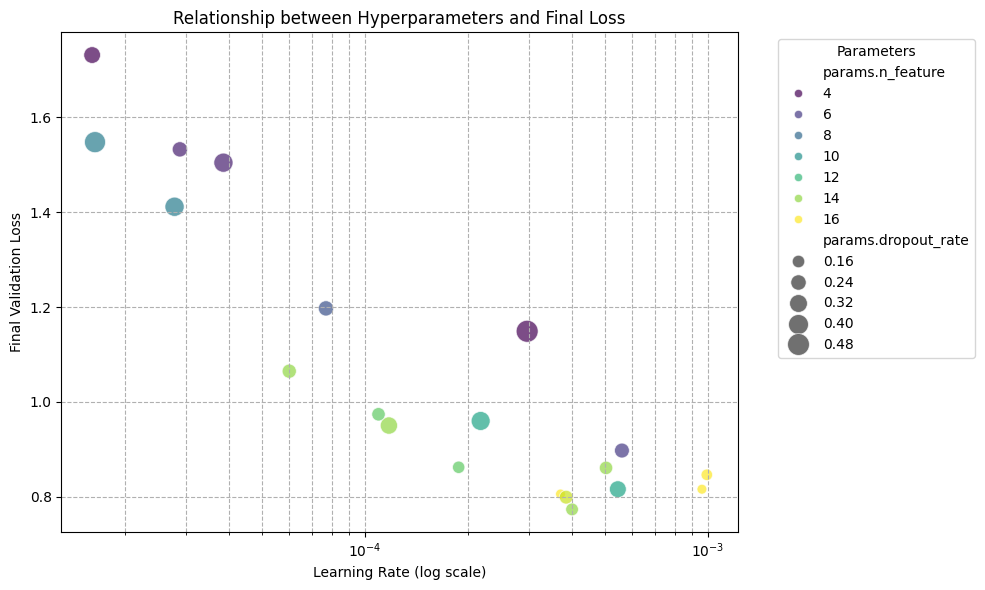

In [ ]:
try:
    # Make sure the CSV file is in the same environment
    df_results = pd.read_csv("resultados_completos_otimizacao_mais_camadas.csv")
    print("✅ CSV file loaded successfully!")
except FileNotFoundError:
    print("❌ Error: 'resultados_completos_otimizacao.csv' file not found.")
    # If this error occurs, upload the file to your Colab environment.
    df_results = None

if df_results is not None:
    # Sorts the DataFrame by the lowest final validation loss
    best_run_from_csv = df_results.sort_values(by="metrics.final_val_loss").iloc[0]

    print("\n--- 🏆 Details of the Best Model (from CSV) ---")
    print(f"Final Validation Loss: {best_run_from_csv['metrics.final_val_loss']:.5f}")

    print("\nBest Model's Parameters:")
    # Filter columns to get only those starting with 'params.'
    param_cols = [col for col in df_results.columns if col.startswith('params.')]
    for param in param_cols:
        param_name = param.replace('params.', '')
        param_value = best_run_from_csv[param]
        print(f"   - {param_name}: {param_value}")

    # Create a scatter plot to see the relationship between learning rate and final loss
    plt.figure(figsize=(10, 6))
    sns.scatterplot(
        data=df_results,
        x="params.lr",
        y="metrics.final_val_loss",
        hue="params.n_feature",      # Color by number of features
        size="params.dropout_rate",  # Size by dropout rate
        sizes=(50, 250),
        palette='viridis',
        alpha=0.7
    )
    plt.title("Relationship between Hyperparameters and Final Loss")
    plt.xlabel("Learning Rate (log scale)")
    plt.ylabel("Final Validation Loss")
    plt.xscale('log')
    plt.grid(True, which='both', linestyle='--')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Parameters')
    plt.tight_layout()
    plt.show()


🏆 Melhor Run Encontrado! ID: cb1de2fc81e94ef6878957211a3bf8b0
   - Loss de Validação Final: 0.77345

Parâmetros do Melhor Modelo (para recriá-lo):
   - lr: 0.0004015310606355265
   - dropout_rate: 0.1657131376638259
   - n_feature: 14


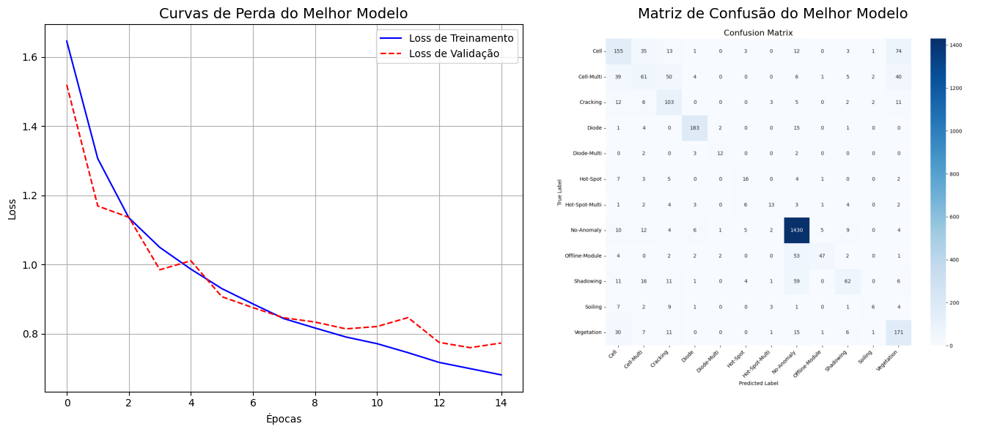

In [ ]:
experiment_name = "Deeper Network Optimization (CNN vs VeryDeepCNN)"

# Busca todos os runs do nosso experimento, ordenando pelo menor 'final_val_loss'
best_run = mlflow.search_runs(
    experiment_names=[experiment_name],
    order_by=["metrics.final_val_loss ASC"],
    max_results=1
)

if best_run.empty:
    print(f"Nenhum run encontrado para o experimento: '{experiment_name}'. Execute a otimização primeiro.")
else:
    # Pega o ID do melhor run
    best_run_id = best_run.loc[0, 'run_id']
    print(f"🏆 Melhor Run Encontrado! ID: {best_run_id}")
    print(f"   - Loss de Validação Final: {best_run.loc[0, 'metrics.final_val_loss']:.5f}")

    # Imprimir os Hiperparâmetros do Melhor Modelo
    print("\nParâmetros do Melhor Modelo (para recriá-lo):")
    # Filtra as colunas para pegar apenas as que começam com 'params.'
    best_params = {col.replace('params.', ''): best_run.loc[0, col] for col in best_run.columns if col.startswith('params.')}
    for param_name, param_value in best_params.items():
        # Formata o valor para ser mais legível
        if isinstance(param_value, float):
            print(f"   - {param_name}: {param_value:.6f}")
        else:
            print(f"   - {param_name}: {param_value}")

    # Para buscar as métricas de cada época, precisamos do cliente do MLflow
    client = mlflow.tracking.MlflowClient()

    # Busca o histórico de métricas para o nosso melhor run
    train_loss_history = client.get_metric_history(best_run_id, "train_loss")
    val_loss_history = client.get_metric_history(best_run_id, "val_loss")

    # Extrai os valores para plotagem
    train_losses = [m.value for m in train_loss_history]
    val_losses = [m.value for m in val_loss_history]

    plt.figure(figsize=(14, 6))
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Loss de Treinamento', color='blue')
    plt.plot(val_losses, label='Loss de Validação', color='red', linestyle='--')
    plt.title('Curvas de Perda do Melhor Modelo', fontsize=14)
    plt.xlabel('Épocas')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Baixa o artefato (a imagem da matriz de confusão) do melhor run
    try:
        # Define o caminho local para onde o artefato será baixado
        local_path = client.download_artifacts(run_id=best_run_id, path="plots/confusion_matrix.png")

        # Carrega e exibe a imagem
        img = mpimg.imread(local_path)

        plt.subplot(1, 2, 2)
        plt.imshow(img)
        plt.title('Matriz de Confusão do Melhor Modelo', fontsize=14)
        plt.axis('off')

    except Exception as e:
        print(f"\nNão foi possível carregar a matriz de confusão: {e}")

    plt.tight_layout()
    plt.show()

--- Starting Generation of the Full Report for All Runs ---

Found 21 runs. Generating a report for each one...

🔬 ANALYZING RUN #1 / 21
Run ID: cb1de2fc81e94ef6878957211a3bf8b0
Final Validation Loss: 0.77345

Parameters:
   - lr: 0.0004015310606355265
   - dropout_rate: 0.1657131376638259
   - n_feature: 14


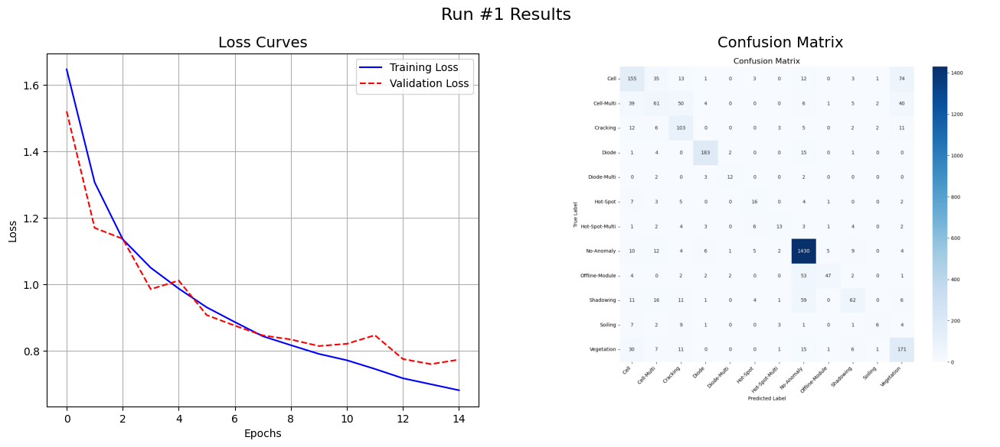


🔬 ANALYZING RUN #2 / 21
Run ID: 511311558f234b23b791d00f18426c45
Final Validation Loss: 0.79924

Parameters:
   - lr: 0.0003859161972110903
   - dropout_rate: 0.19292365690105304
   - n_feature: 15


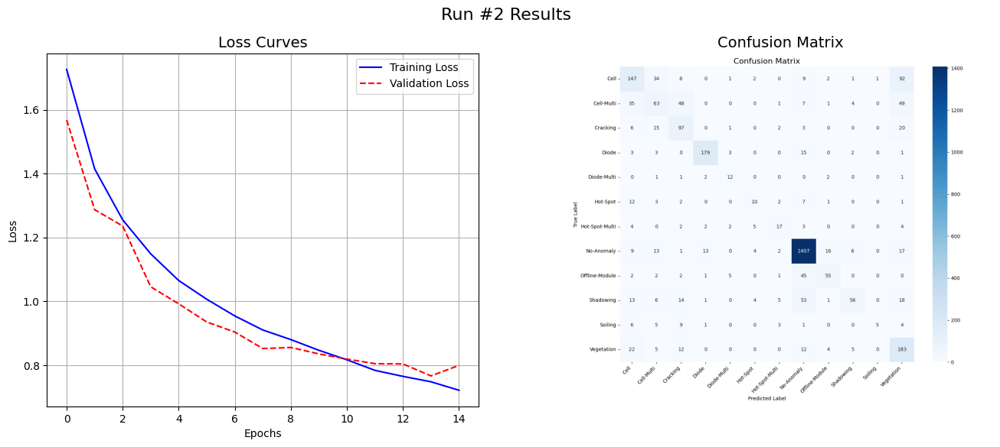


🔬 ANALYZING RUN #3 / 21
Run ID: 318bb78bd97f43cb9888d1bcb35b6c6c
Final Validation Loss: 0.80592

Parameters:
   - lr: 0.0003715209120050281
   - dropout_rate: 0.10055128630375226
   - n_feature: 16


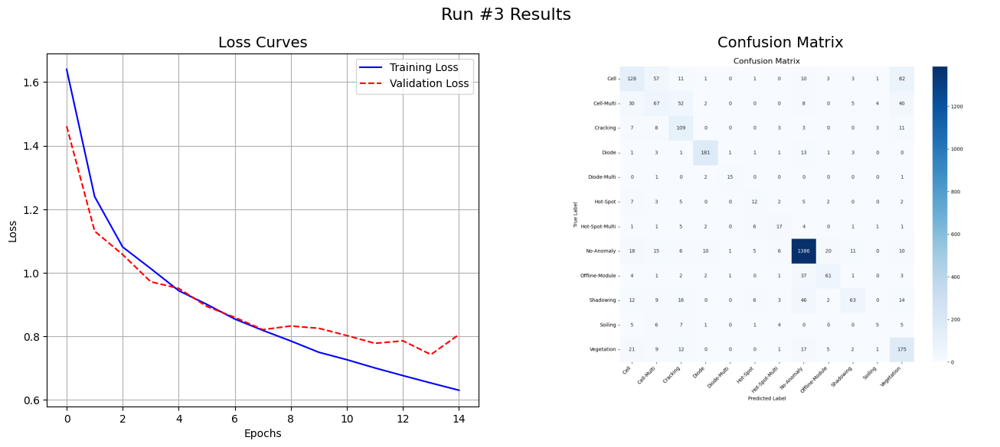


🔬 ANALYZING RUN #4 / 21
Run ID: 7d04976717a047238e580e44e10b88e1
Final Validation Loss: 0.81600

Parameters:
   - lr: 0.0009606453610287319
   - dropout_rate: 0.1009002690970526
   - n_feature: 16


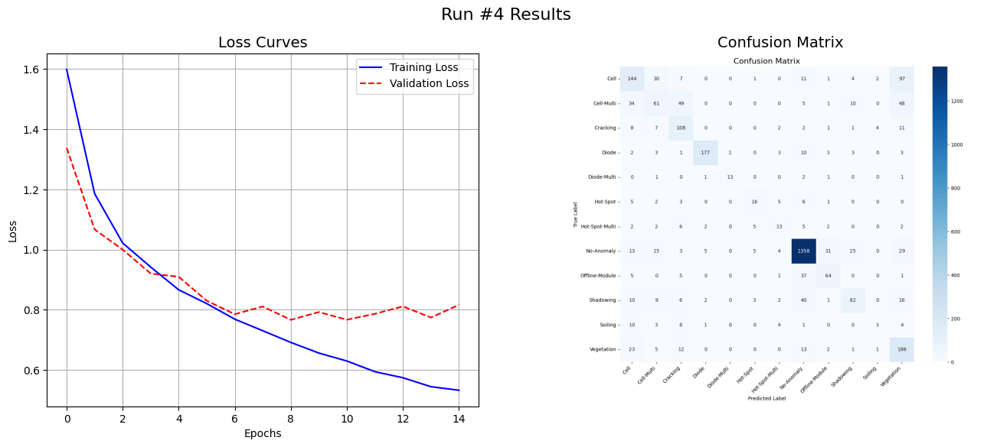


🔬 ANALYZING RUN #5 / 21
Run ID: e4077de4d92645bd98f20bbee2b1a8ba
Final Validation Loss: 0.81603

Parameters:
   - lr: 0.0005460705737052612
   - dropout_rate: 0.28717276431227556
   - n_feature: 11


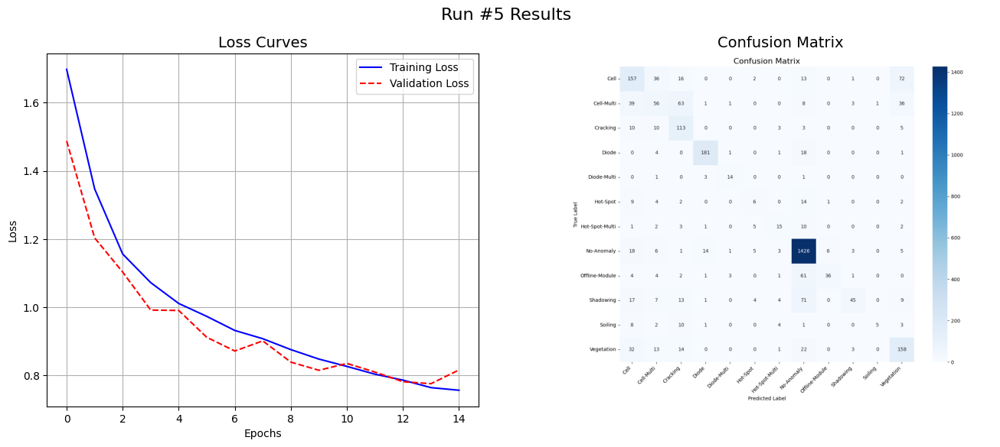


🔬 ANALYZING RUN #6 / 21
Run ID: 75a47c1b3f9d4f84a9621c2fa1b4f52b
Final Validation Loss: 0.84638

Parameters:
   - lr: 0.000992616960237259
   - dropout_rate: 0.13648041890557172
   - n_feature: 16


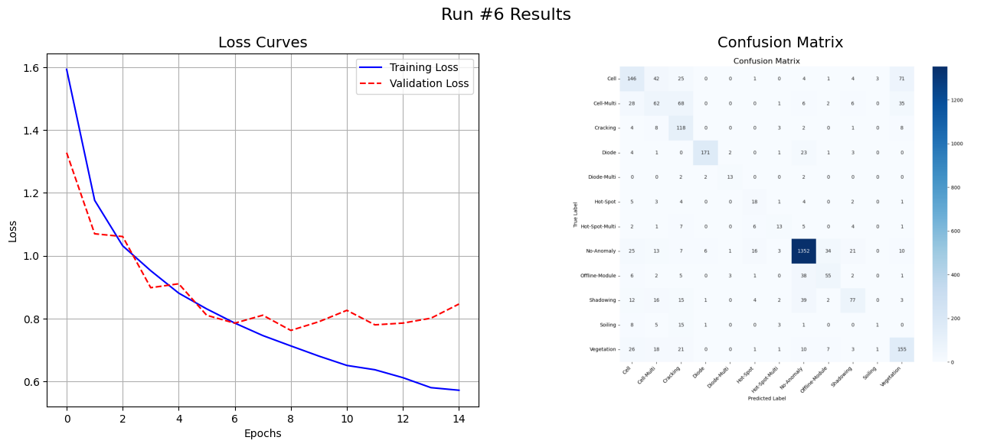


🔬 ANALYZING RUN #7 / 21
Run ID: 846d4bc2fb824331940262d9de842e40
Final Validation Loss: 0.86091

Parameters:
   - lr: 0.0005044160361078356
   - dropout_rate: 0.18372800320490698
   - n_feature: 14


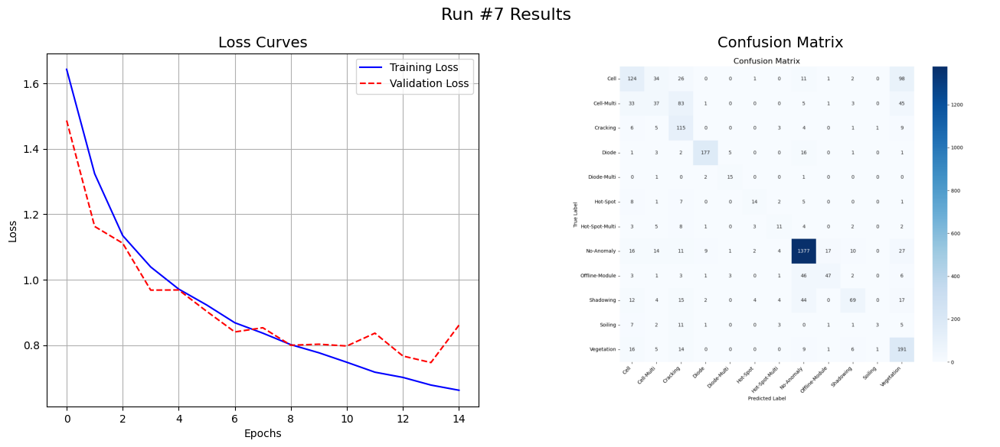


🔬 ANALYZING RUN #8 / 21
Run ID: be93ccd84c784e0ea8aa77c208b3efcb
Final Validation Loss: 0.86224

Parameters:
   - lr: 0.0001874636935857371
   - dropout_rate: 0.1572129461210075
   - n_feature: 13


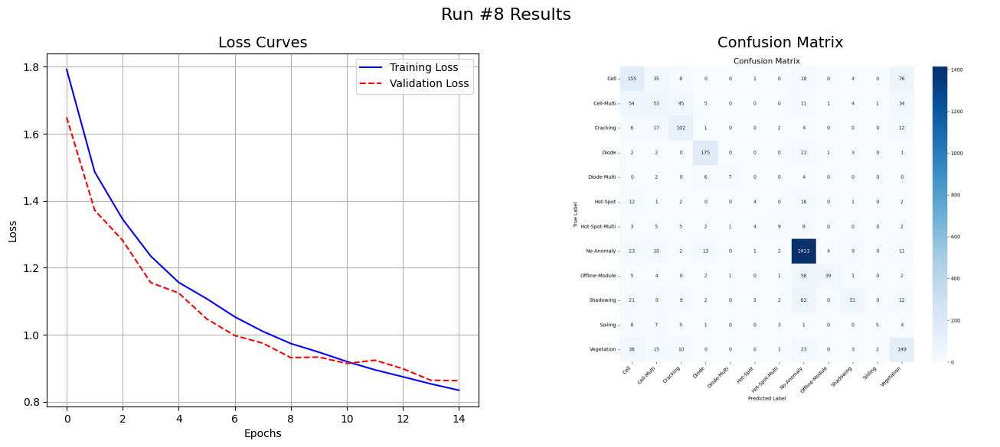


🔬 ANALYZING RUN #9 / 21
Run ID: 880dfdea564c46b8a8b129847c3da425
Final Validation Loss: 0.89751

Parameters:
   - lr: 0.0005612529146547314
   - dropout_rate: 0.22443251299667924
   - n_feature: 6


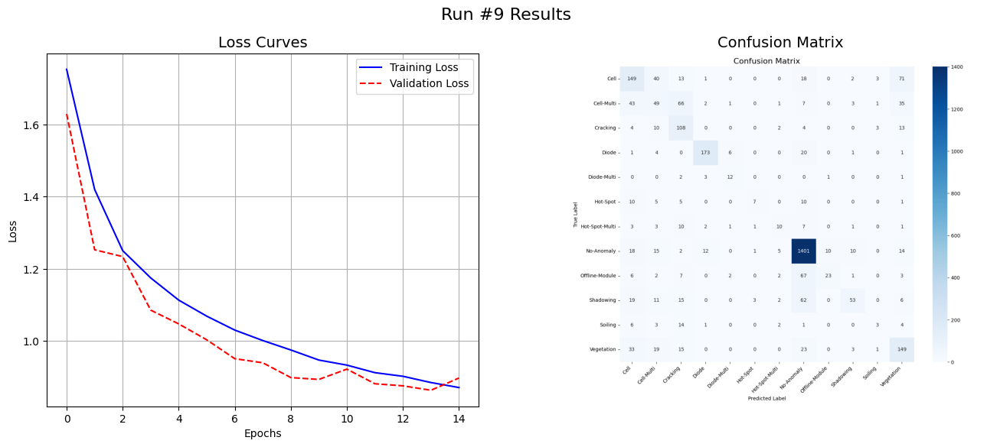


🔬 ANALYZING RUN #10 / 21
Run ID: fb164686bb324c89aa463076ba839452
Final Validation Loss: 0.95020

Parameters:
   - lr: 0.00011734298964494861
   - dropout_rate: 0.3025758752628049
   - n_feature: 14


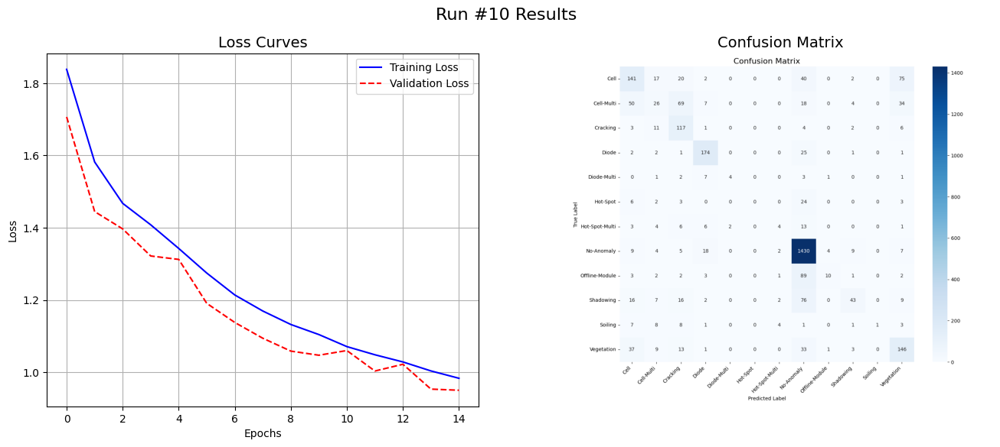


🔬 ANALYZING RUN #11 / 21
Run ID: b7fc8bccb06f495c89ea536d105cd1d5
Final Validation Loss: 0.95983

Parameters:
   - lr: 0.0002173015369204778
   - dropout_rate: 0.3625572977403727
   - n_feature: 11


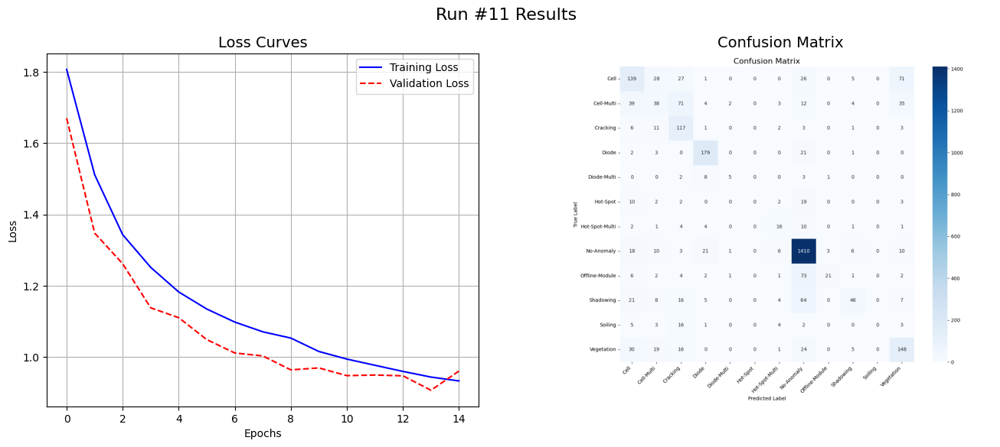


🔬 ANALYZING RUN #12 / 21
Run ID: dbbc77b8a35c416e8fe54b6dc200b040
Final Validation Loss: 0.97392

Parameters:
   - lr: 0.00010942195232712868
   - dropout_rate: 0.18424738120844864
   - n_feature: 13


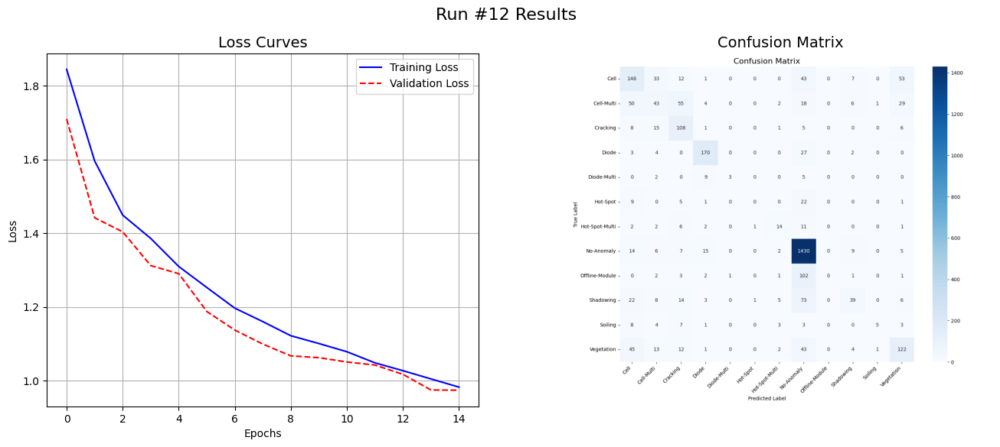


🔬 ANALYZING RUN #13 / 21
Run ID: fcbf4c4aa3a946ed8414e2bfe101f2d8
Final Validation Loss: 1.06475

Parameters:
   - lr: 6.0084704965296055e-05
   - dropout_rate: 0.2051876672248468
   - n_feature: 14


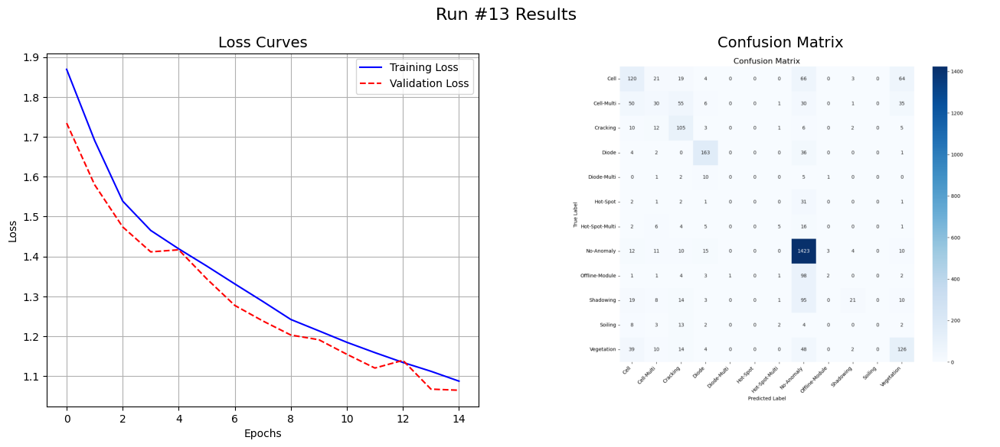


🔬 ANALYZING RUN #14 / 21
Run ID: 59ee032133fd40b0bfb005d2222ca05e
Final Validation Loss: 1.14887

Parameters:
   - lr: 0.0002969675468318725
   - dropout_rate: 0.48502775195943704
   - n_feature: 4


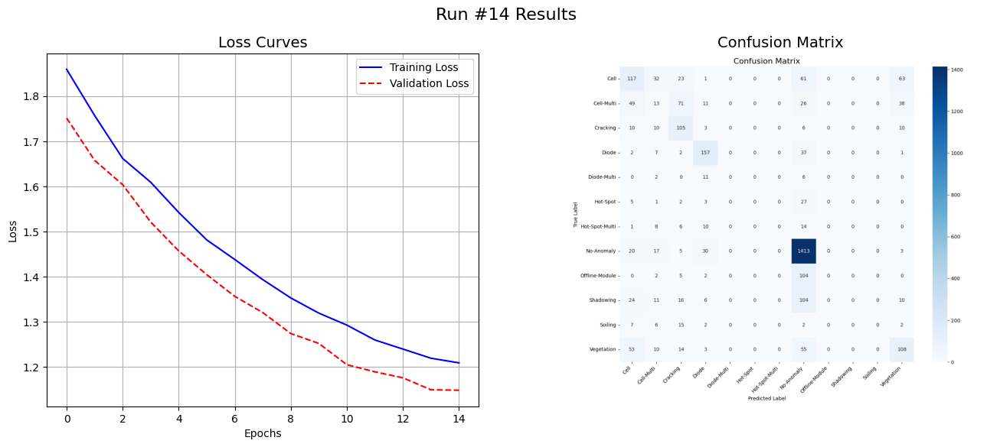


🔬 ANALYZING RUN #15 / 21
Run ID: 6dde7754538f46d29a810c37814be660
Final Validation Loss: 1.19712

Parameters:
   - lr: 7.68772106125664e-05
   - dropout_rate: 0.23581135424192665
   - n_feature: 7


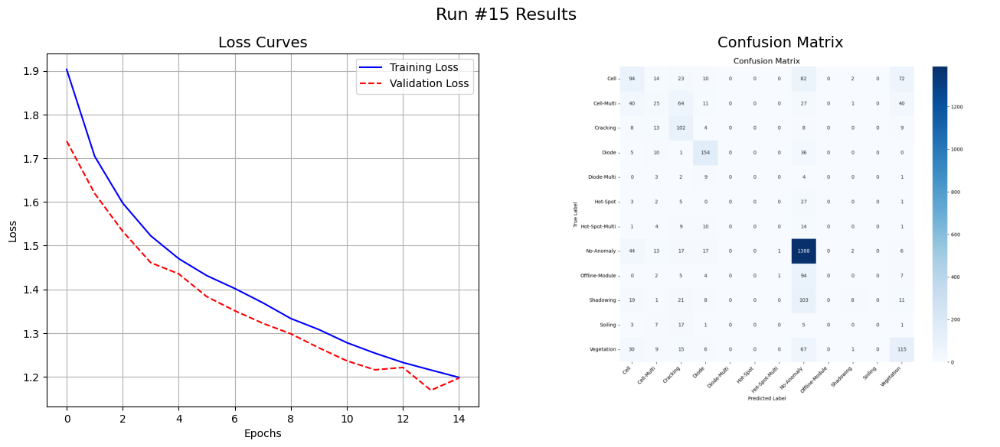


🔬 ANALYZING RUN #16 / 21
Run ID: c556c95a294d426e989e95a7a3dddcfd
Final Validation Loss: 1.41133

Parameters:
   - lr: 2.7808174571533148e-05
   - dropout_rate: 0.37246271595770053
   - n_feature: 9


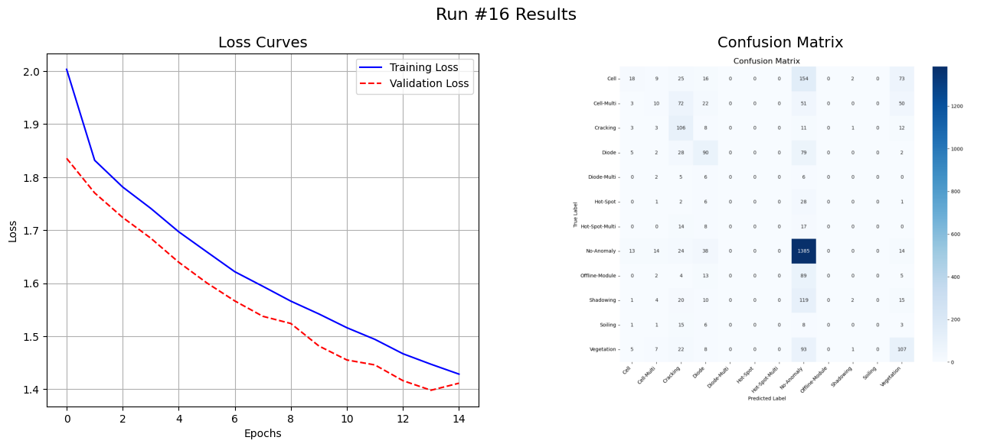


🔬 ANALYZING RUN #17 / 21
Run ID: 5766adf1c2d9457cb5ef490c2732dcca
Final Validation Loss: 1.50419

Parameters:
   - lr: 3.861395226465472e-05
   - dropout_rate: 0.369770455276363
   - n_feature: 5


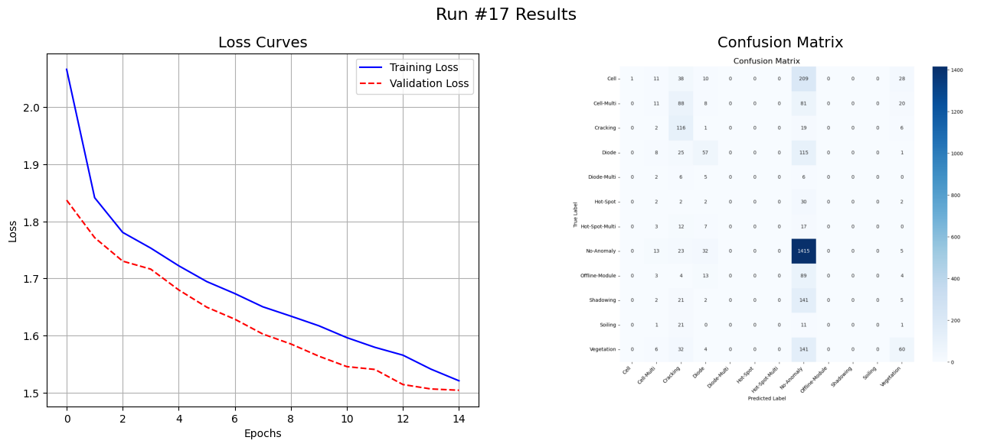


🔬 ANALYZING RUN #18 / 21
Run ID: 47ca981bd126424ab767059630f76617
Final Validation Loss: 1.53227

Parameters:
   - lr: 2.8818539854405568e-05
   - dropout_rate: 0.23612056012168747
   - n_feature: 5


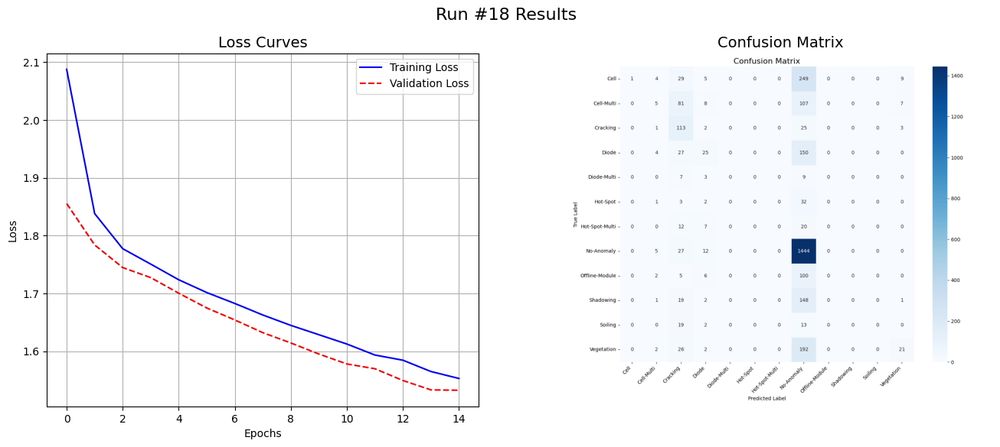


🔬 ANALYZING RUN #19 / 21
Run ID: c0df753a21ad4e5881d9dc0fa6b77be3
Final Validation Loss: 1.54745

Parameters:
   - lr: 1.6299199013353253e-05
   - dropout_rate: 0.4456340409489391
   - n_feature: 9


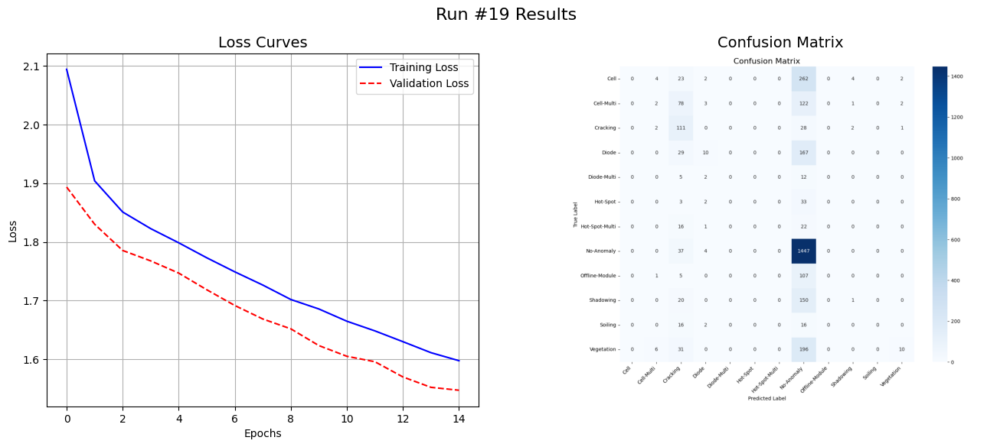


🔬 ANALYZING RUN #20 / 21
Run ID: da4c8f02b0624066a344b1b4dacc45c9
Final Validation Loss: 1.73100

Parameters:
   - lr: 1.5987372874014198e-05
   - dropout_rate: 0.2827840225163081
   - n_feature: 4


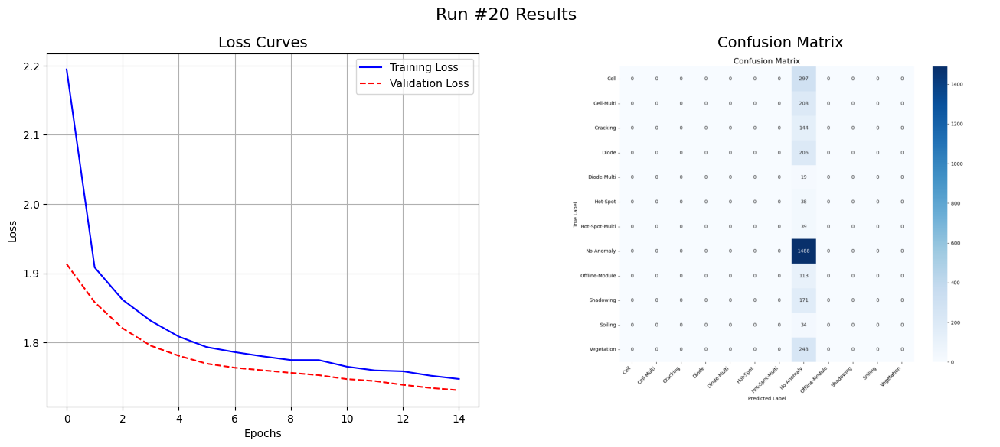


🔬 ANALYZING RUN #21 / 21
Run ID: 050894ad6bfb4fa88a1e5086a7e73059
Final Validation Loss: nan

Parameters:
   - lr: 1.070304140581241e-05
   - dropout_rate: 0.47663073362070785
   - n_feature: 16


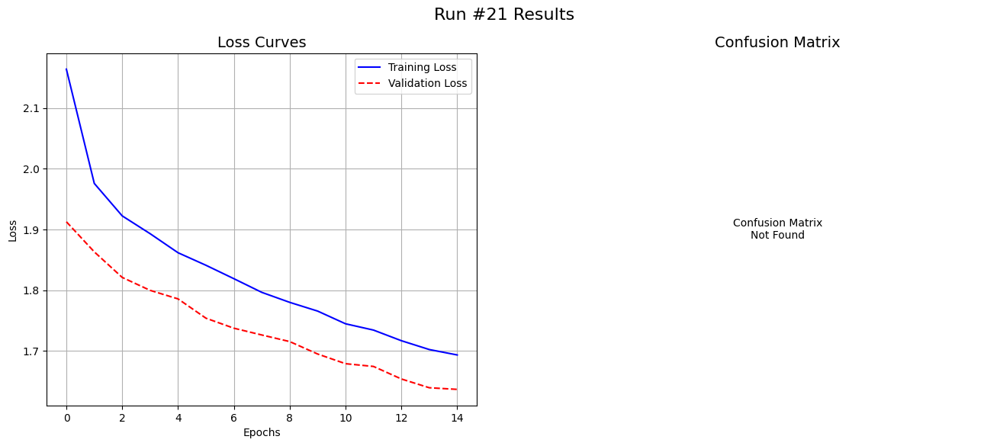


✅ Full report generated successfully!


In [ ]:
print("--- Starting Generation of the Full Report for All Runs ---")

try:
    # Fetch ALL runs from the correct experiment for the deeper network
    all_runs_df = mlflow.search_runs(
        experiment_names=["Deeper Network Optimization (CNN vs VeryDeepCNN)"], # MODIFIED
        # Sort so the best models appear first in the report
        order_by=["metrics.final_val_loss ASC"]
    )

    if all_runs_df.empty:
        print("\nNo runs found. Please run the optimization first.")
    else:
        print(f"\nFound {len(all_runs_df)} runs. Generating a report for each one...")
        # Create the MLflow client to be used inside the loop
        client = mlflow.tracking.MlflowClient()

        # --- 2. Loop to Print and Plot Each Run ---

        for index, run in all_runs_df.iterrows():
            # Get basic info for the current run
            run_id = run['run_id']
            final_loss = run['metrics.final_val_loss']

            # Print a header to separate the runs
            print("\n" + "="*80)
            print(f"🔬 ANALYZING RUN #{index + 1} / {len(all_runs_df)}")
            print(f"Run ID: {run_id}")
            print(f"Final Validation Loss: {final_loss:.5f}")

            # Print the parameters
            print("\nParameters:")
            param_cols = [col for col in run.index if col.startswith('params.')]
            for param in param_cols:
                param_name = param.replace('params.', '')
                param_value = run[param]
                print(f"   - {param_name}: {param_value}")

            # Fetch the metric history for the current run
            train_loss_history = client.get_metric_history(run_id, "train_loss")
            val_loss_history = client.get_metric_history(run_id, "val_loss")

            train_losses = [m.value for m in train_loss_history]
            val_losses = [m.value for m in val_loss_history]

            # Create the figure for the plots
            fig, axes = plt.subplots(1, 2, figsize=(16, 6))
            fig.suptitle(f'Run #{index + 1} Results', fontsize=16)

            # Loss Curves Plot
            axes[0].plot(train_losses, label='Training Loss', color='blue')
            axes[0].plot(val_losses, label='Validation Loss', color='red', linestyle='--')
            axes[0].set_title('Loss Curves', fontsize=14)
            axes[0].set_xlabel('Epochs')
            axes[0].set_ylabel('Loss')
            axes[0].legend()
            axes[0].grid(True)

            # Confusion Matrix Plot
            try:
                local_path = client.download_artifacts(run_id=run_id, path="plots/confusion_matrix.png")
                img = mpimg.imread(local_path)
                axes[1].imshow(img)
                axes[1].set_title('Confusion Matrix', fontsize=14)
                axes[1].axis('off')
            except Exception as e:
                axes[1].text(0.5, 0.5, 'Confusion Matrix\nNot Found', horizontalalignment='center', verticalalignment='center')
                axes[1].set_title('Confusion Matrix', fontsize=14)
                axes[1].axis('off')

            # Show the plots for the current run before moving to the next
            plt.show()

        print("\n" + "="*80)
        print("✅ Full report generated successfully!")

except Exception as e:
    print(f"\nAn error occurred while generating the report: {e}")

## Testagem do melhor modelo

In [ ]:
torch.manual_seed(42)

model_very_deep_best_parameters = VeryDeepCNN(n_feature=14, p=0.1657131376638259)
multi_loss_fn_best_parameters = nn.CrossEntropyLoss(reduction='mean')
optimizer_very_deep_best_parameters = optim.Adam(model_very_deep_best_parameters.parameters(), lr=0.0004015310606355)

#Training

arch_very_deep_best_parameters = Architecture(model_very_deep_best_parameters,
                              multi_loss_fn_best_parameters,
                              optimizer_very_deep_best_parameters)

arch_very_deep_best_parameters.set_loaders(train_loader, val_loader)

print("--- Training the Deeper Network (VeryDeepCNN) ---")
arch_very_deep_best_parameters.train(20) #number of epochs
print("--- Training Complete ---")

--- Training the Deeper Network (VeryDeepCNN) ---
--- Training Complete ---


In [ ]:
optimizer_very_deep_best_parameters.state_dict()

{'state': {0: {'step': tensor(21260.),
   'exp_avg': tensor([[[[ 6.9515e-04,  7.4178e-04,  2.0396e-04],
             [ 4.2913e-03,  3.9881e-03,  3.5198e-03],
             [ 9.3792e-03,  9.1965e-03,  8.3030e-03]],
   
            [[ 6.9515e-04,  7.4178e-04,  2.0396e-04],
             [ 4.2913e-03,  3.9881e-03,  3.5198e-03],
             [ 9.3792e-03,  9.1965e-03,  8.3030e-03]],
   
            [[ 6.9515e-04,  7.4178e-04,  2.0396e-04],
             [ 4.2913e-03,  3.9881e-03,  3.5198e-03],
             [ 9.3792e-03,  9.1965e-03,  8.3030e-03]]],
   
   
           [[[ 7.4068e-03,  1.0046e-02,  1.1075e-02],
             [ 1.5172e-02,  1.7141e-02,  1.8680e-02],
             [ 2.1777e-02,  2.3462e-02,  2.4452e-02]],
   
            [[ 7.4068e-03,  1.0046e-02,  1.1075e-02],
             [ 1.5172e-02,  1.7141e-02,  1.8680e-02],
             [ 2.1777e-02,  2.3462e-02,  2.4452e-02]],
   
            [[ 7.4068e-03,  1.0046e-02,  1.1075e-02],
             [ 1.5172e-02,  1.7141e-02,  1.8680e-02],
  

In [ ]:
arch_very_deep_best_parameters.count_parameters()

97738

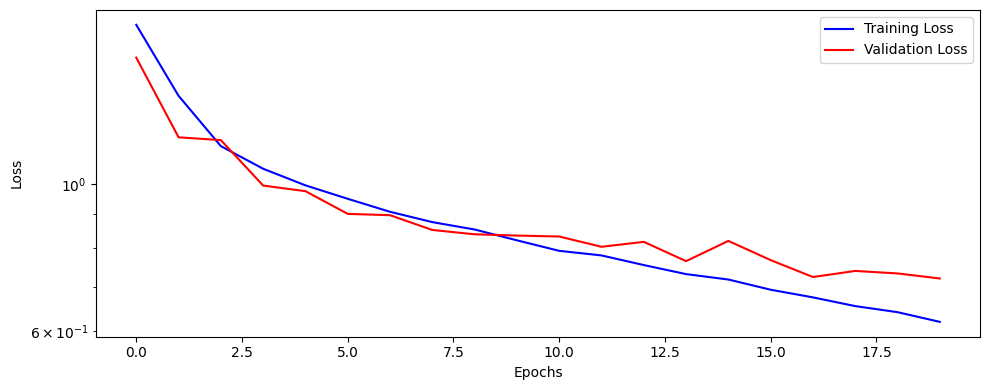

In [ ]:
fig = arch_very_deep_best_parameters.plot_losses()

In [ ]:
acc_train_vdbp = (lambda x: x[0].item() / x[1].item())(Architecture.loader_apply(train_loader, arch_very_deep_best_parameters.correct).sum(axis=0))
acc_val_vdbp = (lambda x: x[0].item() / x[1].item())(Architecture.loader_apply(val_loader, arch_very_deep_best_parameters.correct).sum(axis=0))

print(f"Acurácia de treinamento do modelo: {acc_train_vdbp}")
print(f"Acurácia de validação do modelo: {acc_val_vdbp}")

Acurácia de treinamento do modelo: 0.8306470588235294
Acurácia de validação do modelo: 0.7656666666666667


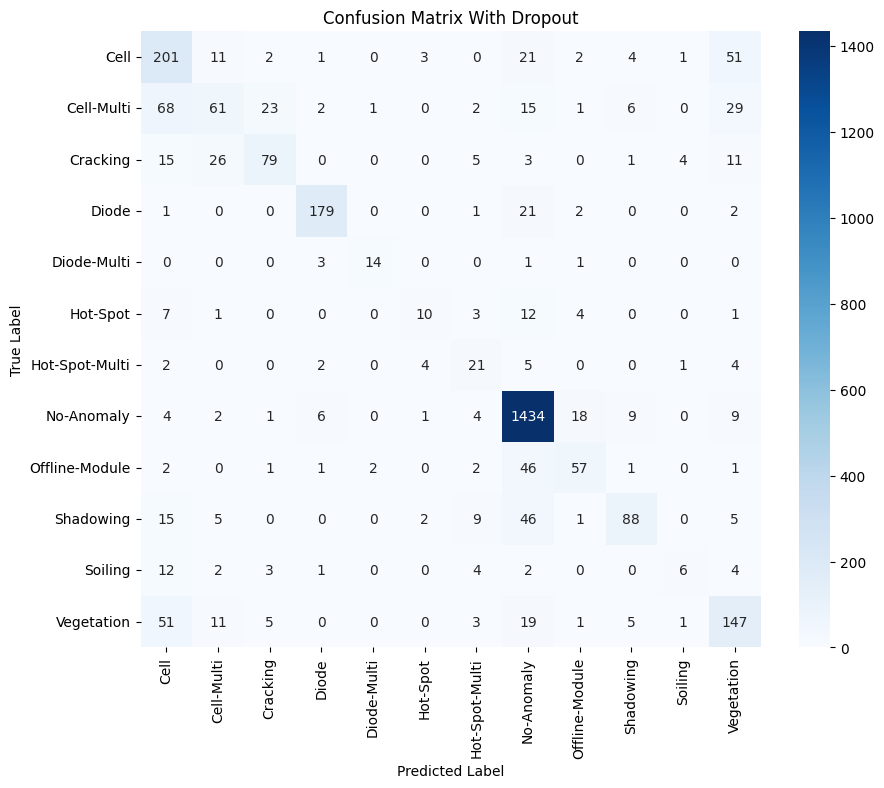

In [ ]:
cm_arch_vdbp = plot_confusion_matrix(arch_very_deep_best_parameters)

In [ ]:
precision_per_class_vdbp = class_precision(cm_arch_vdbp)
print("\nPrecisão por Classe (derivada da matriz de confusão):")
class_names = val_data.classes # Assuming val_data.classes holds the class names
for i, precision in enumerate(precision_per_class_vdbp):
    print(f"  Classe '{class_names[i]}': {precision:.4f}")


Precisão por Classe (derivada da matriz de confusão):
  Classe 'Cell': 0.5317
  Classe 'Cell-Multi': 0.5126
  Classe 'Cracking': 0.6930
  Classe 'Diode': 0.9179
  Classe 'Diode-Multi': 0.8235
  Classe 'Hot-Spot': 0.5000
  Classe 'Hot-Spot-Multi': 0.3889
  Classe 'No-Anomaly': 0.8825
  Classe 'Offline-Module': 0.6552
  Classe 'Shadowing': 0.7719
  Classe 'Soiling': 0.4615
  Classe 'Vegetation': 0.5568


In [ ]:
class_counts_val = np.bincount(val_data.targets)
weighted_avg_precision = weighted_precision(cm_arch_vdbp, class_counts_val)
print(f"\nMédia ponderada da precisão (ponderada pela quantidade de amostras): {weighted_avg_precision:.4f}")


Média ponderada da precisão (ponderada pela quantidade de amostras): 0.7578
